In [1]:
!pip install -U "jax[cuda12]"
!pip install chex
!pip install dm-haiku
!pip install optax
!pip install distrax
!pip install tensorflow[and-cuda]
!pip install tensorflow-datasets

In [2]:
import jax
import jax.numpy as jnp
import haiku as hk
import distrax
import chex
import numpy as np
import optax
import matplotlib.pyplot as plt
import time

2024-12-25 20:07:13.354536: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1735186033.362386 1365333 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1735186033.364667 1365333 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
# Use a EBM formulation of likelihod vs a score formulation of likelihood
ebm = True

# Number of diffusion timesteps to train
n_steps = 100
data_dim = 2

In [4]:
import math

import haiku as hk
import jax
import jax.numpy as jnp
import numpy as np
import optax

import functools

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

In [5]:
# Define a simple MLP Diffusion Model
class ResnetDiffusionModel(hk.Module):
  """Resnet score model.

  Adds embedding for each scale after each linear layer.
  """

  def __init__(self,
               n_steps,
               n_layers,
               x_dim,
               h_dim,
               emb_dim,
               widen=2,
               emb_type='learned',
               name=None):
    assert emb_type in ('learned', 'sinusoidal')
    super().__init__(name=name)
    self._n_layers = n_layers
    self._n_steps = n_steps
    self._x_dim = x_dim
    self._h_dim = h_dim
    self._emb_dim = emb_dim
    self._widen = widen
    self._emb_type = emb_type

  def __call__(self, x, t):

    x = jnp.atleast_2d(x)
    t = jnp.atleast_1d(t)

    chex.assert_shape(x, (None, self._x_dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x, t], [jnp.float32, jnp.int64])

    if self._emb_type == 'learned':
      emb = hk.Embed(self._n_steps, self._emb_dim)(t)
    else:
      emb = timestep_embedding(t, self._emb_dim)

    x = hk.Linear(self._h_dim)(x)

    for _ in range(self._n_layers):
      # get layers and embeddings
      layer_h = hk.Linear(self._h_dim * self._widen)
      layer_emb = hk.Linear(self._h_dim * self._widen)
      layer_int = hk.Linear(self._h_dim * self._widen)
      layer_out = hk.Linear(self._h_dim, w_init=jnp.zeros)

      h = hk.LayerNorm(-1, True, True)(x)
      h = jax.nn.swish(h)
      h = layer_h(h)
      h += layer_emb(emb)
      h = jax.nn.swish(h)
      h = layer_int(h)
      h = jax.nn.swish(h)
      h = layer_out(h)
      x += h

    x = hk.Linear(self._x_dim, w_init=jnp.zeros)(x)
    chex.assert_shape(x, (None, self._x_dim))
    return x

In [6]:
# Define a energy diffusion model (wrapper around a normal diffusion model)
class EBMDiffusionModel(hk.Module):
  """EBM parameterization on top of score model.

  Adds embedding for each scale after each linear layer.
  """

  def __init__(self, net, name=None):
    super().__init__(name=name)
    self.net = net

  def neg_logp_unnorm(self, x, t):
    score = self.net(x, t)
    return ((score - x) ** 2).sum(-1)

  def __call__(self, x, t):
    neg_logp_unnorm = lambda _x: self.neg_logp_unnorm(_x, t).sum()
    return hk.grad(neg_logp_unnorm)(x)


In [7]:
# Define how to multiply two different EBM distributions together
class ProductEBMDiffusionModel(hk.Module):
  """EBM where we compose two distributions together.

  Add the energy value together
  """

  def __init__(self, net, net2, name=None):
    super().__init__(name=name)
    self.net = net
    self.net2 = net2

  def neg_logp_unnorm(self, x, t):
    unorm_1 = self.net.neg_logp_unnorm(x, t)
    unorm_2 = self.net2.neg_logp_unnorm(x, t)
    return unorm_1 + unorm_2

  def __call__(self, x, t):
    score = (self.net(x, t) + self.net2(x, t))
    return score

In [8]:
# Define how to add two different EBM distributions
class MixtureEBMDiffusionModel(hk.Module):
  """EBM where we compose two distributions together.

  Take the logsumexp of the energies
  """

  def __init__(self, net, net2, name=None):
    super().__init__(name=name)
    self.net = net
    self.net2 = net2

  def neg_logp_unnorm(self, x, t):
    unorm_1 = self.net.neg_logp_unnorm(x, t)
    unorm_2 = self.net2.neg_logp_unnorm(x, t)
    concat_energy = jnp.stack([unorm_1, unorm_2], axis=-1)
    energy = -jax.scipy.special.logsumexp(-concat_energy*3.5, -1)

    return energy

  def __call__(self, x, t):
    neg_logp_unnorm = lambda _x: self.neg_logp_unnorm(_x, t).sum()
    return hk.grad(neg_logp_unnorm)(x)

In [9]:
class NegationEBMDiffusionModel(hk.Module):
  """EBM where we compose two distributions together.

  Negate one distribution
  """

  def __init__(self, net, net2, name=None):
    super().__init__(name=name)
    self.net = net
    self.net2 = net2

  def neg_logp_unnorm(self, x, t):
    unorm_1 = self.net.neg_logp_unnorm(x, t)
    unorm_2 = self.net2.neg_logp_unnorm(x, t)
    return 1.3 * unorm_1 - 0.3 * unorm_2

  def __call__(self, x, t):
    neg_logp_unnorm = lambda _x: self.neg_logp_unnorm(_x, t).sum()
    return hk.grad(neg_logp_unnorm)(x)

In [10]:
def extract(a: chex.Array,
           t: chex.Array,
           x_shape) -> chex.Array:
 """Get coefficients at given timesteps and reshape to [batch_size, 1, ...]."""
 chex.assert_rank(t, 1)
 bs, = t.shape
 assert x_shape[0] == bs
 a = jax.device_put(a)
 out = a[t]

 assert out.shape[0] == bs

 return out.reshape([bs] + (len(x_shape) - 1) * [1])


In [11]:
def cosine_beta_schedule(timesteps, s=0.008):
    steps = timesteps + 1
    x = np.linspace(0, timesteps, steps, dtype=np.float64)
    alphas_cumprod = np.cos(((x / timesteps) + s) / (1 + s) * np.pi * 0.5)**2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return np.clip(betas, 0, 0.999)

Below is the code for a simple diffusion trainer

In [12]:
# Simple diffusion model training
class PortableDiffusionModel(hk.Module):
  """Basic Diffusion Model."""

  def __init__(self,
               dim,
               n_steps,
               net,
               loss_type='simple',
               mc_loss=True,
               var_type='learned',
               samples_per_step=1,
               name=None):
    super().__init__(name=name)
    assert var_type in ('beta_forward', 'beta_reverse', 'learned')
    self._var_type = var_type
    self.net = net
    self._n_steps = n_steps
    self._dim = dim
    self._loss_type = loss_type
    self._mc_loss = mc_loss
    self._samples_per_step = samples_per_step
    self._betas = cosine_beta_schedule(n_steps)

    self._alphas = 1. - self._betas
    self._log_alphas = jnp.log(self._alphas)

    alphas = 1. - self._betas

    self._sqrt_alphas = jnp.array(jnp.sqrt(alphas), dtype=jnp.float32)
    self._sqrt_recip_alphas = jnp.array(1. / jnp.sqrt(alphas), dtype=jnp.float32)

    self._alphas_cumprod = jnp.cumprod(self._alphas, axis=0)
    self._alphas_cumprod_prev = jnp.append(1., self._alphas_cumprod[:-1])
    self._sqrt_alphas_cumprod = jnp.sqrt(self._alphas_cumprod)
    self._sqrt_one_minus_alphas_cumprod = jnp.sqrt(1 - self._alphas_cumprod)
    self._log_one_minus_alphas_cumprod = jnp.log(1 - self._alphas_cumprod)

    self._sqrt_recip_alphas_cumprod = jax.lax.rsqrt(self._alphas_cumprod)
    self._sqrt_recipm1_alphas_cumprod = jnp.sqrt(1 / self._alphas_cumprod - 1)
    self._sqrt_recipm1_alphas_cumprod_custom = jnp.sqrt(1. / (1 - self._alphas_cumprod))

    # calculations for posterior q(x_{t-1} | x_t, x_0)
    self._posterior_variance = self._betas * (
        1. - self._alphas_cumprod_prev) / (1. - self._alphas_cumprod)

    self._posterior_log_variance_clipped = jnp.log(
        jnp.clip(self._posterior_variance, a_min=jnp.min(self._betas)))
    self._posterior_mean_coef1 = self._betas * jnp.sqrt(
        self._alphas_cumprod_prev) / (1 - self._alphas_cumprod)
    self._posterior_mean_coef2 = (1 - self._alphas_cumprod_prev) * jnp.sqrt(
        self._alphas) / (1 - self._alphas_cumprod)

    self._out_logvar = hk.get_parameter('out_logvar',
                                        shape=(n_steps,),
                                        init=hk.initializers.Constant(
                                            jnp.log(self._betas)))
  def energy_scale(self, t):
    return self._sqrt_recipm1_alphas_cumprod[t]

  def data_scale(self, t):
    return self._sqrt_recip_alphas_cumprod[t]

  def forward(self, x, t):
    """Get mu_t-1 given x_t."""
    x = jnp.atleast_2d(x)
    t = jnp.atleast_1d(t)

    chex.assert_shape(x, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type(t, jnp.int64)

    outs = self.net(x, t)
    chex.assert_shape(outs, x.shape)
    return outs

  def stats(self):
    """Returns static variables for computing variances."""
    return {
        'betas': self._betas,
        'alphas': self._alphas,
        'alphas_cumprod': self._alphas_cumprod,
        'alphas_cumprod_prev': self._alphas_cumprod_prev,
        'sqrt_alphas_cumprod': self._sqrt_alphas_cumprod,
        'sqrt_one_minus_alphas_cumprod': self._sqrt_one_minus_alphas_cumprod,
        'log_one_minus_alphas_cumprod': self._log_one_minus_alphas_cumprod,
        'sqrt_recip_alphas_cumprod': self._sqrt_recip_alphas_cumprod,
        'sqrt_recipm1_alphas_cumprod': self._sqrt_recipm1_alphas_cumprod,
        'posterior_variance': self._posterior_variance,
        'posterior_log_variace_clipped': self._posterior_log_variance_clipped
    }

  def q_mean_variance(self, x_0, t):
    """Returns parameters of q(x_t | x_0)."""
    mean = extract(self._sqrt_alphas_cumprod, t, x_0.shape) * x_0
    variance = extract(1. - self._alphas_cumprod, t, x_0.shape)
    log_variance = extract(self._log_one_minus_alphas_cumprod, t, x_0.shape)
    return mean, variance, log_variance

  def q_sample(self, x_0, t, noise=None):
    """Sample from q(x_t | x_0)."""
    chex.assert_shape(x_0, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x_0, t], [jnp.float32, jnp.int64])

    if noise is None:
      noise = jax.random.normal(hk.next_rng_key(), x_0.shape)

    x_t = extract(self._sqrt_alphas_cumprod, t, x_0.shape) * x_0 + extract(
        self._sqrt_one_minus_alphas_cumprod, t, x_0.shape) * noise
    chex.assert_shape(x_t, x_0.shape)
    return x_t

  def p_loss_simple(self, x_0, t):
    """Training loss for given x_0 and t."""
    chex.assert_shape(x_0, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x_0, t], [jnp.float32, jnp.int64])

    noise = jax.random.normal(hk.next_rng_key(), x_0.shape)
    x_noise = self.q_sample(x_0, t, noise)
    noise_recon = self.forward(x_noise, t)
    chex.assert_shape(noise_recon, x_0.shape)
    mse = jnp.square(noise_recon - noise)

    chex.assert_shape(mse, (t.shape[0], self._dim))
    mse = jnp.mean(mse, axis=1)  # avg over the output dimension

    chex.assert_shape(mse, t.shape)
    return mse

  def p_loss_kl(self, x_0, t):
    """Training loss for given x_0 and t (KL-weighted)."""
    chex.assert_shape(x_0, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x_0, t], [jnp.float32, jnp.int64])

    x_t = self.q_sample(x_0, t)
    q_mean, _, q_log_variance = self.q_posterior(x_0, x_t, t)
    p_mean, _, p_log_variance = self.p_mean_variance(x_t, t)

    dist_q = distrax.Normal(q_mean, jnp.exp(0.5 * q_log_variance))
    def _loss(pmu, plogvar):
      dist_p = distrax.Normal(pmu, jnp.exp(0.5 * plogvar))
      kl = dist_q.kl_divergence(dist_p).mean(-1)
      nll = -dist_p.log_prob(x_0).mean(-1)
      return kl, nll, jnp.where(t == 0, nll, kl)

    kl, nll, loss = _loss(p_mean, p_log_variance)

    chex.assert_equal_shape([nll, kl])
    chex.assert_shape(loss, (t.shape[0],))
    return loss

  def q_posterior(self, x_0, x_t, t):
    """Obtain parameters of q(x_{t-1} | x_0, x_t)."""
    chex.assert_shape(x_0, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x_0, t], [jnp.float32, jnp.int64])

    mean = (
        extract(self._posterior_mean_coef1, t, x_t.shape) * x_0
        + extract(self._posterior_mean_coef2, t, x_t.shape) * x_t
    )
    var = extract(self._posterior_variance, t, x_t.shape)
    log_var_clipped = extract(self._posterior_log_variance_clipped,
                              t, x_t.shape)
    chex.assert_equal_shape([var, log_var_clipped])
    chex.assert_equal_shape([x_0, x_t, mean])
    return mean, var, log_var_clipped

  def predict_start_from_noise(self, x_t, t, noise):
    """Predict x_0 from x_t."""
    chex.assert_shape(x_t, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x_t, t], [jnp.float32, jnp.int64])

    x_0 = (
        extract(self._sqrt_recip_alphas_cumprod, t, x_t.shape) * x_t
        - extract(self._sqrt_recipm1_alphas_cumprod, t, x_t.shape) * noise
    )
    chex.assert_shape(x_0, x_t.shape)
    return x_0

  def p_mean_variance(self, x, t, clip=jnp.inf):
    """Parameters of p(x_{t-1} | x_t)."""
    chex.assert_shape(x, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x, t], [jnp.float32, jnp.int64])

    x_recon = jnp.clip(
        self.predict_start_from_noise(x, t, noise=self.forward(x, t)), -clip,
        clip)

    mean, var, log_var = self.q_posterior(x_recon, x, t)

    chex.assert_shape(var, (x.shape[0], 1))
    chex.assert_equal_shape([var, log_var])
    chex.assert_shape(mean, x.shape)

    if self._var_type == 'beta_reverse':
      pass
    elif self._var_type == 'beta_forward':
      var = extract(self._betas, t, x.shape)
      log_var = jnp.log(var)
    elif self._var_type == 'learned':
      log_var = extract(self._out_logvar, t, x.shape)
      var = jnp.exp(log_var)
    else:
      raise ValueError(f'{self._var_type} not recognised.')

    chex.assert_shape(var, (x.shape[0], 1))
    chex.assert_equal_shape([var, log_var])
    chex.assert_shape(mean, (x.shape[0], x.shape[1]))
    return mean, var, log_var

  def p_sample(self, x, t, rng_key=None, clip=jnp.inf):
    """Sample from p(x_{t-1} | x_t)."""
    chex.assert_shape(x, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type([x, t], [jnp.float32, jnp.int64])

    mean, _, log_var = self.p_mean_variance(x, t, clip=clip)

    if rng_key is None:
      rng_key = hk.next_rng_key()
    noise = jax.random.normal(rng_key, x.shape)

    x_tm1 = mean + jnp.exp(0.5 * log_var) * noise
    chex.assert_equal_shape([x, x_tm1])
    return x_tm1

  def _prior_kl(self, x_0):
    """KL(q_T(x) || p(x))."""
    t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)
    qt_mean, _, qt_log_variance = self.q_mean_variance(x_0, t)
    qt_dist = distrax.Normal(qt_mean, jnp.exp(0.5 * qt_log_variance))
    p_dist = distrax.Normal(jnp.zeros_like(qt_mean), jnp.ones_like(qt_mean))
    kl = qt_dist.kl_divergence(p_dist).mean(-1)
    chex.assert_shape(kl, (x_0.shape[0],))
    return kl

  def logpx(self, x_0):
    """Full elbo estimate of model."""
    e = self._prior_kl(x_0)
    chex.assert_shape(e, (x_0.shape[0],))
    n_repeats = self._n_steps * self._samples_per_step
    e = e.repeat(n_repeats, axis=0) / n_repeats

    kls = self.loss_all_t(x_0, loss_type='kl')
    logpx = -(kls + e) * self._dim * self._n_steps
    return {'logpx': logpx}

  def sample(self, n, clip=jnp.inf):
    """Sample from p(x)."""
    chex.assert_type(n, int)
    rng_key = hk.next_rng_key()
    rng_key, r = jax.random.split(rng_key)

    x = jax.random.normal(r, (n, self._dim))
    def body_fn(i, inputs):
      rng_key, x = inputs
      rng_key, r = jax.random.split(rng_key)
      j = self._n_steps - 1 - i
      t = jnp.ones((n,), dtype=jnp.int64) * j
      x = self.p_sample(x, t, rng_key=r, clip=clip)
      return rng_key, x

    x = hk.fori_loop(0, self._n_steps, body_fn, (rng_key, x))[1]

    chex.assert_shape(x, (n, self._dim))
    return x

  def loss(self, x):
    if self._mc_loss:
      return self.loss_mc(x, loss_type=self._loss_type)
    else:
      return self.loss_all_t(x, loss_type=self._loss_type)

  def loss_mc(self, x, loss_type=None):
    """Compute training loss, uniformly sampling t's."""
    chex.assert_shape(x, (None, self._dim))

    t = jax.random.randint(hk.next_rng_key(), (x.shape[0],), 0, self._n_steps)
    if loss_type == 'simple':
      loss = self.p_loss_simple(x, t)
      #loss = self.p_loss_simple_cv(x, t)
    elif loss_type == 'kl':
      loss = self.p_loss_kl(x, t)
    else:
      raise ValueError(f'Unrecognized loss type: {loss_type}')

    chex.assert_shape(loss, (x.shape[0],))
    return loss

  def loss_all_t(self, x, loss_type=None):
    """Compute training loss enumerated and averaged over all t's."""
    chex.assert_shape(x, (None, self._dim))
    x = jnp.array(x)
    t = jnp.concatenate([jnp.arange(0, self._n_steps)] * x.shape[0])
    t = jnp.tile(t[None], (self._samples_per_step,)).reshape(-1)
    x_r = jnp.tile(x[None], (self._n_steps * self._samples_per_step,)).reshape(-1, *x.shape[1:])
    chex.assert_equal_shape_prefix((x_r, t), 1)

    if loss_type == 'simple':
      loss = self.p_loss_simple(x_r, t)
    elif loss_type == 'kl':
      loss = self.p_loss_kl(x_r, t)
    else:
      raise ValueError(f'Unrecognized loss type: {loss_type}')
    return loss

  def p_gradient(self, x, t, clip=jnp.inf):
    """Compute mean and variance of Gaussian reverse model p(x_{t-1} | x_t)."""
    b = x.shape[0]
    # chex.assert_axis_dimension(t, 0, b)
    gradient = self.forward(x, t)
    gradient = gradient * extract(self._sqrt_recipm1_alphas_cumprod_custom, t, gradient.shape)

    return gradient

  def p_energy(self, x, t, clip=jnp.inf):
    """Compute mean and variance of Gaussian reverse model p(x_{t-1} | x_t)."""
    b = x.shape[0]
    # chex.assert_axis_dimension(t, 0, b)

    x = jnp.atleast_2d(x)
    t = jnp.atleast_1d(t)

    chex.assert_shape(x, (None, self._dim))
    chex.assert_shape(t, (None,))
    # chex.assert_type(t, jnp.int64)

    energy = self.net.neg_logp_unnorm(x, t)
    energy = energy * extract(self._sqrt_recipm1_alphas_cumprod_custom, t, energy.shape)

    return energy

Define different datasets to train diffusion models

In [13]:
def toy_gmm(n_comp=8, std=0.075, radius=0.5):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  means_x = np.cos(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  means_y = np.sin(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  mean = radius * np.concatenate((means_x, means_y), axis=1)
  weights = np.ones(n_comp) / n_comp

  def nll(x):
    means = jnp.array(mean.reshape((-1, 1, 2)))
    c = np.log(n_comp * 2 * np.pi * std**2)
    f = jax.nn.logsumexp(
        jnp.sum(-0.5 * jnp.square((x - means) / std), axis=2), axis=0) + c
    # f = f + np.log(2)

    return f

  def sample(n_samples):
    toy_sample = np.zeros(0).reshape((0, 2, 1, 1))
    sample_group_sz = np.random.multinomial(n_samples, weights)
    for i in range(n_comp):
      sample_group = mean[i] + std * np.random.randn(
          2 * sample_group_sz[i]).reshape(-1, 2, 1, 1)
      toy_sample = np.concatenate((toy_sample, sample_group), axis=0)
      np.random.shuffle(toy_sample)
    data = toy_sample[:, :, 0, 0]

    return data


  return nll, sample

In [14]:
def toy_gauss(radius=0.5):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  std = radius

  def nll(x):
    c = np.log(2 * np.pi * std**2)
    f = -0.5 * jnp.square((x) / std) + c

    return f

  def sample(n_samples):
    data = np.random.randn(n_samples, 2) * radius
    return data


  return nll, sample

In [15]:
def toy_box(scale=1.0):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  def nll(x):
    return 1

  def sample(n_samples):
    data = np.random.uniform(-scale, scale, (n_samples, 2))


    return data


  return nll, sample

In [16]:
def bar(scale=0.2):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  def nll(x):
    return 1

  def sample(n_samples):
    data = np.random.uniform(-1, 1, (n_samples, 2))
    data[:, 0] = data[:, 0] * scale

    return data


  return nll, sample

In [17]:
def bar_horizontal(scale=0.2):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  def nll(x):
    return 1

  def sample(n_samples):
    data = np.random.uniform(-1, 1, (n_samples, 2))
    data[:, 1] = data[:, 1] * scale

    return data


  return nll, sample

In [18]:
def toy_gmm_left(n_comp=8, std=0.075, radius=0.5):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  means_x = np.cos(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  means_y = np.sin(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  mean = radius * np.concatenate((means_x, means_y), axis=1)
  mean = mean[[0, 1, 2, 3]]

  n_comp = mean.shape[0]

  weights = np.ones(n_comp) / n_comp

  def nll(x):

    means = jnp.array(mean.reshape((-1, 1, 2)))
    c = np.log(n_comp * 2 * np.pi * std**2)
    f = jax.nn.logsumexp(
        jnp.sum(-0.5 * jnp.square((x - means) / std), axis=2), axis=0) + c
    # f = f + np.log(2)

    return f

  def sample(n_samples):
    toy_sample = np.zeros(0).reshape((0, 2, 1, 1))
    sample_group_sz = np.random.multinomial(n_samples, weights)
    for i in range(n_comp):
      sample_group = mean[i] + std * np.random.randn(
          2 * sample_group_sz[i]).reshape(-1, 2, 1, 1)
      toy_sample = np.concatenate((toy_sample, sample_group), axis=0)
      np.random.shuffle(toy_sample)
    data = toy_sample[:, :, 0, 0]

    return data


  return nll, sample


def toy_gmm_right(n_comp=8, std=0.075, radius=0.5):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  means_x = np.cos(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  means_y = np.sin(2 * np.pi *
                   np.linspace(0, (n_comp - 1) / n_comp, n_comp)).reshape(
                       n_comp, 1, 1, 1)
  mean = radius * np.concatenate((means_x, means_y), axis=1)
  mean = mean[[4, 5, 6, 7]]
  n_comp = mean.shape[0]

  weights = np.ones(n_comp) / n_comp

  def nll(x):
    means = jnp.array(mean.reshape((-1, 1, 2)))
    c = np.log(n_comp * 2 * np.pi * std**2)
    f = jax.nn.logsumexp(
        jnp.sum(-0.5 * jnp.square((x - means) / std), axis=2), axis=0) + c
    # f = f + np.log(2)

    return f

  def sample(n_samples):
    toy_sample = np.zeros(0).reshape((0, 2, 1, 1))
    sample_group_sz = np.random.multinomial(n_samples, weights)
    for i in range(n_comp):
      sample_group = mean[i] + std * np.random.randn(
          2 * sample_group_sz[i]).reshape(-1, 2, 1, 1)
      toy_sample = np.concatenate((toy_sample, sample_group), axis=0)
      np.random.shuffle(toy_sample)
    data = toy_sample[:, :, 0, 0]

    return data


  return nll, sample

In [19]:
def right_bar(scale=0.1):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  def nll(x):
    return 1

  def sample(n_samples):
    data = np.random.uniform(-1, 1, (n_samples, 2))
    data[:, 0] = data[:, 0] * scale + 0.2

    return data


  return nll, sample

def left_bar(scale=0.1):
  """Ring of 2D Gaussians. Returns energy and sample functions."""

  def nll(x):
    return 1

  def sample(n_samples):
    data = np.random.uniform(-1, 1, (n_samples, 2))
    data[:, 0] = data[:, 0] * scale - 0.2

    return data


  return nll, sample

Define Jax operations for different model compositions

In [20]:
rng_seq = hk.PRNGSequence(0)
seed = next(rng_seq)

def forward_fn_product():
  net_one = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_one = EBMDiffusionModel(net_one)

  net_two = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_two = EBMDiffusionModel(net_two)

  dual_net = ProductEBMDiffusionModel(net_one, net_two)
  ddpm = PortableDiffusionModel(data_dim, n_steps, dual_net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -dual_net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]

  if ebm:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient, ddpm.p_energy)
  else:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient)

forward_product = hk.multi_transform(forward_fn_product)

2024-12-25 20:07:14.843817: W external/xla/xla/service/gpu/nvptx_compiler.cc:765] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.5.82). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


In [21]:
def forward_fn_mixture():
  net_one = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_one = EBMDiffusionModel(net_one)

  net_two = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_two = EBMDiffusionModel(net_two)

  dual_net = MixtureEBMDiffusionModel(net_one, net_two)
  ddpm = PortableDiffusionModel(data_dim, n_steps, dual_net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -dual_net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]

  if ebm:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient, ddpm.p_energy)
  else:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient)

forward_mixture = hk.multi_transform(forward_fn_mixture)

In [22]:
def forward_fn_negation():
  net_one = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_one = EBMDiffusionModel(net_one)

  net_two = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net_two = EBMDiffusionModel(net_two)

  dual_net = NegationEBMDiffusionModel(net_one, net_two)
  ddpm = PortableDiffusionModel(data_dim, n_steps, dual_net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -dual_net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]

  if ebm:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient, ddpm.p_energy)
  else:
    return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm, ddpm.p_gradient)

forward_negation = hk.multi_transform(forward_fn_negation)

In [23]:
if ebm:
  _, dual_product_sample_fn, dual_product_nll, dual_product_logp_unorm_fn, dual_product_gradient_fn, dual_product_energy_fn = forward_product.apply
else:
  _, dual_product_sample_fn, dual_product_nll, dual_product_logp_unorm_fn, dual_product_gradient_fn = forward_product.apply

dual_product_sample_fn = jax.jit(dual_product_sample_fn, static_argnums=2)
dual_product_logp_unnorm_fn = jax.jit(dual_product_logp_unorm_fn)
dual_product_gradient_fn = jax.jit(dual_product_gradient_fn)

if ebm:
  dual_product_energy_fn = jax.jit(dual_product_energy_fn)

dual_product_nll = jax.jit(dual_product_nll)


In [24]:
if ebm:
  _, dual_mixture_sample_fn, dual_mixture_nll, dual_mixture_logp_unorm_fn, dual_mixture_gradient_fn, dual_mixture_energy_fn = forward_mixture.apply
else:
  _, dual_mixture_sample_fn, dual_mixture_nll, dual_mixture_logp_unorm_fn, dual_mixture_gradient_fn = forward_mixture.apply

dual_mixture_sample_fn = jax.jit(dual_mixture_sample_fn, static_argnums=2)
dual_mixture_logp_unnorm_fn = jax.jit(dual_mixture_logp_unorm_fn)
dual_mixture_gradient_fn = jax.jit(dual_mixture_gradient_fn)

if ebm:
  dual_mixture_energy_fn = jax.jit(dual_mixture_energy_fn)

dual_mixture_nll = jax.jit(dual_mixture_nll)

In [25]:
if ebm:
  _, dual_negation_sample_fn, dual_negation_nll, dual_negation_logp_unorm_fn, dual_negation_gradient_fn, dual_negation_energy_fn = forward_negation.apply
else:
  _, dual_negation_sample_fn, dual_negation_nll, dual_negation_logp_unorm_fn, dual_negation_gradient_fn = forward_negation.apply

dual_negation_sample_fn = jax.jit(dual_negation_sample_fn, static_argnums=2)
dual_negation_logp_unnorm_fn = jax.jit(dual_negation_logp_unorm_fn)
dual_negation_gradient_fn = jax.jit(dual_negation_gradient_fn)

if ebm:
  dual_negation_energy_fn = jax.jit(dual_negation_energy_fn)

dual_negation_nll = jax.jit(dual_negation_nll)

Code for different MCMC Samplers

In [26]:
import jax
import jax.numpy as jnp
import distrax
import haiku as hk
# pylint: disable=g-bare-generic
from typing import Callable, Optional, Tuple, Union, Dict
Array = jnp.ndarray
Scalar = Union[float, int]
RandomKey = Array

GradientTarget = Callable[[Array, Array], Array]
InitialSampler = Callable[[Array], Array]

class AnnealedULASampler:
  """Implements AIS with ULA"""

  def __init__(self,
               num_steps: int,
               num_samples_per_step: int,
               step_sizes: jnp.array,
               initial_distribution: distrax.Distribution,
               target_distribution,
               gradient_function):
    assert len(step_sizes) == num_steps, "Must have as many stepsizes as intermediate distributions."
    self._step_sizes = step_sizes
    self._num_steps = num_steps
    self._num_samples_per_step = num_samples_per_step
    self._initial_distribution = initial_distribution
    self._target_distribution = target_distribution
    if target_distribution is None:
      assert gradient_function is not None
      self._gradient_function = gradient_function
    else:
      self._gradient_function = jax.grad(
          lambda x, i: target_distribution(x, i).sum())

    self._total_steps = self._num_samples_per_step * (self._num_steps - 1)

  def transition_distribution(self, i, x):
    ss = self._step_sizes[i]
    std = (2 * ss) ** .5
    grad = self._gradient_function(x, i)
    mu = x + grad * ss
    dist = distrax.MultivariateNormalDiag(mu, jnp.ones_like(mu) * std)
    return dist

  def sample(self, key: RandomKey, n_samples: int):
    init_key, key = jax.random.split(key)
    x = self._initial_distribution.sample(seed=init_key,
                                          sample_shape=(n_samples,))
    logw = -self._initial_distribution.log_prob(x)

    inputs = (key, logw, x)
    def body_fn(i, inputs):
      key, logw, x = inputs
      dist_ind = (i // self._num_samples_per_step)
      dist_forward = self.transition_distribution(dist_ind, x)
      sample_key, key = jax.random.split(key)
      x_hat = dist_forward.sample(seed=sample_key)
      dist_reverse = self.transition_distribution(dist_ind - 1, x_hat)
      logw += dist_reverse.log_prob(x) - dist_forward.log_prob(x_hat)
      x = x_hat
      return key, logw, x

    _, logw, x = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)

    if self._target_distribution is not None:
      logw += self._target_distribution(x, self._num_steps - 1)
    else:
      logw = None

    return x, logw, None

  def logp_raise(self, key: RandomKey, x: jnp.array):
    logw = jnp.zeros((x.shape[0],))

    inputs = (key, logw, x)
    def body_fn(i, inputs):
      key, logw, x = inputs
      ind = i // self._num_samples_per_step
      dist_ind = self._num_steps - 1 - ind
      dist_reverse = self.transition_distribution(dist_ind - 1, x)
      sample_key, key = jax.random.split(key)
      x_hat = dist_reverse.sample(seed=sample_key)
      dist_forward = self.transition_distribution(dist_ind, x_hat)
      logw += dist_forward.log_prob(x) - dist_reverse.log_prob(x_hat)
      x = x_hat
      inputs = key, logw, x
      return key, logw, x

    _, logw, x = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)
    logw += self._initial_distribution.log_prob(x)
    return x, logw



def leapfrog_step(x_0: Array,
                  v_0: Array,
                  gradient_target: GradientTarget,
                  step_size: Array,
                  mass_diag_sqrt: Array,
                  num_steps: int):
  """Multiple leapfrog steps with no metropolis correction."""
  x_k = x_0
  v_k = v_0
  if mass_diag_sqrt is None:
    mass_diag_sqrt = jnp.ones_like(x_k)

  mass_diag = mass_diag_sqrt ** 2.

  for _ in range(num_steps):  # Inefficient version - should combine half steps
    v_k += 0.5 * step_size * gradient_target(x_k)  # half step in v
    x_k += step_size * v_k / mass_diag  # Step in x
    grad = gradient_target(x_k)
    v_k += 0.5 * step_size * grad  # half step in v
  return x_k, v_k



class AnnealedUHASampler:
  """Implements AIS with ULA"""

  def __init__(self,
               num_steps: int,
               num_samples_per_step: int,
               step_sizes: jnp.array,
               damping_coeff: int,
               mass_diag_sqrt: int,
               num_leapfrog_steps: int,
               initial_distribution: distrax.Distribution,
               target_distribution,
               gradient_function):
    assert len(step_sizes) == num_steps, "Must have as many stepsizes as intermediate distributions."
    self._damping_coeff = damping_coeff
    self._mass_diag_sqrt = mass_diag_sqrt
    self._step_sizes = step_sizes
    self._num_steps = num_steps
    self._num_leapfrog_steps = num_leapfrog_steps
    self._num_samples_per_step = num_samples_per_step
    self._initial_distribution = initial_distribution
    self._target_distribution = target_distribution
    if target_distribution is None:
      assert gradient_function is not None
      self._gradient_function = gradient_function
    else:
      self._gradient_function = jax.grad(
          lambda x, i: target_distribution(x, i).sum())

    self._total_steps = self._num_samples_per_step * (self._num_steps - 1)

  def leapfrog_step(self, x, v, i):
      step_size = self._step_sizes[i]
      return leapfrog_step(x, v, lambda _x: self._gradient_function(_x, i), step_size, self._mass_diag_sqrt, self._num_leapfrog_steps)

  def sample(self, key: RandomKey, n_samples: int):
    key, x_key = jax.random.split(key)
    x_k = self._initial_distribution.sample(seed=x_key, sample_shape=(n_samples,))

    v_dist = distrax.MultivariateNormalDiag(
        loc=jnp.zeros_like(x_k),
        scale_diag=jnp.ones_like(x_k) * self._mass_diag_sqrt)

    key, v_key = jax.random.split(key)
    v_k = v_dist.sample(seed=v_key)

    logw = -self._initial_distribution.log_prob(x_k)

    print(x_k.shape, v_k.shape, logw.shape)

    inputs = (key, logw, x_k, v_k)
    def body_fn(i, inputs):
      # unpack inputs
      key, logw, x_k, v_k = inputs
      dist_ind = (i // self._num_samples_per_step)

      eps_key, key = jax.random.split(key)
      eps = jax.random.normal(eps_key, x_k.shape)
      # resample momentum
      v_k_prime = v_k * self._damping_coeff + jnp.sqrt(1. - self._damping_coeff**2) * eps * self._mass_diag_sqrt
      # advance samples
      x_k, v_k = self.leapfrog_step(x_k, v_k_prime, dist_ind)
      # compute change in density
      logp_v_p = v_dist.log_prob(v_k_prime)
      logp_v = v_dist.log_prob(v_k)
      # update importance weights
      logw += logp_v - logp_v_p
      return key, logw, x_k, v_k
    _, logw, x_k, v_k = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)

    if self._target_distribution is not None:
      logw += self._target_distribution(x_k, self._num_steps - 1)
    else:
      logw = None

    return x_k, logw, None

  def logp_raise(self, key: RandomKey, x: jnp.array):
    logw = jnp.zeros((x.shape[0],))
    x_k = x
    v_dist = distrax.MultivariateNormalDiag(
        loc=jnp.zeros_like(x_k),
        scale_diag=jnp.ones_like(x_k) * self._mass_diag_sqrt)

    key, v_key = jax.random.split(key)
    v_k = v_dist.sample(seed=v_key)

    inputs = (key, logw, x_k, v_k)
    def body_fn(i, inputs):
      key, logw, x_k, v_k = inputs
      ind = i // self._num_samples_per_step
      dist_ind = self._num_steps - 1 - ind - 1

      eps_key, key = jax.random.split(key)
      eps = jax.random.normal(eps_key, x_k.shape)
      # resample momentum
      v_k_prime = v_k * self._damping_coeff + jnp.sqrt(1. - self._damping_coeff**2) * eps * self._mass_diag_sqrt
      # advance samples
      x_k, v_k = self.leapfrog_step(x_k, v_k_prime, dist_ind)

      logp_v_p = v_dist.log_prob(v_k_prime)
      logp_v = v_dist.log_prob(v_k)
      # update importance weights
      logw += logp_v - logp_v_p
      return key, logw, x_k, v_k
    _, logw, x_k, v_k = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)

    logw += self._initial_distribution.log_prob(x_k)
    return x_k, logw



In [27]:
class AnnealedMALASampler:
  """Implements AIS with MALA"""

  def __init__(self,
               num_steps: int,
               num_samples_per_step: int,
               step_sizes: jnp.array,
               initial_distribution: distrax.Distribution,
               target_distribution,
               gradient_function,
               energy_function):
    assert len(step_sizes) == num_steps, "Must have as many stepsizes as intermediate distributions."
    self._step_sizes = step_sizes
    self._num_steps = num_steps
    self._num_samples_per_step = num_samples_per_step
    self._initial_distribution = initial_distribution
    self._target_distribution = target_distribution

    self._gradient_function = gradient_function
    self._energy_function = energy_function

    self._total_steps = self._num_samples_per_step * (self._num_steps)
    self._total_steps_reverse = self._num_samples_per_step * self._num_steps

  def transition_distribution(self, i, x):
    ss = self._step_sizes[i]
    std = (2 * ss) ** .5
    grad = self._gradient_function(x, i)
    mu = x + grad * ss
    dist = distrax.MultivariateNormalDiag(mu, jnp.ones_like(mu) * std)
    return dist

  def sample(self, key: RandomKey, n_samples: int):
    init_key, key = jax.random.split(key)
    x = self._initial_distribution.sample(seed=init_key,
                                          sample_shape=(n_samples,))
    logw = -self._initial_distribution.log_prob(x)

    accept_rate = jnp.zeros((self._num_steps,))
    inputs = (key, logw, x, accept_rate)
    def body_fn(i, inputs):
      # setup
      key, logw, x, accept_rate = inputs
      dist_ind = (i // self._num_samples_per_step)
      sample_key, accept_key, key = jax.random.split(key, 3)
      # compute forward distribution and sample
      dist_forward = self.transition_distribution(dist_ind, x)
      x_hat = dist_forward.sample(seed=sample_key)
      # compute reverse distribution
      dist_reverse = self.transition_distribution(dist_ind, x_hat)
      # compute previous and current logp(x)
      logp_x = self._energy_function(x, dist_ind)
      logp_x_hat = self._energy_function(x_hat, dist_ind)
      # compute proposal and reversal probs
      logp_reverse = dist_reverse.log_prob(x)
      logp_forward = dist_forward.log_prob(x_hat)
      # accept prob
      logp_accept = logp_x_hat - logp_x + logp_reverse - logp_forward
      u = jax.random.uniform(accept_key, (x.shape[0],))
      accept = (u < jnp.exp(logp_accept)).astype(jnp.float32)
      # update samples and importance weights
      x = accept[:, None] * x_hat + (1 - accept[:, None]) * x
      logw += (logp_x - logp_x_hat) * accept
      # update accept rate
      accept_rate = accept_rate.at[dist_ind].set(accept_rate[dist_ind] + accept.mean())
      return key, logw, x, accept_rate

    _, logw, x, accept_rate = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)
    accept_rate /= self._num_samples_per_step

    # logw += self._target_distribution(x, self._num_steps - 1)
    return x, logw, accept_rate

  def logp_raise(self, key: RandomKey, x: jnp.array):
    logw = jnp.zeros((x.shape[0],))
    accept_rate = jnp.zeros((self._num_steps,))

    inputs = (key, logw, x, accept_rate)
    def body_fn(i, inputs):
      # setup
      key, logw, x, accept_rate = inputs
      ind = i // self._num_samples_per_step
      dist_ind = self._num_steps - 1 - ind
      sample_key, accept_key, key = jax.random.split(key, 3)
      # compute reverse distribution and sample
      dist_reverse = self.transition_distribution(dist_ind, x)
      x_hat = dist_reverse.sample(seed=sample_key)
      # compute the forward distribution
      dist_forward = self.transition_distribution(dist_ind, x_hat)
      # compute previous and current logp(x)
      logp_x = self._target_distribution(x, dist_ind)
      logp_x_hat = self._target_distribution(x_hat, dist_ind)
      # compute proposal and reversal probs
      logp_reverse = dist_reverse.log_prob(x_hat)
      logp_forward = dist_forward.log_prob(x)
      # accept prob
      logp_accept = logp_x_hat - logp_x + logp_forward - logp_reverse
      u = jax.random.uniform(accept_key, (x.shape[0],))
      accept = (u < jnp.exp(logp_accept)).astype(jnp.float32)
      # update samples and importance weights
      x = accept[:, None] * x_hat + (1 - accept[:, None]) * x
      logw += (logp_x - logp_x_hat) * accept
      # update accept rate
      accept_rate = accept_rate.at[dist_ind].set(accept_rate[dist_ind] + accept.mean())
      return key, logw, x, accept_rate

    _, logw, x, accept_rate = jax.lax.fori_loop(0, self._total_steps_reverse, body_fn, inputs)
    accept_rate /= self._num_samples_per_step
    logw += self._initial_distribution.log_prob(x)
    return x, logw, accept_rate

def update_step_sizes(step_sizes, accept_rate, optimal_acc_rate=.57, lr_step_size=0.02):
  return step_sizes*(1.0 + lr_step_size*(accept_rate - optimal_acc_rate))


class AnnealedMUHASampler:
  """Implements AIS with ULA"""

  def __init__(self,
               num_steps: int,
               num_samples_per_step: int,
               step_sizes: jnp.array,
               damping_coeff: int,
               mass_diag_sqrt: float,
               num_leapfrog_steps: int,
               initial_distribution: distrax.Distribution,
               target_distribution,
               gradient_function,
               energy_function):
    assert len(step_sizes) == num_steps, "Must have as many stepsizes as intermediate distributions."
    self._damping_coeff = damping_coeff
    self._mass_diag_sqrt = mass_diag_sqrt
    self._step_sizes = step_sizes
    self._num_steps = num_steps
    self._num_leapfrog_steps = num_leapfrog_steps
    self._num_samples_per_step = num_samples_per_step
    self._initial_distribution = initial_distribution
    self._gradient_function = gradient_function
    self._energy_function = energy_function

    self._total_steps = self._num_samples_per_step * (self._num_steps - 1)
    self._total_steps_reverse = self._num_samples_per_step * self._num_steps

  def leapfrog_step(self, x, v, i):
      step_size = self._step_sizes[i]
      return leapfrog_step(x, v, lambda _x: self._gradient_function(_x, i), step_size, self._mass_diag_sqrt, self._num_leapfrog_steps)

  def sample(self, key: RandomKey, n_samples: int):
    key, x_key = jax.random.split(key)
    x_k = self._initial_distribution.sample(seed=x_key, sample_shape=(n_samples,))

    v_dist = distrax.MultivariateNormalDiag(
        loc=jnp.zeros_like(x_k),
        scale_diag=jnp.ones_like(x_k) * self._mass_diag_sqrt)

    key, v_key = jax.random.split(key)
    v_k = v_dist.sample(seed=v_key)

    logw = -self._initial_distribution.log_prob(x_k)

    accept_rate = jnp.zeros((self._num_steps,))
    inputs = (key, logw, x_k, v_k, accept_rate)
    def body_fn(i, inputs):
      # unpack inputs
      key, logw, x_k, v_k, accept_rate = inputs
      dist_ind = (i // self._num_samples_per_step) + 1
      eps_key, accept_key, key = jax.random.split(key, 3)
      eps = jax.random.normal(eps_key, x_k.shape)
      # resample momentum
      v_k_prime = v_k * self._damping_coeff + jnp.sqrt(1. - self._damping_coeff**2) * eps * self._mass_diag_sqrt
      # advance samples
      x_k_next, v_k_next = self.leapfrog_step(x_k, v_k_prime, dist_ind)
      # compute change in density
      logp_v_p = v_dist.log_prob(v_k_prime)
      logp_v = v_dist.log_prob(v_k_next)
      # compute target log-probs
      logp_x = self._energy_function(x_k, dist_ind)
      logp_x_hat = self._energy_function(x_k_next, dist_ind)
      # compute joint log-probs
      log_joint_prev = logp_x + logp_v_p
      log_joint_next = logp_x_hat + logp_v
      # acceptance prob
      logp_accept = log_joint_next - log_joint_prev
      u = jax.random.uniform(accept_key, (x_k_next.shape[0],))
      accept = (u < jnp.exp(logp_accept)).astype(jnp.float32)
      # update importance weights
      logw += (logp_x - logp_x_hat) * accept
      # update samples
      x_k = accept[:, None] * x_k_next + (1 - accept[:, None]) * x_k
      v_k = accept[:, None] * v_k_next + (1 - accept[:, None]) * v_k_prime
      accept_rate = accept_rate.at[dist_ind].set(accept_rate[dist_ind] + accept.mean())
      return key, logw, x_k, v_k, accept_rate
    _, logw, x_k, v_k, accept_rate = jax.lax.fori_loop(0, self._total_steps, body_fn, inputs)

    # logw += self._target_distribution(x_k, self._num_steps - 1)
    accept_rate /= self._num_samples_per_step
    return x_k, logw, accept_rate

  def logp_raise(self, key: RandomKey, x: jnp.array):
    logw = jnp.zeros((x.shape[0],))
    x_k = x
    v_dist = distrax.MultivariateNormalDiag(
        loc=jnp.zeros_like(x_k),
        scale_diag=jnp.ones_like(x_k) * self._mass_diag_sqrt)

    key, v_key = jax.random.split(key)
    v_k = v_dist.sample(seed=v_key)

    accept_rate = jnp.zeros((self._num_steps,))

    inputs = (key, logw, x_k, v_k, accept_rate)
    def body_fn(i, inputs):
      key, logw, x_k, v_k, accept_rate = inputs
      ind = i // self._num_samples_per_step
      dist_ind = self._num_steps - 1 - ind

      eps_key, accept_key, key = jax.random.split(key, 3)
      eps = jax.random.normal(eps_key, x_k.shape)
      # resample momentum
      v_k_prime = v_k * self._damping_coeff + jnp.sqrt(1. - self._damping_coeff**2) * eps * self._mass_diag_sqrt
      # advance samples
      x_k_next, v_k_next = self.leapfrog_step(x_k, v_k_prime, dist_ind)
      # compute change in density
      logp_v_p = v_dist.log_prob(v_k_prime)
      logp_v = v_dist.log_prob(v_k_next)
      # compute target log-probs
      logp_x = self._target_distribution(x_k, dist_ind)
      logp_x_hat = self._target_distribution(x_k_next, dist_ind)
      # compute joint log-probs
      log_joint_prev = logp_x + logp_v_p
      log_joint_next = logp_x_hat + logp_v
      # acceptance prob
      logp_accept = log_joint_next - log_joint_prev
      u = jax.random.uniform(accept_key, (x.shape[0],))
      accept = (u < jnp.exp(logp_accept)).astype(jnp.float32)
      logw += (logp_x - logp_x_hat) * accept
      # update samples
      x_k = accept[:, None] * x_k_next + (1 - accept[:, None]) * x_k
      v_k = accept[:, None] * v_k_next + (1 - accept[:, None]) * v_k_prime
      accept_rate = accept_rate.at[dist_ind].set(accept_rate[dist_ind] + accept.mean())
      return key, logw, x_k, v_k, accept_rate
    _, logw, x_k, v_k, accept_rate = jax.lax.fori_loop(0, self._total_steps_reverse, body_fn, inputs)

    logw += self._initial_distribution.log_prob(x_k)
    accept_rate /= self._num_samples_per_step
    return x_k, logw, accept_rate

Execute conjunction composition

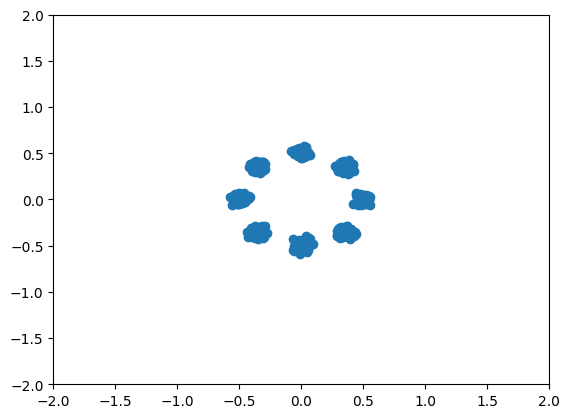

/tmp/ipykernel_1365333/4110379981.py:60: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/4110379981.py:61: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():


portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/4110379981.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


0 0.7164809 time: 2.6064655780792236


/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


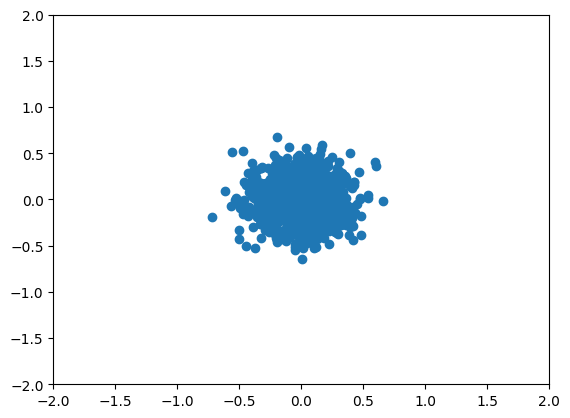

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -1001.08636


/tmp/ipykernel_1365333/4110379981.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.24155934 time: 0.0008466243743896484
200 0.2002932 time: 0.0008540153503417969
300 0.21466358 time: 0.0008475780487060547
400 0.22560804 time: 0.0008368492126464844
500 0.22061406 time: 0.0008382797241210938
600 0.20689332 time: 0.0008361339569091797
700 0.18961632 time: 0.0008609294891357422
800 0.21265228 time: 0.0009024143218994141
900 0.20849064 time: 0.0010144710540771484
1000 0.19972315 time: 0.0008521080017089844


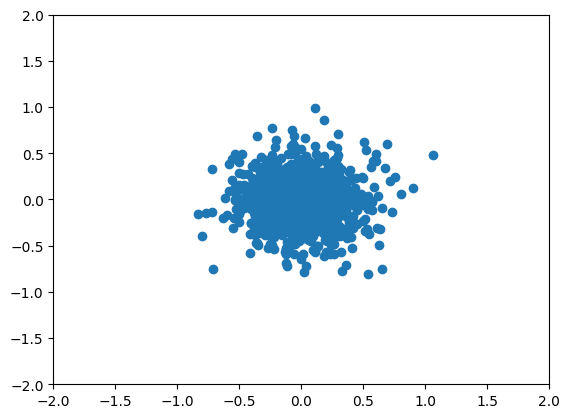

TEST 1000 logpx -131.68297
1100 0.22075579 time: 0.0008351802825927734
1200 0.21103828 time: 0.0008440017700195312
1300 0.17772971 time: 0.0008523464202880859
1400 0.21504897 time: 0.0008404254913330078
1500 0.21131404 time: 0.0009396076202392578
1600 0.20710452 time: 0.0008668899536132812
1700 0.22239731 time: 0.0008423328399658203
1800 0.19134751 time: 0.0008342266082763672
1900 0.21535967 time: 0.0008349418640136719
2000 0.20030835 time: 0.0008635520935058594


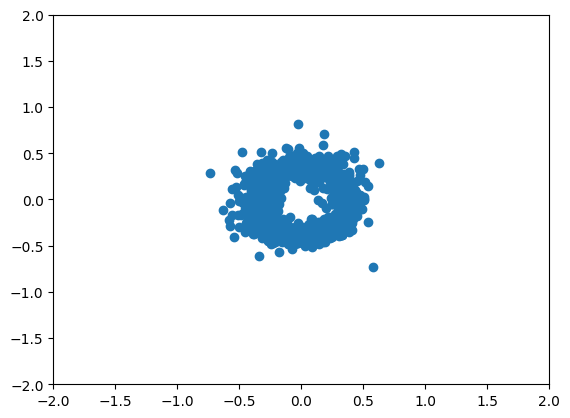

TEST 2000 logpx -22.626434
2100 0.20406367 time: 0.0008606910705566406
2200 0.19347294 time: 0.0008578300476074219
2300 0.20611712 time: 0.0008404254913330078
2400 0.19162852 time: 0.0008409023284912109
2500 0.19747335 time: 0.0008533000946044922
2600 0.2025887 time: 0.0008409023284912109
2700 0.20762683 time: 0.000885009765625
2800 0.22381943 time: 0.0008349418640136719
2900 0.21090397 time: 0.0008382797241210938
3000 0.19429182 time: 0.0008475780487060547


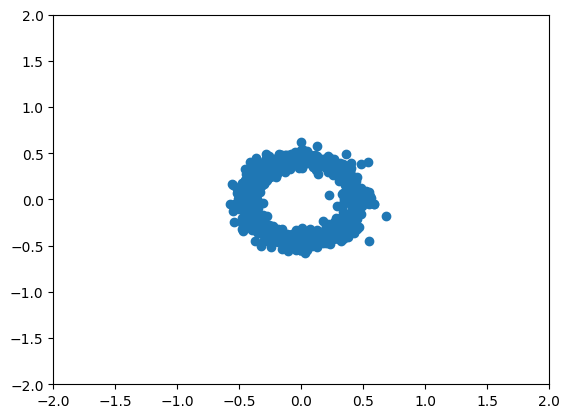

TEST 3000 logpx -3.4885569
3100 0.19803962 time: 0.0008852481842041016
3200 0.20841596 time: 0.0008337497711181641
3300 0.18924809 time: 0.0008444786071777344
3400 0.17929651 time: 0.0008389949798583984
3500 0.18226326 time: 0.0008437633514404297
3600 0.17926086 time: 0.0008394718170166016
3700 0.23537485 time: 0.0008523464202880859
3800 0.19244738 time: 0.0008592605590820312
3900 0.21047588 time: 0.0008480548858642578
4000 0.19986495 time: 0.0008485317230224609


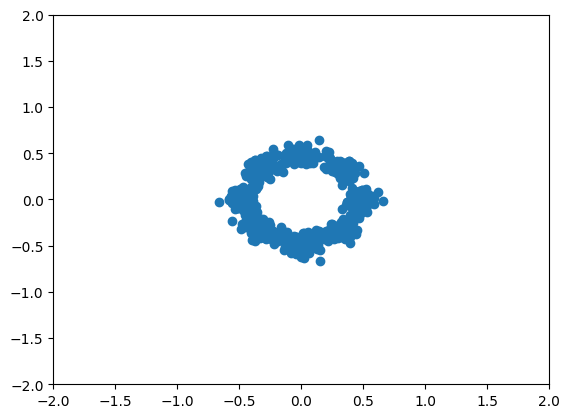

TEST 4000 logpx 0.29227844
4100 0.19157119 time: 0.0008542537689208984
4200 0.18359102 time: 0.0008568763732910156
4300 0.1805659 time: 0.0008409023284912109
4400 0.1801992 time: 0.0008475780487060547
4500 0.19489312 time: 0.0008409023284912109
4600 0.20220888 time: 0.0008397102355957031
4700 0.16791464 time: 0.0008544921875
4800 0.20387667 time: 0.0008351802825927734
4900 0.19328046 time: 0.0008373260498046875
5000 0.19706815 time: 0.0008461475372314453


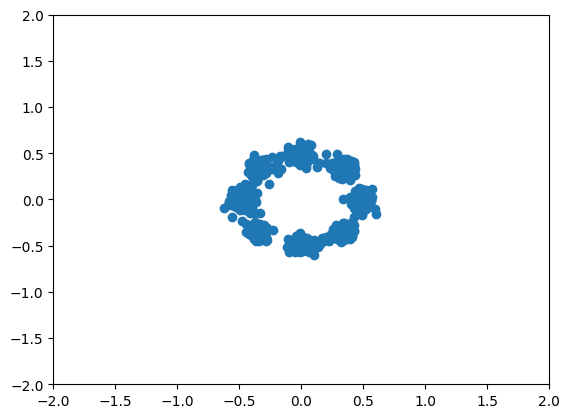

TEST 5000 logpx 0.89836484
5100 0.17483701 time: 0.0008423328399658203
5200 0.18751338 time: 0.0008485317230224609
5300 0.16439585 time: 0.0008287429809570312
5400 0.21010041 time: 0.0008449554443359375
5500 0.21059446 time: 0.0008270740509033203
5600 0.17813627 time: 0.0008511543273925781
5700 0.17150812 time: 0.0008413791656494141
5800 0.21516347 time: 0.0008423328399658203
5900 0.20223156 time: 0.0008406639099121094
6000 0.18333443 time: 0.0008451938629150391


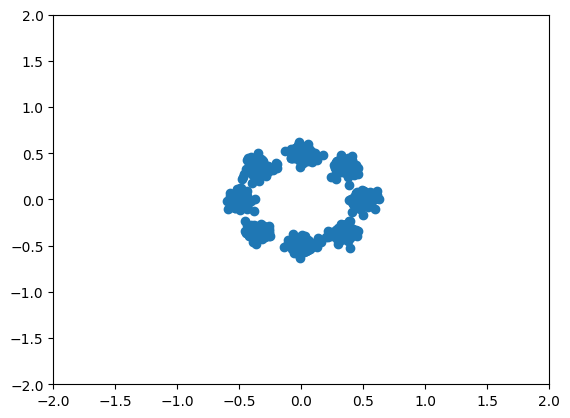

TEST 6000 logpx 1.2383876
6100 0.1558281 time: 0.000873565673828125
6200 0.16086039 time: 0.0008406639099121094
6300 0.1924539 time: 0.0008423328399658203
6400 0.18441553 time: 0.000835418701171875
6500 0.22155252 time: 0.0008494853973388672
6600 0.19083127 time: 0.0008339881896972656
6700 0.18205756 time: 0.0008399486541748047
6800 0.1696651 time: 0.0008332729339599609
6900 0.19004042 time: 0.0008361339569091797
7000 0.18828955 time: 0.0008642673492431641


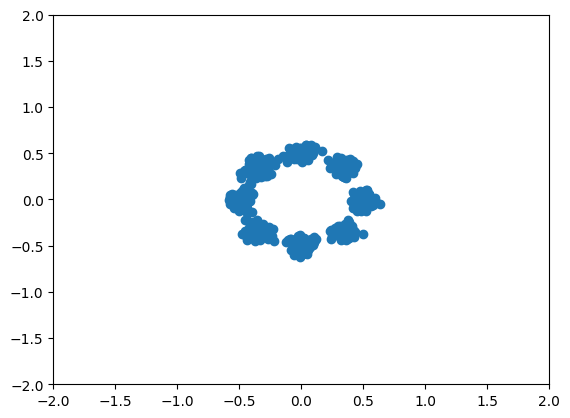

TEST 7000 logpx 1.417569
7100 0.2053866 time: 0.0008540153503417969
7200 0.19162515 time: 0.0008409023284912109
7300 0.20834672 time: 0.0008342266082763672
7400 0.17553365 time: 0.0008382797241210938
7500 0.19946708 time: 0.0008335113525390625
7600 0.18468744 time: 0.0008471012115478516
7700 0.17529276 time: 0.0008406639099121094
7800 0.19709128 time: 0.0008375644683837891
7900 0.21062732 time: 0.0008413791656494141
8000 0.16082951 time: 0.0008366107940673828


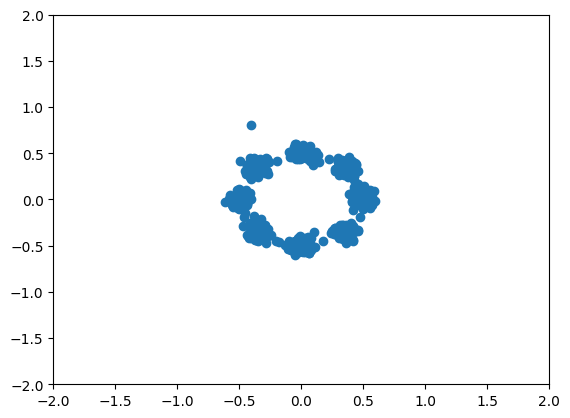

TEST 8000 logpx 1.5457345
8100 0.1980372 time: 0.0008404254913330078
8200 0.16351342 time: 0.0008404254913330078
8300 0.20280626 time: 0.0008296966552734375
8400 0.19665296 time: 0.0008442401885986328
8500 0.2023281 time: 0.0008356571197509766
8600 0.19741166 time: 0.0008528232574462891
8700 0.1917473 time: 0.0008344650268554688
8800 0.1638733 time: 0.0008459091186523438
8900 0.19047253 time: 0.0008363723754882812
9000 0.19049424 time: 0.0008447170257568359


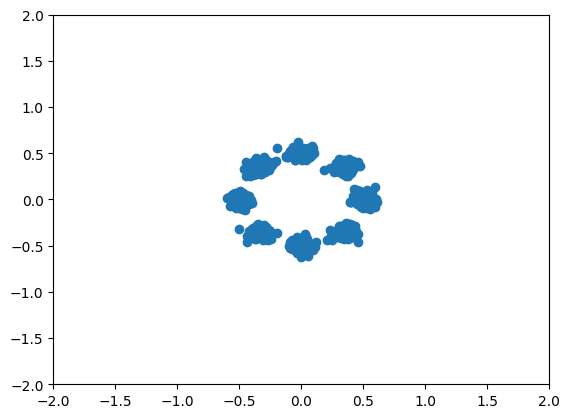

TEST 9000 logpx 1.5786296
9100 0.19082019 time: 0.0008444786071777344
9200 0.22004323 time: 0.0008451938629150391
9300 0.17198005 time: 0.0008370876312255859
9400 0.19371518 time: 0.0008232593536376953
9500 0.17773774 time: 0.0008225440979003906
9600 0.18678445 time: 0.0008287429809570312
9700 0.21659394 time: 0.0008423328399658203
9800 0.19844404 time: 0.0008325576782226562
9900 0.19057167 time: 0.000850677490234375
10000 0.1942765 time: 0.0008411407470703125


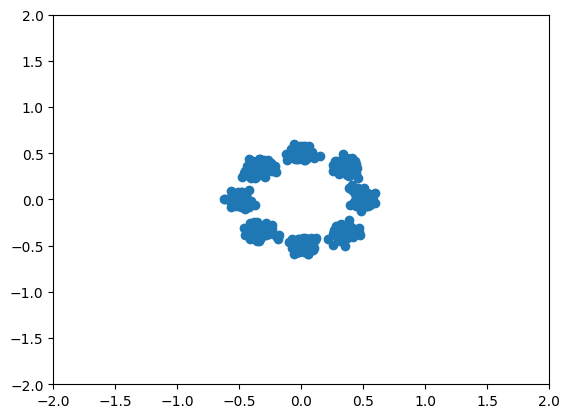

TEST 10000 logpx 1.6101254
10100 0.18519285 time: 0.0008461475372314453
10200 0.19206947 time: 0.0008552074432373047
10300 0.18428034 time: 0.0008292198181152344
10400 0.21454501 time: 0.0008528232574462891
10500 0.20719981 time: 0.0008511543273925781
10600 0.18888208 time: 0.0008509159088134766
10700 0.19482829 time: 0.0008435249328613281
10800 0.2008259 time: 0.0008373260498046875
10900 0.16395375 time: 0.0008323192596435547
11000 0.20540714 time: 0.0008311271667480469


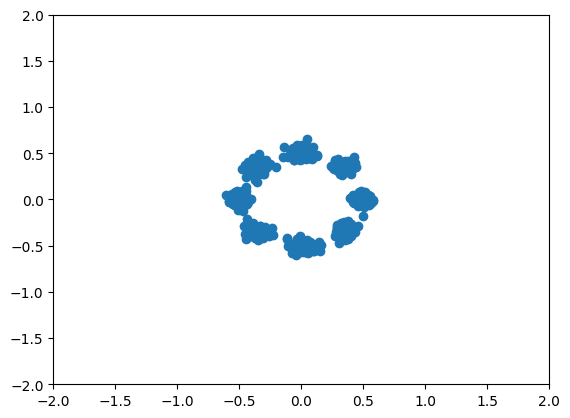

TEST 11000 logpx 1.6433336
11100 0.17328404 time: 0.0008456707000732422
11200 0.17706245 time: 0.00084686279296875
11300 0.20601912 time: 0.0008347034454345703
11400 0.17383458 time: 0.0008296966552734375
11500 0.18310283 time: 0.0008387565612792969
11600 0.19347686 time: 0.0008263587951660156
11700 0.18780036 time: 0.0008394718170166016
11800 0.17316014 time: 0.0008368492126464844
11900 0.1994841 time: 0.0008378028869628906
12000 0.21437751 time: 0.0008385181427001953


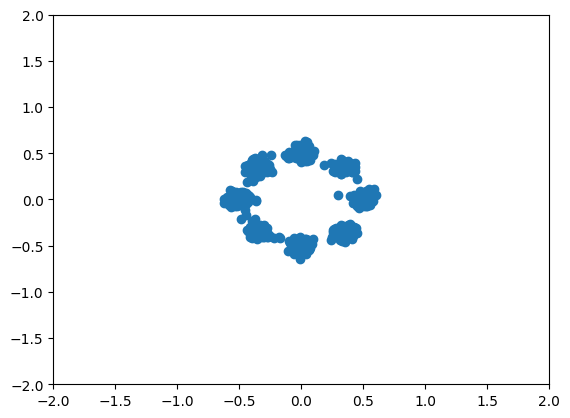

TEST 12000 logpx 1.609111
12100 0.17271909 time: 0.0008556842803955078
12200 0.1804265 time: 0.0008358955383300781
12300 0.2112378 time: 0.0008449554443359375
12400 0.19504425 time: 0.0008525848388671875
12500 0.18829376 time: 0.0008463859558105469
12600 0.20322277 time: 0.0008552074432373047
12700 0.19429283 time: 0.000827789306640625
12800 0.20241834 time: 0.0008437633514404297
12900 0.18131864 time: 0.0008542537689208984
13000 0.19249292 time: 0.0008480548858642578


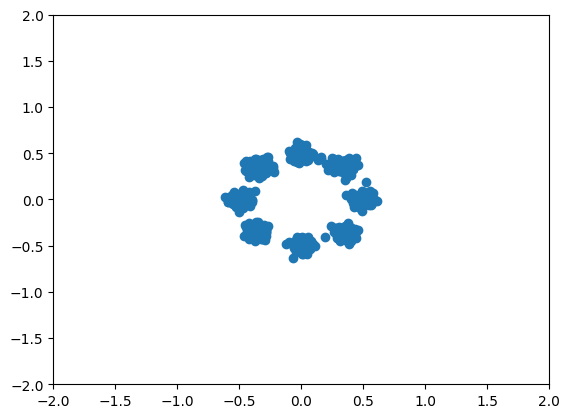

TEST 13000 logpx 1.6443301
13100 0.19175428 time: 0.0008769035339355469
13200 0.20491804 time: 0.0008578300476074219
13300 0.17667295 time: 0.0008347034454345703
13400 0.21911067 time: 0.0008554458618164062
13500 0.19389994 time: 0.0008473396301269531
13600 0.19516419 time: 0.0008478164672851562
13700 0.20689653 time: 0.00086212158203125
13800 0.17913067 time: 0.0008435249328613281
13900 0.19300349 time: 0.0008447170257568359
14000 0.21702507 time: 0.0008294582366943359


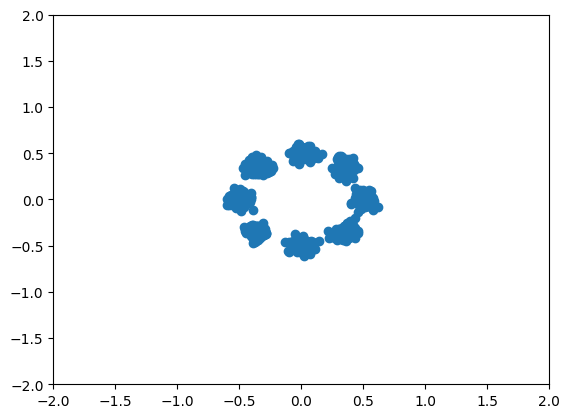

TEST 14000 logpx 1.7011901
14100 0.16903545 time: 0.0008444786071777344
14200 0.18016267 time: 0.0009038448333740234
14300 0.18666817 time: 0.0008363723754882812
14400 0.19457561 time: 0.0008378028869628906
14500 0.18674143 time: 0.00084686279296875
14600 0.19544962 time: 0.0008709430694580078
14700 0.17550059 time: 0.0008265972137451172
14800 0.18295683 time: 0.0009124279022216797
14900 0.20399812 time: 0.0008356571197509766
15000 0.21419893 time: 0.0008280277252197266


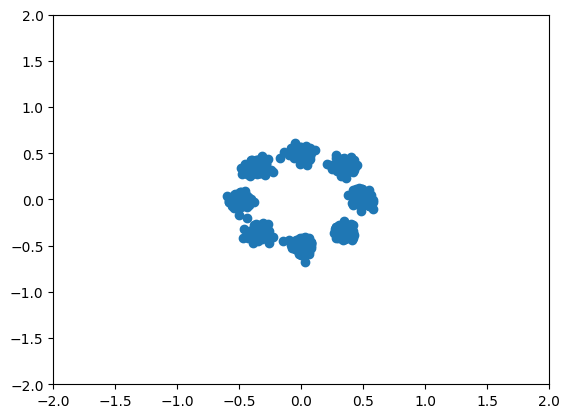

TEST 15000 logpx 1.6335614


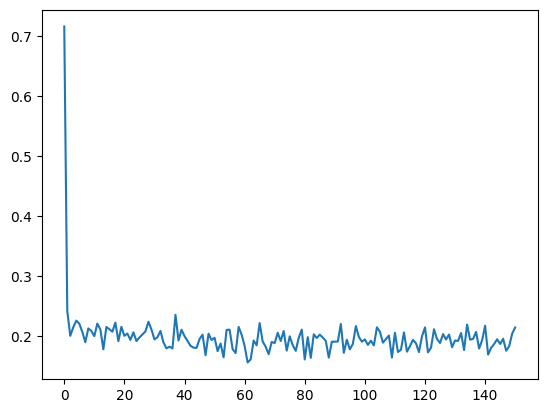

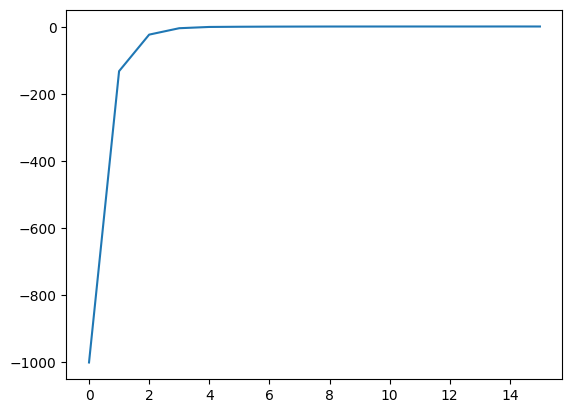

In [28]:
# Train Spiral EBM Model
batch_size = 1000
data_dim = 2
num_steps = 15001

EMA = .999

n_steps = 100
net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = toy_gmm(std=.03)
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    # if ebm:
    #   for t in range(10):
    #     dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
    #     plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

flow_params = params
flow_rng = next(rng_seq)

spiral_params = ema_params

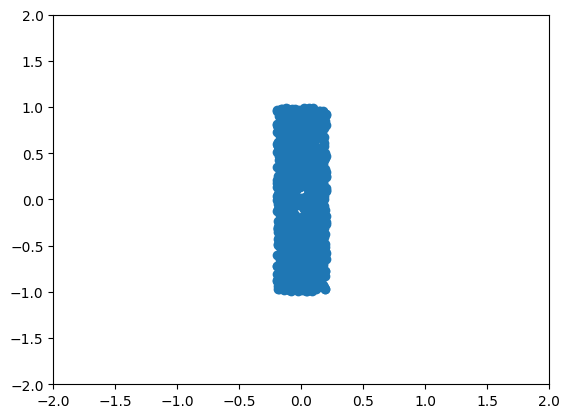

portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/173696313.py:58: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/173696313.py:59: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():
/tmp/ipykernel_1365333/173696313.py:97: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)
/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_EN

0 0.7967299 time: 1.662858486175537


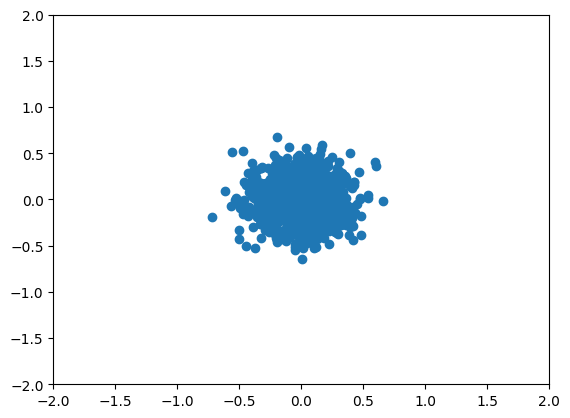

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -1002.56476


/tmp/ipykernel_1365333/173696313.py:97: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.2332377 time: 0.0008461475372314453
200 0.2012212 time: 0.0008704662322998047
300 0.21281615 time: 0.0008680820465087891
400 0.22050345 time: 0.0008764266967773438
500 0.22376652 time: 0.0008749961853027344
600 0.21223606 time: 0.0008399486541748047
700 0.21782768 time: 0.0008690357208251953
800 0.23749115 time: 0.0008776187896728516
900 0.20552287 time: 0.0008611679077148438
1000 0.20259333 time: 0.0008587837219238281


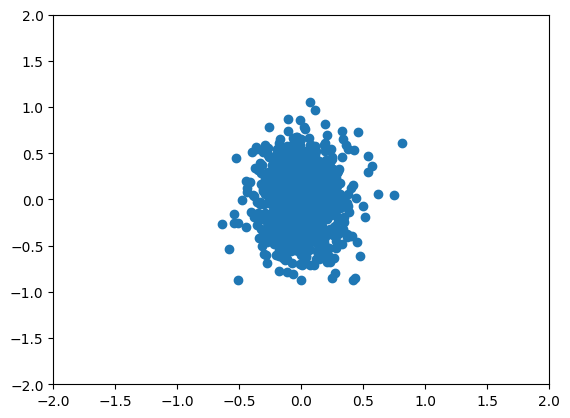

TEST 1000 logpx -143.2471
1100 0.20001061 time: 0.0008521080017089844
1200 0.20287946 time: 0.0008587837219238281
1300 0.18642054 time: 0.0008635520935058594
1400 0.21610829 time: 0.0008554458618164062
1500 0.21717231 time: 0.0008606910705566406
1600 0.21881905 time: 0.0008482933044433594
1700 0.20596604 time: 0.0008602142333984375
1800 0.2248921 time: 0.0008819103240966797
1900 0.24438539 time: 0.0008692741394042969
2000 0.21655841 time: 0.0008423328399658203


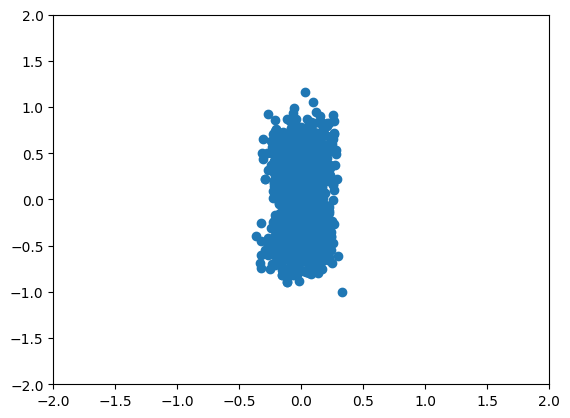

TEST 2000 logpx -20.878477
2100 0.24090397 time: 0.0008485317230224609
2200 0.20510368 time: 0.0008702278137207031
2300 0.2171959 time: 0.0008776187896728516
2400 0.20923215 time: 0.0008409023284912109
2500 0.21583827 time: 0.0008726119995117188
2600 0.20722875 time: 0.0008535385131835938
2700 0.22762783 time: 0.00087738037109375
2800 0.21865296 time: 0.0008690357208251953
2900 0.20371065 time: 0.0008704662322998047
3000 0.2249167 time: 0.0008647441864013672


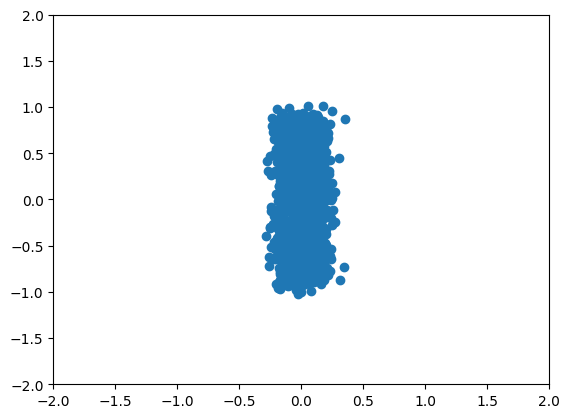

TEST 3000 logpx -3.0469005
3100 0.21714097 time: 0.0008726119995117188
3200 0.21802025 time: 0.0008525848388671875
3300 0.23090339 time: 0.0008790493011474609
3400 0.21262632 time: 0.0008549690246582031
3500 0.21223474 time: 0.0008807182312011719
3600 0.20084772 time: 0.0008339881896972656
3700 0.23623304 time: 0.0008692741394042969
3800 0.23116703 time: 0.0008561611175537109
3900 0.23992358 time: 0.0008668899536132812
4000 0.22130103 time: 0.0008513927459716797


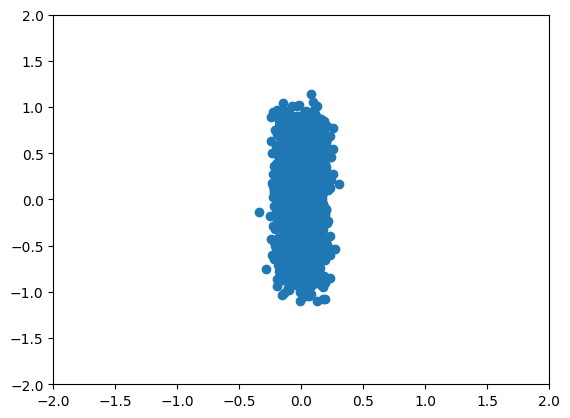

TEST 4000 logpx -0.4434288
4100 0.22745888 time: 0.0008671283721923828
4200 0.2121372 time: 0.0008676052093505859
4300 0.2069106 time: 0.0008480548858642578
4400 0.20256492 time: 0.0008566379547119141
4500 0.21967673 time: 0.0008745193481445312
4600 0.21061596 time: 0.0008535385131835938
4700 0.18839496 time: 0.0008630752563476562
4800 0.20826517 time: 0.0008790493011474609
4900 0.2223107 time: 0.0008411407470703125
5000 0.22031474 time: 0.0008673667907714844


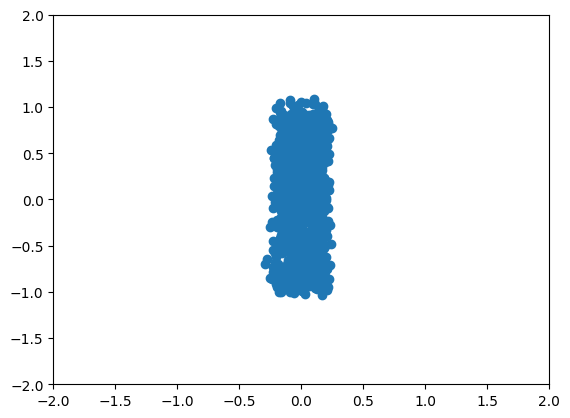

TEST 5000 logpx -0.15055738
5100 0.20257388 time: 0.0008749961853027344
5200 0.21950297 time: 0.0008552074432373047
5300 0.21186733 time: 0.0008754730224609375
5400 0.23133121 time: 0.0008404254913330078
5500 0.24244878 time: 0.0008647441864013672
5600 0.20161194 time: 0.0008769035339355469
5700 0.19362731 time: 0.0008561611175537109
5800 0.20973665 time: 0.0008409023284912109
5900 0.210621 time: 0.0008695125579833984
6000 0.23527306 time: 0.0008757114410400391


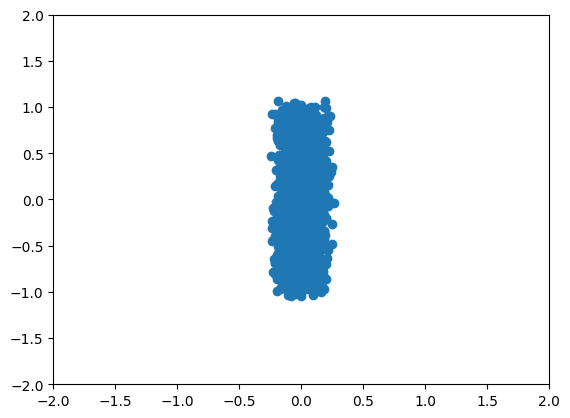

TEST 6000 logpx -0.30929726
6100 0.20120642 time: 0.0008623600006103516
6200 0.20447676 time: 0.0008602142333984375
6300 0.2102495 time: 0.0008547306060791016
6400 0.22024502 time: 0.0008614063262939453
6500 0.2132241 time: 0.0008502006530761719
6600 0.23011304 time: 0.0008432865142822266
6700 0.19948146 time: 0.0008709430694580078
6800 0.1930223 time: 0.0008680820465087891
6900 0.20128444 time: 0.0008645057678222656
7000 0.22702415 time: 0.0008478164672851562


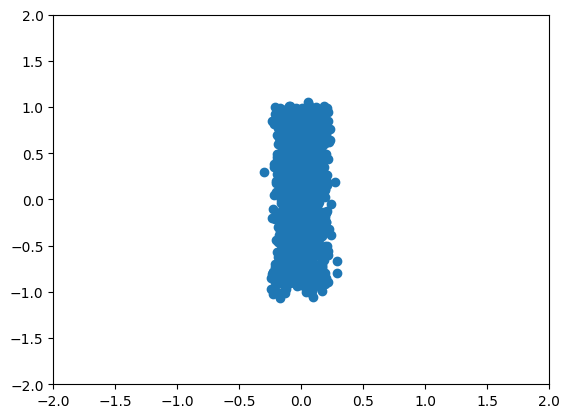

TEST 7000 logpx -0.08394683
7100 0.22004955 time: 0.0008723735809326172
7200 0.22232133 time: 0.0008523464202880859
7300 0.23621932 time: 0.0008769035339355469
7400 0.21458006 time: 0.0008614063262939453
7500 0.21296026 time: 0.0008635520935058594
7600 0.2158992 time: 0.0008785724639892578
7700 0.20241885 time: 0.0008478164672851562
7800 0.215541 time: 0.0008740425109863281
7900 0.21539009 time: 0.0008776187896728516
8000 0.19513556 time: 0.0008976459503173828


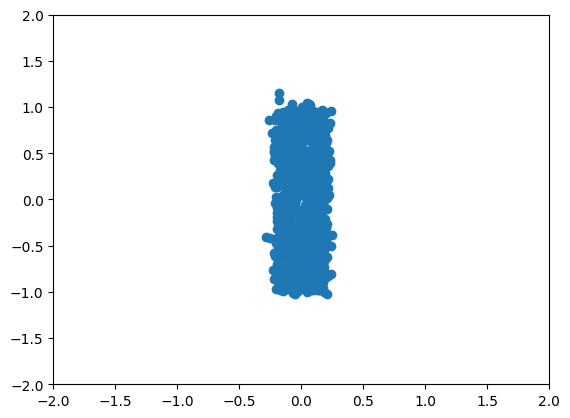

TEST 8000 logpx -0.015087016
8100 0.22113395 time: 0.0008635520935058594
8200 0.19216397 time: 0.0008625984191894531
8300 0.19848801 time: 0.0008578300476074219
8400 0.2266923 time: 0.0008440017700195312
8500 0.21443427 time: 0.0008459091186523438
8600 0.21644668 time: 0.0008769035339355469
8700 0.21289854 time: 0.0008754730224609375
8800 0.22008903 time: 0.0008540153503417969
8900 0.217105 time: 0.0008535385131835938
9000 0.2213084 time: 0.0008435249328613281


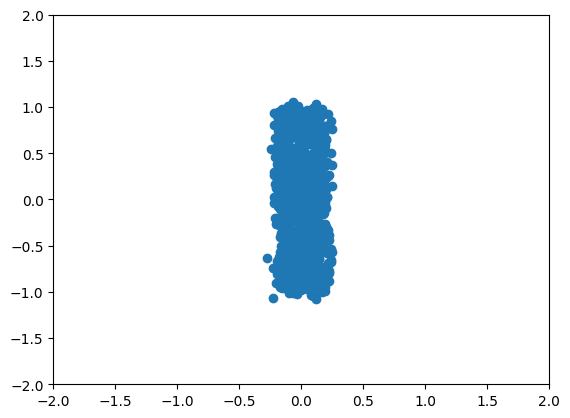

TEST 9000 logpx 0.03271279
9100 0.21302257 time: 0.0008733272552490234
9200 0.2164693 time: 0.0008723735809326172
9300 0.18663932 time: 0.0008511543273925781
9400 0.20572114 time: 0.0008563995361328125
9500 0.19851294 time: 0.000865936279296875
9600 0.23232934 time: 0.0008432865142822266
9700 0.22047336 time: 0.0008623600006103516
9800 0.22090235 time: 0.0008664131164550781
9900 0.2246277 time: 0.0008709430694580078
10000 0.21837266 time: 0.0008609294891357422


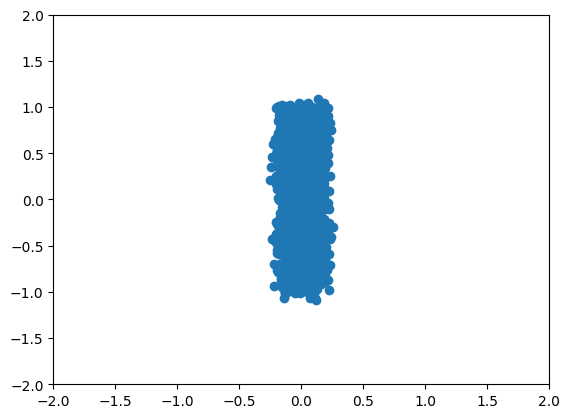

TEST 10000 logpx 0.19087756
10100 0.21336931 time: 0.0008733272552490234
10200 0.21827292 time: 0.0008647441864013672
10300 0.20744355 time: 0.0008366107940673828
10400 0.24473062 time: 0.0008597373962402344
10500 0.21627857 time: 0.0008828639984130859
10600 0.22389649 time: 0.0008649826049804688
10700 0.22444187 time: 0.0008683204650878906
10800 0.23072325 time: 0.000865936279296875
10900 0.2047884 time: 0.0008594989776611328
11000 0.24872361 time: 0.0008795261383056641


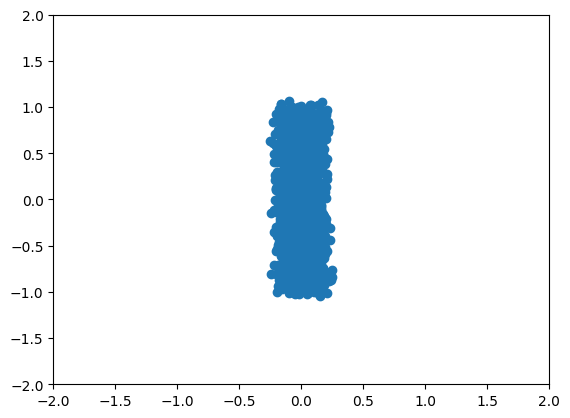

TEST 11000 logpx 0.149294
11100 0.20150124 time: 0.0008788108825683594
11200 0.22811984 time: 0.0008728504180908203
11300 0.23438212 time: 0.0008463859558105469
11400 0.22056971 time: 0.0008435249328613281
11500 0.21392012 time: 0.0008454322814941406
11600 0.19248846 time: 0.0008351802825927734
11700 0.24523436 time: 0.0008473396301269531
11800 0.20497598 time: 0.0008683204650878906
11900 0.22261442 time: 0.0008718967437744141
12000 0.21088047 time: 0.0008556842803955078


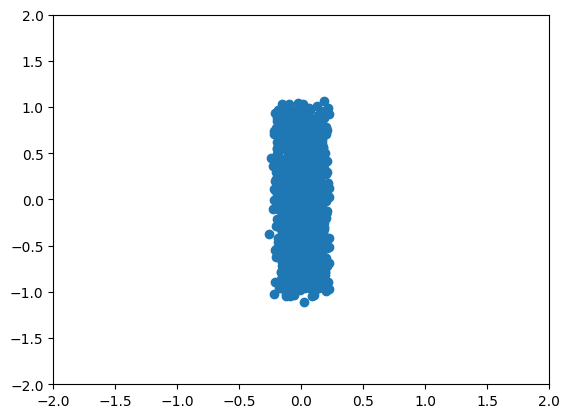

TEST 12000 logpx 0.26683637
12100 0.18120286 time: 0.0008676052093505859
12200 0.23841074 time: 0.0008416175842285156
12300 0.23855281 time: 0.0008974075317382812
12400 0.19559929 time: 0.0008749961853027344
12500 0.22329542 time: 0.0008642673492431641
12600 0.21914811 time: 0.0008714199066162109
12700 0.21575342 time: 0.0008819103240966797
12800 0.2071756 time: 0.0008451938629150391
12900 0.2281833 time: 0.0008528232574462891
13000 0.2101024 time: 0.0008661746978759766


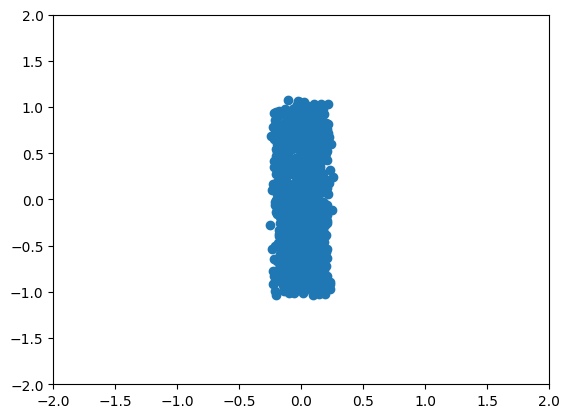

TEST 13000 logpx 0.19739184
13100 0.20713481 time: 0.0008835792541503906
13200 0.21552292 time: 0.0008611679077148438
13300 0.22523025 time: 0.0008571147918701172
13400 0.21684398 time: 0.0008785724639892578
13500 0.22362235 time: 0.0008409023284912109
13600 0.21241444 time: 0.0008738040924072266
13700 0.22151814 time: 0.0008652210235595703
13800 0.22484091 time: 0.00087738037109375
13900 0.21268722 time: 0.0008721351623535156
14000 0.20790812 time: 0.0008687973022460938


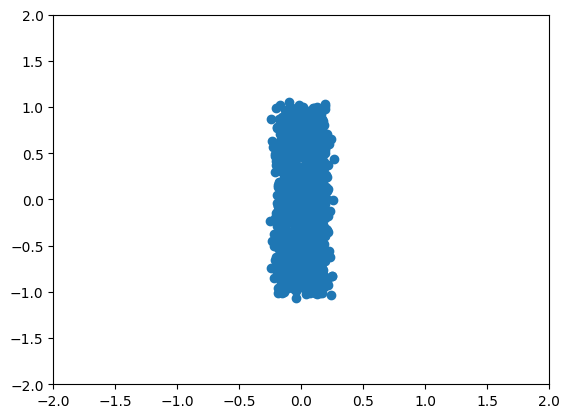

TEST 14000 logpx 0.24266519
14100 0.20244294 time: 0.0008797645568847656
14200 0.20691216 time: 0.0008790493011474609
14300 0.21161269 time: 0.0008914470672607422
14400 0.22427136 time: 0.0008525848388671875
14500 0.20358755 time: 0.0008594989776611328
14600 0.2451514 time: 0.0008797645568847656
14700 0.22395164 time: 0.0008687973022460938
14800 0.19984569 time: 0.0008342266082763672
14900 0.21781996 time: 0.0008573532104492188
15000 0.21586806 time: 0.0008776187896728516


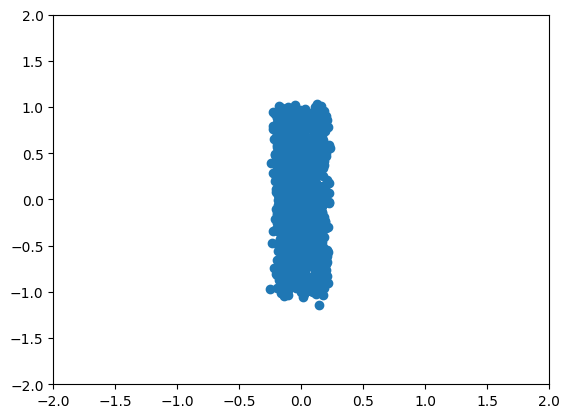

TEST 15000 logpx 0.18465495


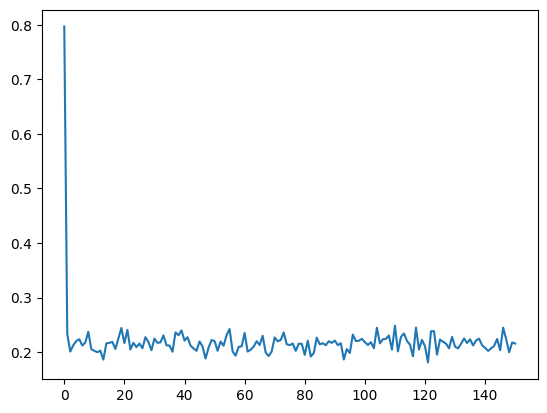

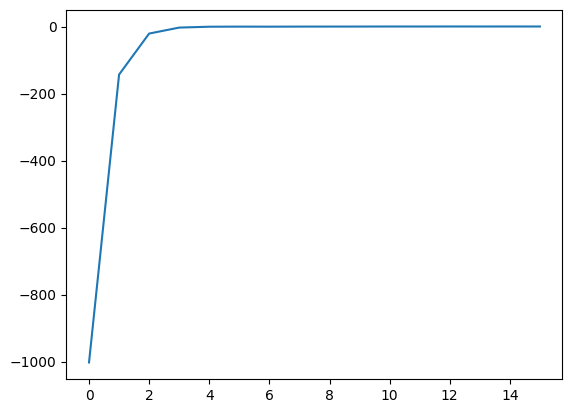

In [29]:
batch_size = 1000
num_steps = 15001

EMA = .999


net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = bar(scale=0.2)
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    # if ebm:
    #   for t in range(10):
    #     dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
    #     plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

bar_params = ema_params

In [30]:
params = {}

for k, v in spiral_params.items():
  params[k] = v

for k, v in bar_params.items():
  k = k.replace('resnet_diffusion_model/', 'resnet_diffusion_model_1/')
  params[k] = v

/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


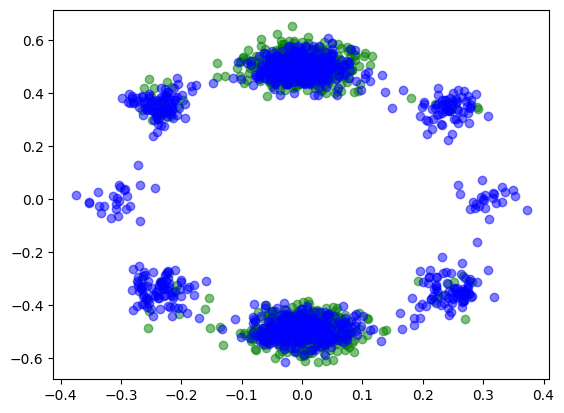

In [31]:
# Sampling from product of distributions
import matplotlib.pyplot as plt

dim = 2
n_mode = 4
std = .05
init_std = 1.
init_mu = 0.
n_steps = 10
damping = .5
mass_diag_sqrt = 1.
num_leapfrog = 3
samples_per_step = 10
uha_step_size = .03
ula_step_size = .001

batch_size = 1000

rng_seq = hk.PRNGSequence(0)

means = jax.random.normal(next(rng_seq), (n_mode, dim))
comp_dists = distrax.MultivariateNormalDiag(means, jnp.ones_like(means) * std)
pi = distrax.Categorical(logits=jnp.zeros((n_mode,)))
target_dist = distrax.MixtureSameFamily(pi, comp_dists)
initial_dist = distrax.MultivariateNormalDiag(means[0] * 0 + init_mu, init_std * jnp.ones_like(means[0]))


x_init = initial_dist.sample(seed=next(rng_seq), sample_shape=(batch_size,))
logZs = []
n_stepss = [100]

def gradient_function(x, t):
  t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
  return -1 *dual_product_gradient_fn(params, next(rng_seq), x, t)

if ebm:
  def energy_function(x, t):
    t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
    return -1 *dual_product_energy_fn(params, next(rng_seq), x, t)

for n_steps in n_stepss:
  ula_step_sizes = jnp.ones((n_steps,)) * ula_step_size
  uha_step_sizes = jnp.ones((n_steps,)) * uha_step_size

  betas = jnp.linspace(0., 1., n_steps)

  def target_function(x, i):
    beta = betas[i]
    init_lp = initial_dist.log_prob(x)
    targ_lp = target_dist.log_prob(x)
    return beta * targ_lp + (1 - beta) * init_lp

  # Choose MCMC Sampler to use
  # sampler = AnnealedULASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function)
  # sampler = AnnealedMALASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)
  # sampler = AnnealedUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function)
  sampler = AnnealedMUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)

  x_samp, logw, accept = sampler.sample(next(rng_seq), batch_size)
  rng_seq = hk.PRNGSequence(1)
  grad_sample = dual_product_sample_fn(params, next(rng_seq), batch_size, jnp.inf)

  # Samples from MCMC
  plt.scatter(x_samp[:, 0], x_samp[:, 1], color='green', alpha=.5)

  # Samples from adding score functions
  plt.scatter(grad_sample[:, 0], grad_sample[:, 1], color='blue', alpha=.5)

  plt.show()

Excute Disjunction Composition

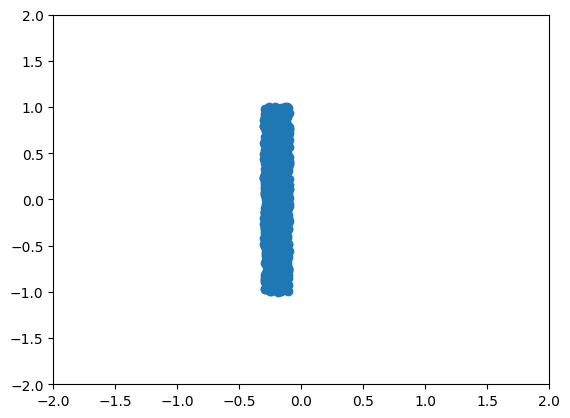

/tmp/ipykernel_1365333/4111905127.py:60: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/4111905127.py:61: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():


portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/4111905127.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)
/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


0 0.8722421 time: 1.630957841873169


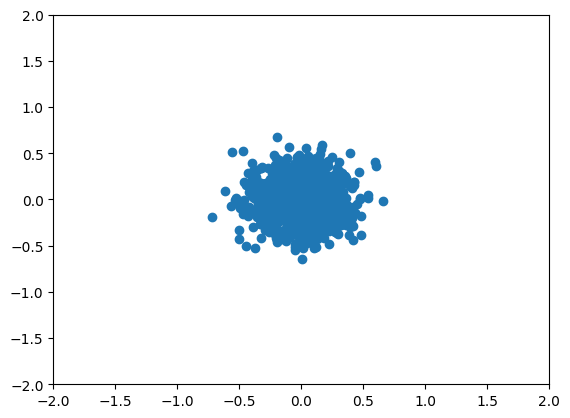

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -1002.84106


/tmp/ipykernel_1365333/4111905127.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.2169205 time: 0.0008783340454101562
200 0.1787662 time: 0.000885009765625
300 0.18908815 time: 0.0008881092071533203
400 0.19347025 time: 0.0008883476257324219
500 0.1848328 time: 0.0008885860443115234
600 0.19287024 time: 0.0008673667907714844
700 0.19638315 time: 0.00086212158203125
800 0.21288145 time: 0.0008647441864013672
900 0.18680583 time: 0.0008943080902099609
1000 0.19009174 time: 0.0008742809295654297


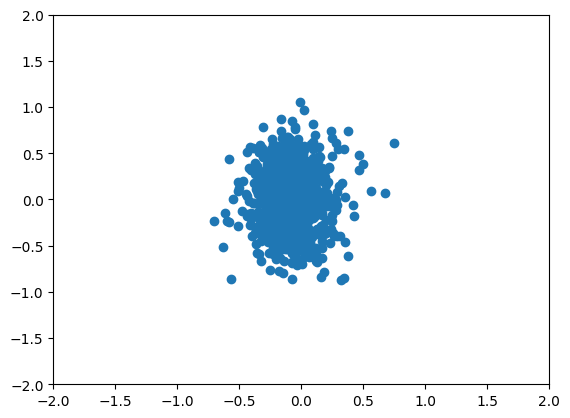

TEST 1000 logpx -159.30484
1100 0.18694331 time: 0.0008845329284667969
1200 0.19601436 time: 0.0008616447448730469
1300 0.18426609 time: 0.0008623600006103516
1400 0.18850356 time: 0.0008721351623535156
1500 0.20131205 time: 0.0008797645568847656
1600 0.19199958 time: 0.0008730888366699219
1700 0.18280591 time: 0.0008914470672607422
1800 0.20631291 time: 0.0008647441864013672
1900 0.20912012 time: 0.000873565673828125
2000 0.20598674 time: 0.0008745193481445312


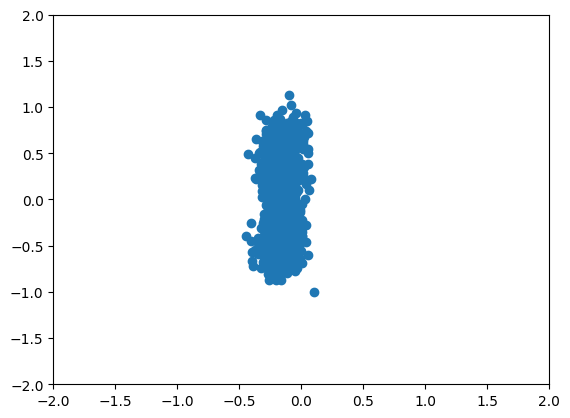

TEST 2000 logpx -25.677485
2100 0.20037758 time: 0.0008587837219238281
2200 0.1877346 time: 0.0008807182312011719
2300 0.18970221 time: 0.0008656978607177734
2400 0.19032373 time: 0.0008807182312011719
2500 0.19057678 time: 0.0008728504180908203
2600 0.1841941 time: 0.0008916854858398438
2700 0.18682823 time: 0.0008795261383056641
2800 0.1903428 time: 0.0008935928344726562
2900 0.2014098 time: 0.0008912086486816406
3000 0.18733948 time: 0.0008895397186279297


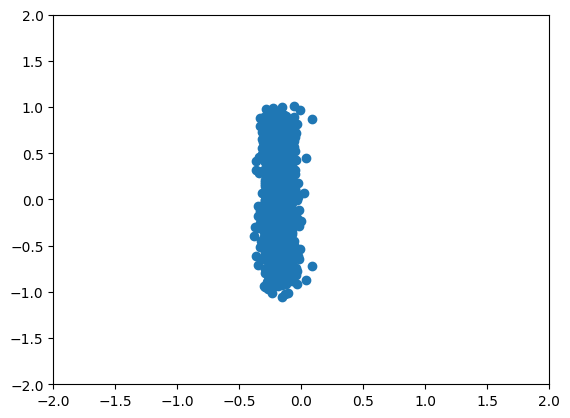

TEST 3000 logpx -3.4318721
3100 0.19270523 time: 0.0008900165557861328
3200 0.18933493 time: 0.0008809566497802734
3300 0.20283696 time: 0.0008666515350341797
3400 0.19636495 time: 0.0008580684661865234
3500 0.17022748 time: 0.0008714199066162109
3600 0.19135444 time: 0.0008900165557861328
3700 0.22008474 time: 0.0008461475372314453
3800 0.20472857 time: 0.0008823871612548828
3900 0.19653185 time: 0.0008630752563476562
4000 0.199076 time: 0.0008800029754638672


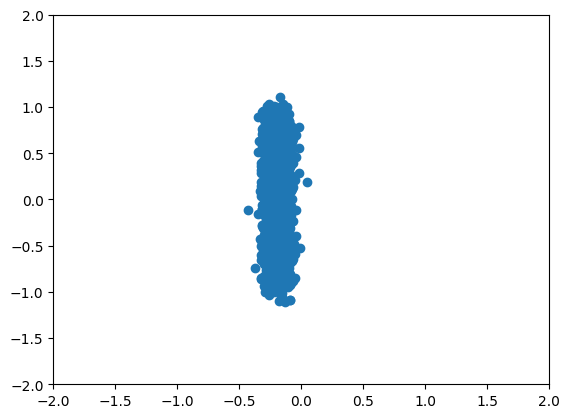

TEST 4000 logpx -0.20985153
4100 0.220336 time: 0.0008950233459472656
4200 0.18789098 time: 0.0008852481842041016
4300 0.1817255 time: 0.0008804798126220703
4400 0.1842307 time: 0.0011916160583496094
4500 0.18002793 time: 0.0008866786956787109
4600 0.18558122 time: 0.0008645057678222656
4700 0.17787874 time: 0.0008687973022460938
4800 0.18847387 time: 0.0008513927459716797
4900 0.19289921 time: 0.0008785724639892578
5000 0.21088324 time: 0.0008716583251953125


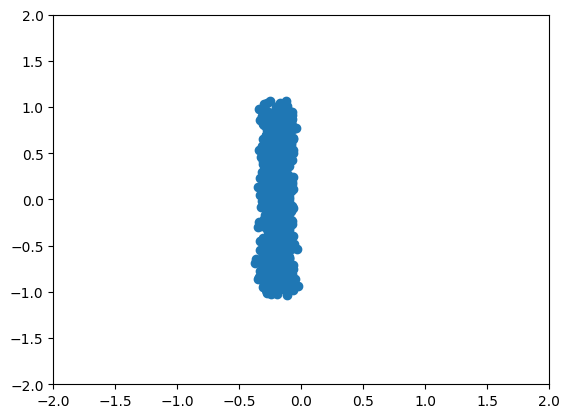

TEST 5000 logpx 0.26542956
5100 0.188937 time: 0.0008761882781982422
5200 0.21020286 time: 0.0008769035339355469
5300 0.18756905 time: 0.0008831024169921875
5400 0.19968991 time: 0.0008623600006103516
5500 0.20477329 time: 0.00084686279296875
5600 0.1828935 time: 0.0008997917175292969
5700 0.17393525 time: 0.0008838176727294922
5800 0.1912461 time: 0.0008754730224609375
5900 0.19538413 time: 0.0008685588836669922
6000 0.19861925 time: 0.0008726119995117188


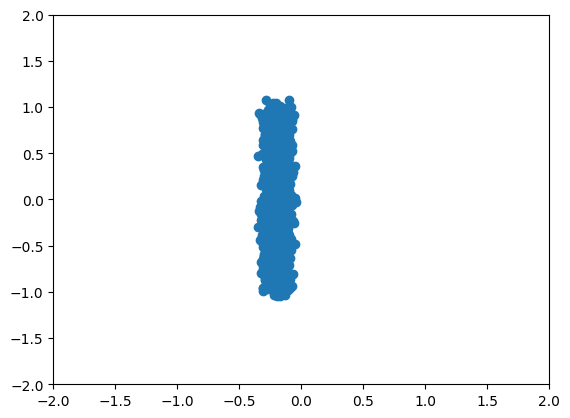

TEST 6000 logpx 0.3224074
6100 0.17160581 time: 0.0009076595306396484
6200 0.18555263 time: 0.0008289813995361328
6300 0.18382774 time: 0.0008635520935058594
6400 0.19872211 time: 0.000858306884765625
6500 0.19981459 time: 0.0008471012115478516
6600 0.19029273 time: 0.0008895397186279297
6700 0.18301453 time: 0.0008633136749267578
6800 0.17016292 time: 0.000881195068359375
6900 0.1826302 time: 0.0008444786071777344
7000 0.19337519 time: 0.0008740425109863281


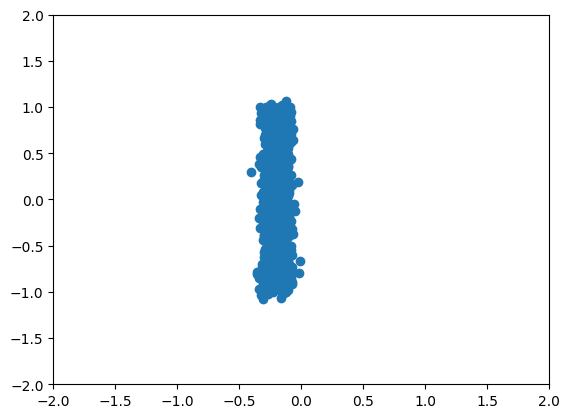

TEST 7000 logpx 0.58567363
7100 0.19609238 time: 0.0008795261383056641
7200 0.19590083 time: 0.0008726119995117188
7300 0.2094769 time: 0.0008845329284667969
7400 0.17882793 time: 0.0008437633514404297
7500 0.1813216 time: 0.0008313655853271484
7600 0.20188285 time: 0.0008664131164550781
7700 0.18195824 time: 0.0008707046508789062
7800 0.19519089 time: 0.0008449554443359375
7900 0.18816993 time: 0.00083160400390625
8000 0.18016605 time: 0.0008635520935058594


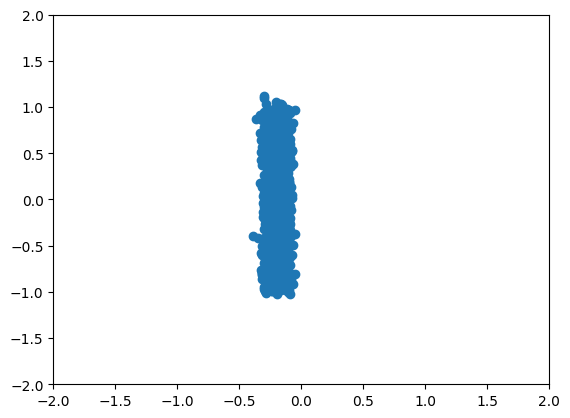

TEST 8000 logpx 0.65166116
8100 0.1984162 time: 0.0008835792541503906
8200 0.19032893 time: 0.0008807182312011719
8300 0.19342881 time: 0.0008356571197509766
8400 0.1946573 time: 0.0008752346038818359
8500 0.19203246 time: 0.0008599758148193359
8600 0.20059358 time: 0.0008461475372314453
8700 0.1856034 time: 0.0008637905120849609
8800 0.19759816 time: 0.0008757114410400391
8900 0.18135273 time: 0.0008668899536132812
9000 0.21932349 time: 0.0008704662322998047


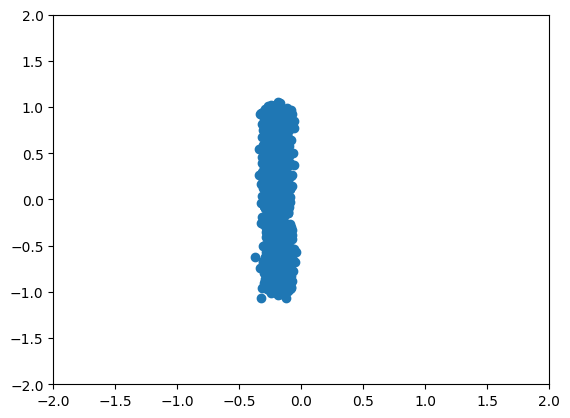

TEST 9000 logpx 0.6724237
9100 0.17283463 time: 0.0008828639984130859
9200 0.19659673 time: 0.0008919239044189453
9300 0.16707782 time: 0.0008823871612548828
9400 0.1829158 time: 0.0008602142333984375
9500 0.16876025 time: 0.0008723735809326172
9600 0.20784727 time: 0.0008785724639892578
9700 0.19506693 time: 0.0008726119995117188
9800 0.19275856 time: 0.0008616447448730469
9900 0.19927226 time: 0.0008313655853271484
10000 0.2030033 time: 0.0008287429809570312


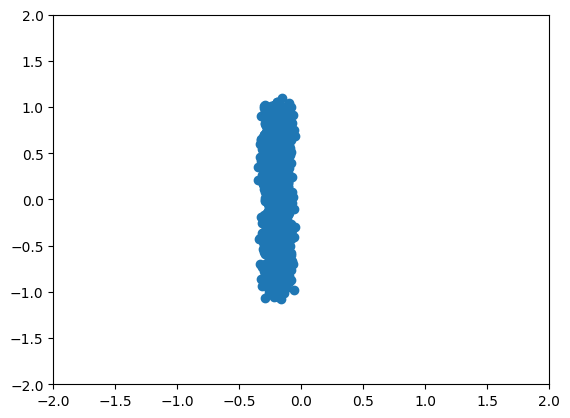

TEST 10000 logpx 0.7506731
10100 0.19592628 time: 0.0008609294891357422
10200 0.19325905 time: 0.0008683204650878906
10300 0.19315812 time: 0.0008568763732910156
10400 0.20229036 time: 0.0008649826049804688
10500 0.19244532 time: 0.00087738037109375
10600 0.197555 time: 0.000885009765625
10700 0.21389589 time: 0.0008771419525146484
10800 0.19297974 time: 0.0008792877197265625
10900 0.18942876 time: 0.0008642673492431641
11000 0.22376296 time: 0.0008647441864013672


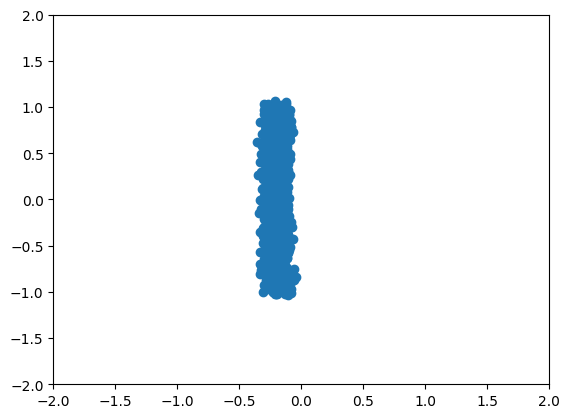

TEST 11000 logpx 0.73411375
11100 0.17927168 time: 0.0008523464202880859
11200 0.20070274 time: 0.0008587837219238281
11300 0.21292841 time: 0.0008792877197265625
11400 0.17471494 time: 0.0008480548858642578
11500 0.17904505 time: 0.0008723735809326172
11600 0.17131741 time: 0.0008645057678222656
11700 0.21673009 time: 0.0008661746978759766
11800 0.17837645 time: 0.0008804798126220703
11900 0.20428969 time: 0.0008742809295654297
12000 0.18867248 time: 0.0008711814880371094


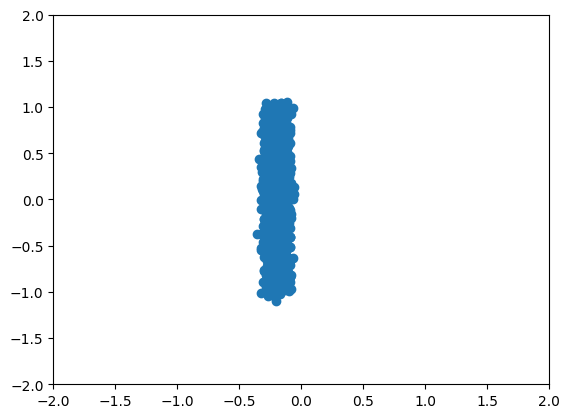

TEST 12000 logpx 0.7933283
12100 0.16119379 time: 0.00083160400390625
12200 0.21175028 time: 0.00087738037109375
12300 0.21975055 time: 0.0008745193481445312
12400 0.16723762 time: 0.0008974075317382812
12500 0.20202844 time: 0.0008378028869628906
12600 0.20158924 time: 0.0008306503295898438
12700 0.20090802 time: 0.0008709430694580078
12800 0.18077777 time: 0.0008671283721923828
12900 0.18687382 time: 0.000888824462890625
13000 0.17369421 time: 0.000881195068359375


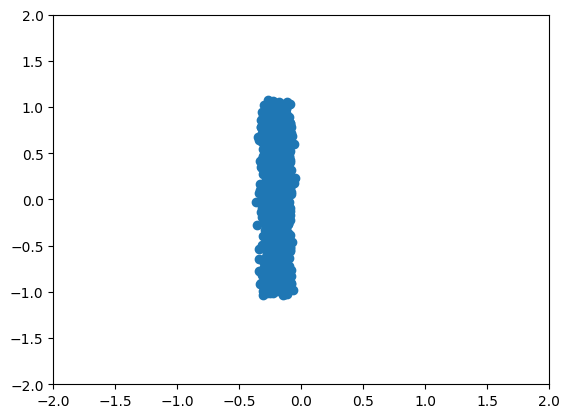

TEST 13000 logpx 0.8013302
13100 0.18576579 time: 0.0008716583251953125
13200 0.19248039 time: 0.0008425712585449219
13300 0.204585 time: 0.0008707046508789062
13400 0.19958009 time: 0.0008492469787597656
13500 0.19440356 time: 0.0008866786956787109
13600 0.2068824 time: 0.00087738037109375
13700 0.19137236 time: 0.0008666515350341797
13800 0.21775007 time: 0.0008833408355712891
13900 0.18611695 time: 0.0008702278137207031
14000 0.18142973 time: 0.0008504390716552734


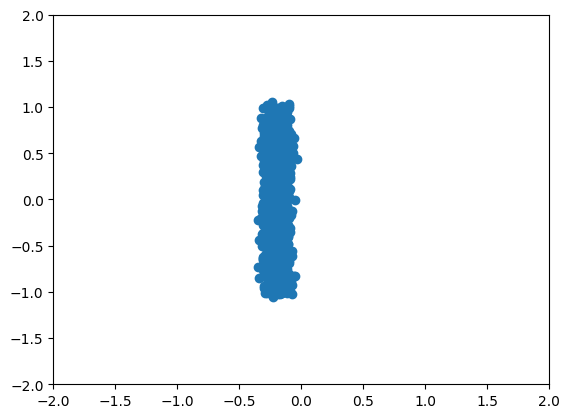

TEST 14000 logpx 0.80856097
14100 0.17918466 time: 0.0009024143218994141
14200 0.20228045 time: 0.0008776187896728516
14300 0.20066647 time: 0.0008878707885742188
14400 0.1958907 time: 0.00087738037109375
14500 0.19228601 time: 0.0008728504180908203
14600 0.1990712 time: 0.0008683204650878906
14700 0.19568717 time: 0.0008575916290283203
14800 0.17878547 time: 0.0008866786956787109
14900 0.17890584 time: 0.0008928775787353516
15000 0.19496413 time: 0.0008449554443359375


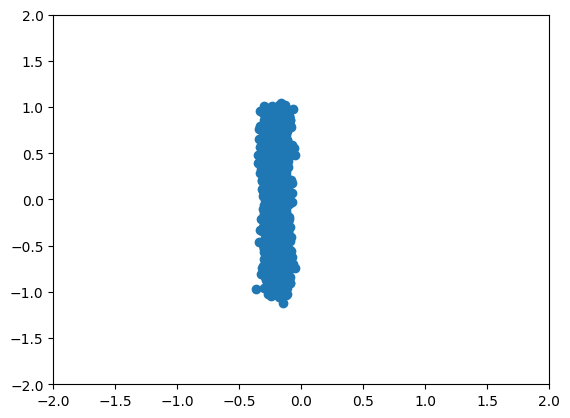

TEST 15000 logpx 0.7011802


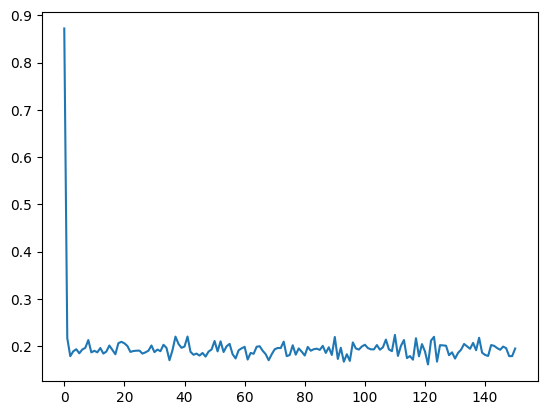

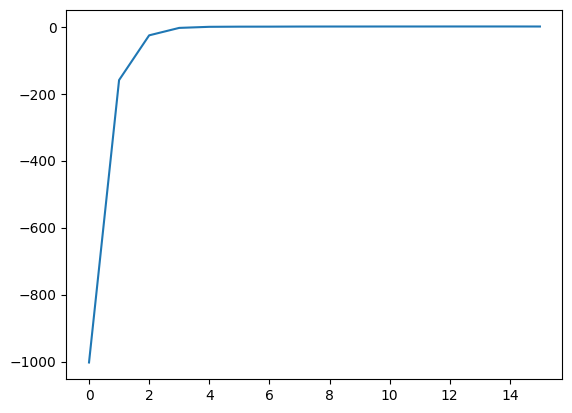

In [32]:
# Train Left Bar EBM Model
batch_size = 1000
data_dim = 2
num_steps = 15001

EMA = .999

n_steps = 100
net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = left_bar()
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    # if ebm:
    #   for t in range(10):
    #     dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
    #     plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

flow_params = params
flow_rng = next(rng_seq)

left_bar_params = ema_params

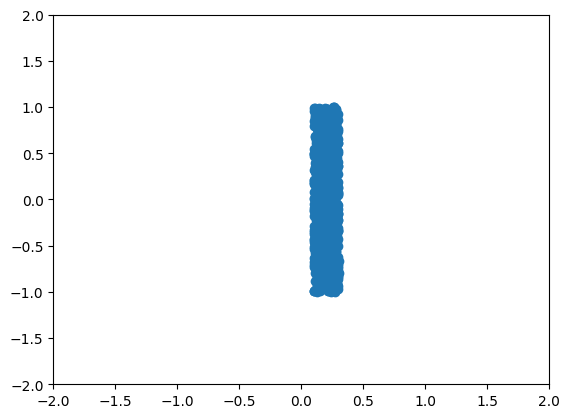

portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/3574952258.py:60: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/3574952258.py:61: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():


/tmp/ipykernel_1365333/3574952258.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)
/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


0 0.80636 time: 1.7754883766174316


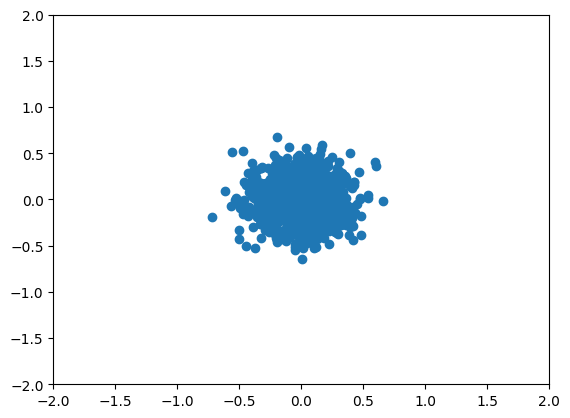

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -1002.74976


/tmp/ipykernel_1365333/3574952258.py:99: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.21878546 time: 0.0008804798126220703
200 0.18213469 time: 0.0008792877197265625
300 0.1831281 time: 0.0008587837219238281
400 0.18585783 time: 0.0008709430694580078
500 0.19321223 time: 0.0008828639984130859
600 0.1889086 time: 0.0008797645568847656
700 0.18981242 time: 0.0008502006530761719
800 0.21353684 time: 0.0008955001831054688
900 0.1801581 time: 0.0008933544158935547
1000 0.18460703 time: 0.0008616447448730469


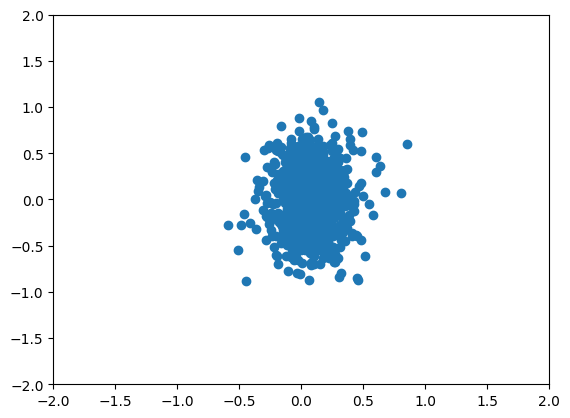

TEST 1000 logpx -157.09291
1100 0.19864365 time: 0.0008778572082519531
1200 0.20447071 time: 0.0008504390716552734
1300 0.18240458 time: 0.0008740425109863281
1400 0.19533189 time: 0.0008955001831054688
1500 0.20019053 time: 0.0008602142333984375
1600 0.19592528 time: 0.0008754730224609375
1700 0.18802963 time: 0.0008792877197265625
1800 0.18864176 time: 0.0008709430694580078
1900 0.2248506 time: 0.0008425712585449219
2000 0.20295247 time: 0.0008878707885742188


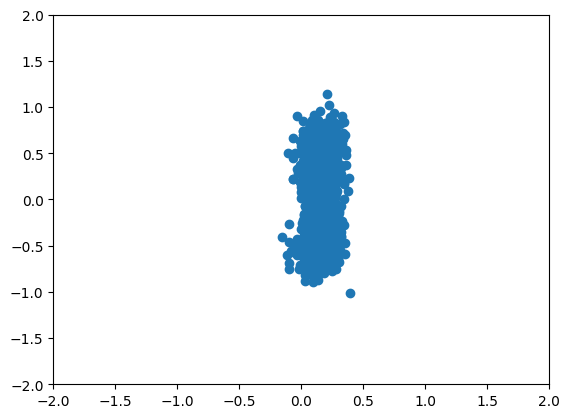

TEST 2000 logpx -24.847937
2100 0.20271884 time: 0.0008800029754638672
2200 0.20316374 time: 0.0008866786956787109
2300 0.18423124 time: 0.0008718967437744141
2400 0.18857801 time: 0.0008718967437744141
2500 0.19771235 time: 0.0008871555328369141
2600 0.19504371 time: 0.0008900165557861328
2700 0.1940095 time: 0.000888824462890625
2800 0.18758997 time: 0.0008919239044189453
2900 0.20147245 time: 0.0008409023284912109
3000 0.19605978 time: 0.0008869171142578125


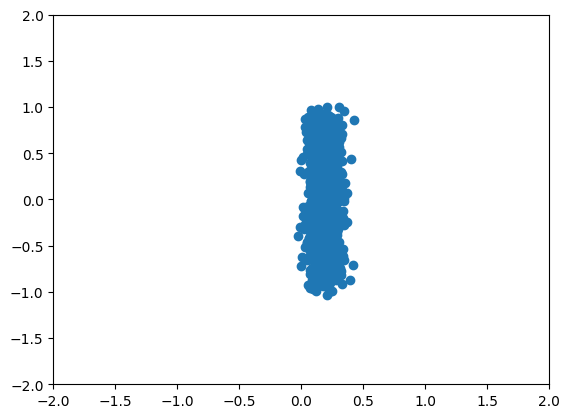

TEST 3000 logpx -3.4531505
3100 0.18760192 time: 0.0008821487426757812
3200 0.18916178 time: 0.0008940696716308594
3300 0.18910582 time: 0.0008749961853027344
3400 0.18827279 time: 0.0009047985076904297
3500 0.18198547 time: 0.0008807182312011719
3600 0.18283433 time: 0.0008649826049804688
3700 0.2103782 time: 0.0008540153503417969
3800 0.2070898 time: 0.0008702278137207031
3900 0.20708922 time: 0.0008573532104492188
4000 0.20613936 time: 0.0008919239044189453


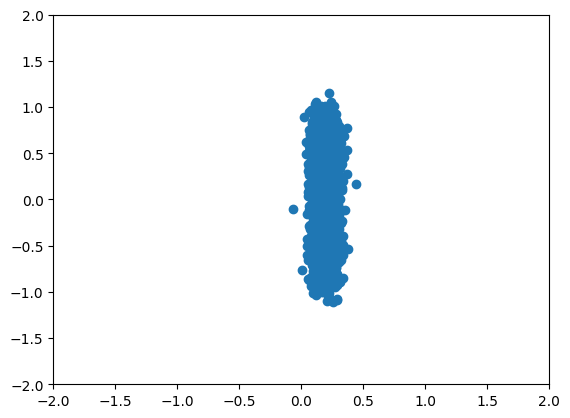

TEST 4000 logpx -0.24757773
4100 0.20273262 time: 0.0008895397186279297
4200 0.19769822 time: 0.0008459091186523438
4300 0.19402318 time: 0.0008838176727294922
4400 0.1826696 time: 0.0008656978607177734
4500 0.19321223 time: 0.0008513927459716797
4600 0.18391035 time: 0.0008661746978759766
4700 0.16990502 time: 0.0008757114410400391
4800 0.1914482 time: 0.0008924007415771484
4900 0.18183179 time: 0.0008785724639892578
5000 0.20371777 time: 0.000885009765625


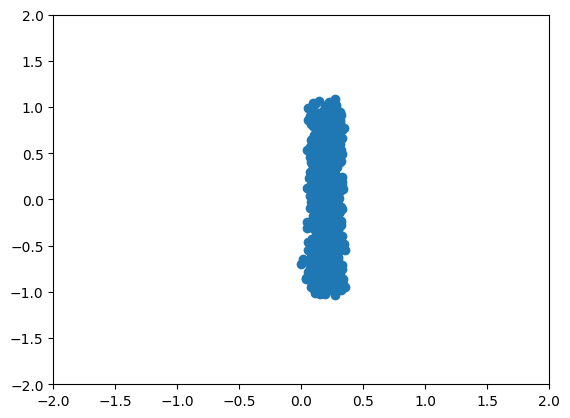

TEST 5000 logpx 0.2231392
5100 0.1856121 time: 0.0009207725524902344
5200 0.21028227 time: 0.0008609294891357422
5300 0.18181163 time: 0.0008754730224609375
5400 0.19510312 time: 0.0008392333984375
5500 0.20511274 time: 0.0008578300476074219
5600 0.17602588 time: 0.0008854866027832031
5700 0.17718026 time: 0.0008795261383056641
5800 0.19889009 time: 0.0008502006530761719
5900 0.185589 time: 0.0008478164672851562
6000 0.18973006 time: 0.0008728504180908203


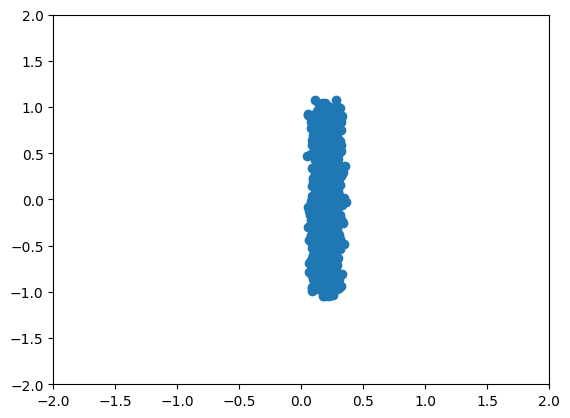

TEST 6000 logpx 0.21568464
6100 0.18582965 time: 0.0008599758148193359
6200 0.1787515 time: 0.0008656978607177734
6300 0.19394241 time: 0.0008807182312011719
6400 0.19978297 time: 0.0008831024169921875
6500 0.19305283 time: 0.0008826255798339844
6600 0.21656586 time: 0.0008566379547119141
6700 0.18373244 time: 0.00087738037109375
6800 0.17284854 time: 0.0008585453033447266
6900 0.18276629 time: 0.0008788108825683594
7000 0.19344859 time: 0.0008714199066162109


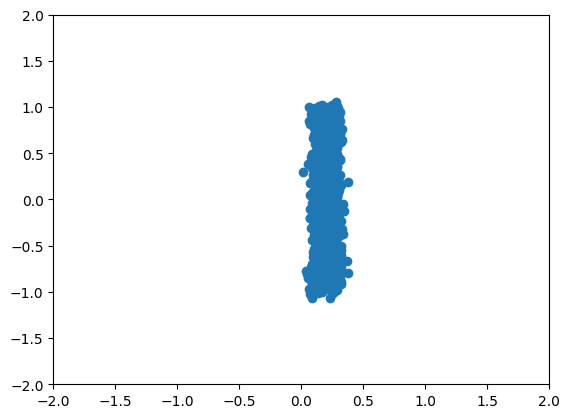

TEST 7000 logpx 0.4745262
7100 0.18714195 time: 0.0008804798126220703
7200 0.188481 time: 0.0008478164672851562
7300 0.19925159 time: 0.0008828639984130859
7400 0.19118837 time: 0.0008807182312011719
7500 0.17937906 time: 0.0008482933044433594
7600 0.19633168 time: 0.0008702278137207031
7700 0.18562925 time: 0.0008404254913330078
7800 0.20256312 time: 0.0008420944213867188
7900 0.19699186 time: 0.0008630752563476562
8000 0.16858666 time: 0.0008730888366699219


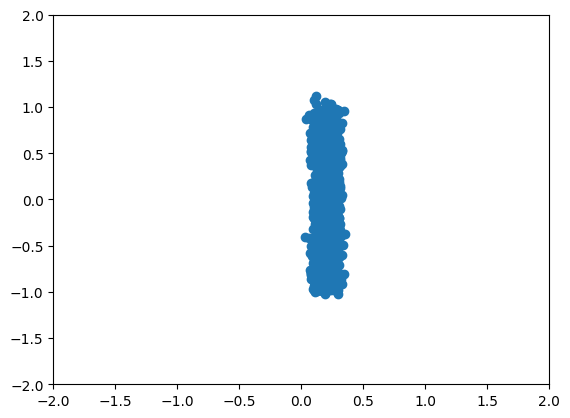

TEST 8000 logpx 0.53435326
8100 0.19065101 time: 0.0008828639984130859
8200 0.17815827 time: 0.0008518695831298828
8300 0.19114031 time: 0.0008792877197265625
8400 0.19341597 time: 0.0008721351623535156
8500 0.18306471 time: 0.0008914470672607422
8600 0.19790117 time: 0.0008878707885742188
8700 0.18748012 time: 0.0008835792541503906
8800 0.19366279 time: 0.0008690357208251953
8900 0.18921837 time: 0.0008859634399414062
9000 0.21133342 time: 0.0008759498596191406


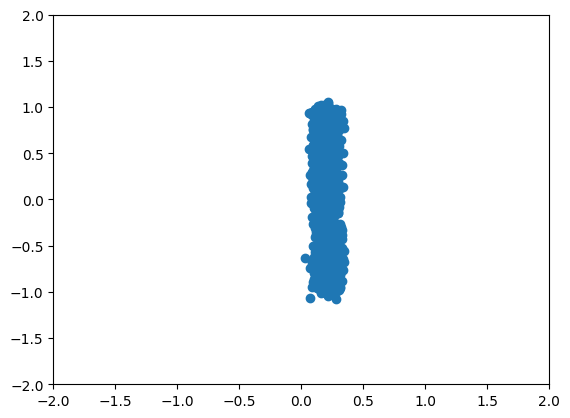

TEST 9000 logpx 0.6165527
9100 0.18128343 time: 0.0008749961853027344
9200 0.18133436 time: 0.0008873939514160156
9300 0.16802864 time: 0.0008592605590820312
9400 0.18166183 time: 0.0008869171142578125
9500 0.17861354 time: 0.0008485317230224609
9600 0.20579556 time: 0.0008823871612548828
9700 0.19896771 time: 0.0008718967437744141
9800 0.19369371 time: 0.0008568763732910156
9900 0.21536781 time: 0.0008606910705566406
10000 0.20325114 time: 0.0008573532104492188


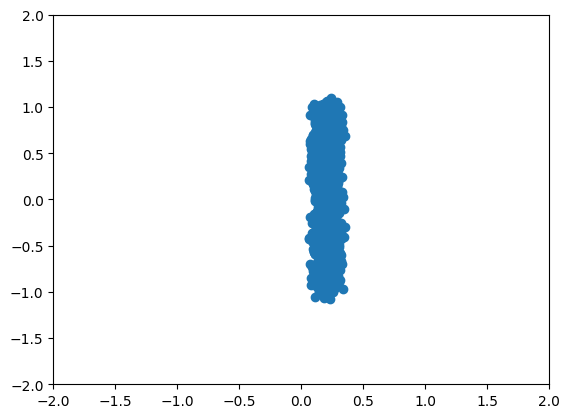

TEST 10000 logpx 0.726656
10100 0.21265297 time: 0.0008885860443115234
10200 0.1961968 time: 0.0008754730224609375
10300 0.20272769 time: 0.0008757114410400391
10400 0.2139436 time: 0.000850677490234375
10500 0.1850071 time: 0.0008649826049804688
10600 0.21615827 time: 0.0008764266967773438
10700 0.19906732 time: 0.0008671283721923828
10800 0.18228431 time: 0.0008776187896728516
10900 0.19061929 time: 0.0008723735809326172
11000 0.22053653 time: 0.0008573532104492188


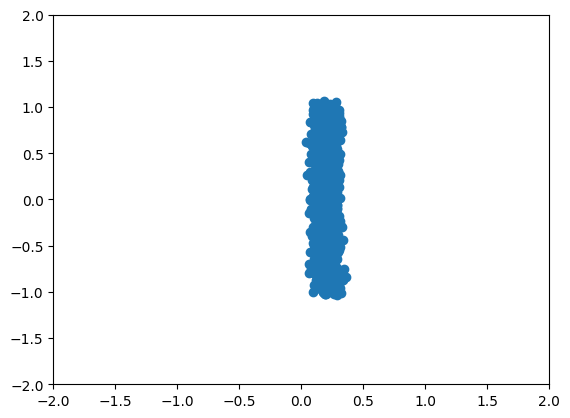

TEST 11000 logpx 0.75744087
11100 0.18032295 time: 0.0008602142333984375
11200 0.18250877 time: 0.0008361339569091797
11300 0.20918897 time: 0.0008864402770996094
11400 0.18057576 time: 0.0008296966552734375
11500 0.18555728 time: 0.0008714199066162109
11600 0.17768228 time: 0.0008525848388671875
11700 0.20283836 time: 0.0008695125579833984
11800 0.1829382 time: 0.0008592605590820312
11900 0.19198824 time: 0.0008821487426757812
12000 0.20024522 time: 0.0008802413940429688


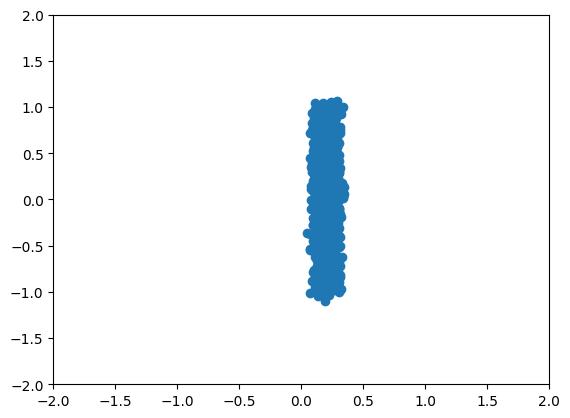

TEST 12000 logpx 0.8141472
12100 0.1586746 time: 0.0008633136749267578
12200 0.19436944 time: 0.0008697509765625
12300 0.22544496 time: 0.0008809566497802734
12400 0.17914695 time: 0.0008492469787597656
12500 0.1825058 time: 0.0008537769317626953
12600 0.206885 time: 0.0008745193481445312
12700 0.20972499 time: 0.0008330345153808594
12800 0.17293422 time: 0.0008552074432373047
12900 0.19095972 time: 0.0008761882781982422
13000 0.17296757 time: 0.0008633136749267578


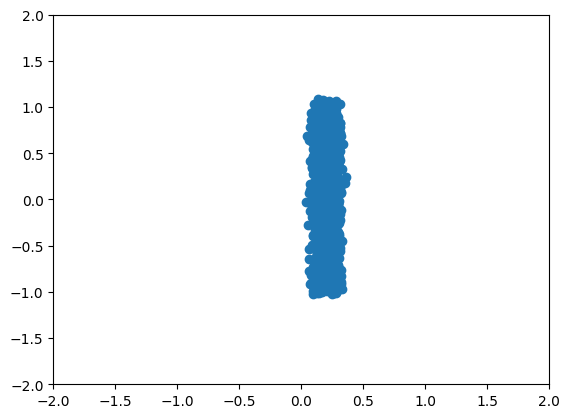

TEST 13000 logpx 0.76643795
13100 0.19358476 time: 0.0008826255798339844
13200 0.1883584 time: 0.0008733272552490234
13300 0.19392951 time: 0.0008738040924072266
13400 0.19824867 time: 0.0008540153503417969
13500 0.20834772 time: 0.0008399486541748047
13600 0.19829875 time: 0.0008699893951416016
13700 0.19524755 time: 0.0008890628814697266
13800 0.20098396 time: 0.00083160400390625
13900 0.19618607 time: 0.0008771419525146484
14000 0.18529332 time: 0.0008611679077148438


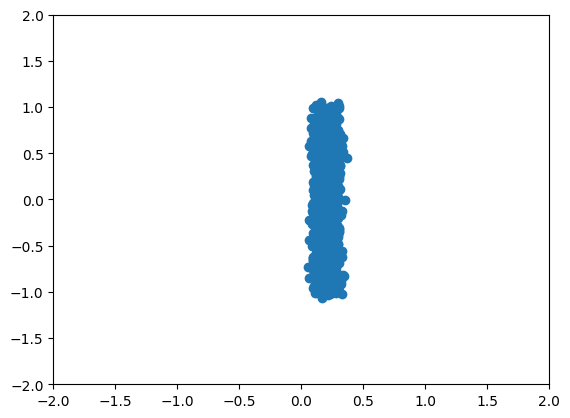

TEST 14000 logpx 0.82479715
14100 0.17203625 time: 0.0008745193481445312
14200 0.19628516 time: 0.0008831024169921875
14300 0.19943558 time: 0.0008733272552490234
14400 0.20209007 time: 0.0008759498596191406
14500 0.19736995 time: 0.0008614063262939453
14600 0.20005701 time: 0.0008935928344726562
14700 0.2035327 time: 0.0008559226989746094
14800 0.18527402 time: 0.0008573532104492188
14900 0.1932169 time: 0.0008537769317626953
15000 0.19195335 time: 0.0008730888366699219


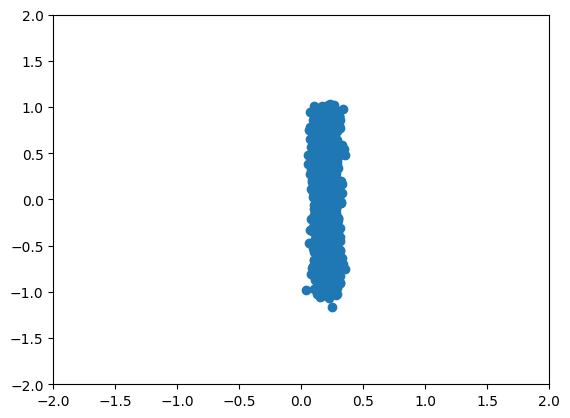

TEST 15000 logpx 0.7117037


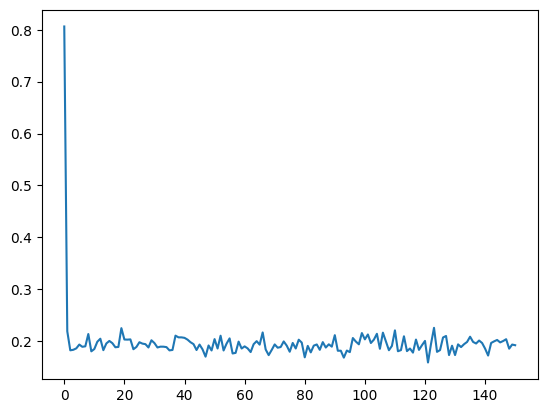

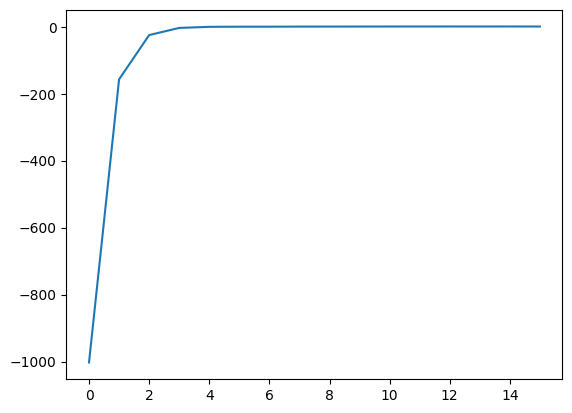

In [33]:
# Train Right Bar EBM Model
batch_size = 1000
data_dim = 2
num_steps = 15001

EMA = .999

n_steps = 100
net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = right_bar()
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    # if ebm:
    #   for t in range(10):
    #     dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
    #     plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

flow_params = params
flow_rng = next(rng_seq)

right_bar_params = ema_params

In [34]:
params = {}

for k, v in left_bar_params.items():
  params[k] = v

for k, v in right_bar_params.items():
  k = k.replace('resnet_diffusion_model/', 'resnet_diffusion_model_1/')
  params[k] = v

/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


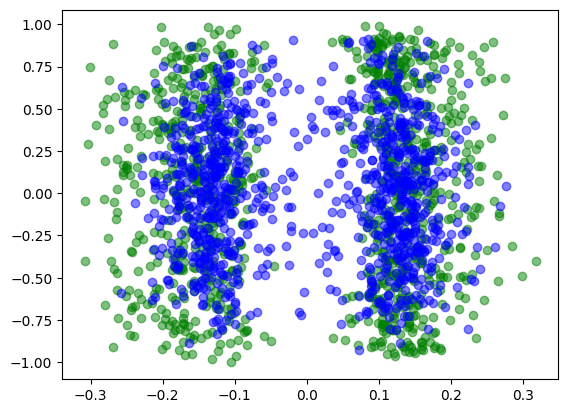

In [35]:
# Sampling from disjunction of distributions
import matplotlib.pyplot as plt

dim = 2
n_mode = 4
std = .05
init_std = 1.
init_mu = 0.
n_steps = 10
damping = .5
mass_diag_sqrt = 1.
num_leapfrog = 3
samples_per_step = 10
uha_step_size = .03
ula_step_size = .001

batch_size = 1000

rng_seq = hk.PRNGSequence(0)

means = jax.random.normal(next(rng_seq), (n_mode, dim))
comp_dists = distrax.MultivariateNormalDiag(means, jnp.ones_like(means) * std)
pi = distrax.Categorical(logits=jnp.zeros((n_mode,)))
target_dist = distrax.MixtureSameFamily(pi, comp_dists)
initial_dist = distrax.MultivariateNormalDiag(means[0] * 0 + init_mu, init_std * jnp.ones_like(means[0]))


x_init = initial_dist.sample(seed=next(rng_seq), sample_shape=(batch_size,))
logZs = []
n_stepss = [100]

def gradient_function(x, t):
  t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
  return -1 *dual_mixture_gradient_fn(params, next(rng_seq), x, t)

if ebm:
  def energy_function(x, t):
    t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
    return -1 *dual_mixture_energy_fn(params, next(rng_seq), x, t)

for n_steps in n_stepss:
  ula_step_sizes = jnp.ones((n_steps,)) * ula_step_size
  uha_step_sizes = jnp.ones((n_steps,)) * uha_step_size

  betas = jnp.linspace(0., 1., n_steps)

  def target_function(x, i):
    beta = betas[i]
    init_lp = initial_dist.log_prob(x)
    targ_lp = target_dist.log_prob(x)
    return beta * targ_lp + (1 - beta) * init_lp

  # Choose the sampler to use
  # sampler = AnnealedULASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function)
  # sampler = AnnealedMALASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)
  # sampler = AnnealedUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function)
  sampler = AnnealedMUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)

  x_samp, logw, accept = sampler.sample(next(rng_seq), batch_size)
  rng_seq = hk.PRNGSequence(1)
  grad_sample = dual_mixture_sample_fn(params, next(rng_seq), batch_size, jnp.inf)

  # Samples from MCMC
  plt.scatter(x_samp[:, 0], x_samp[:, 1], color='green', alpha=.5)

  # Samples generated from adding score function
  plt.scatter(grad_sample[:, 0], grad_sample[:, 1], color='blue', alpha=.5)


  plt.show()

Excute Negation Composition

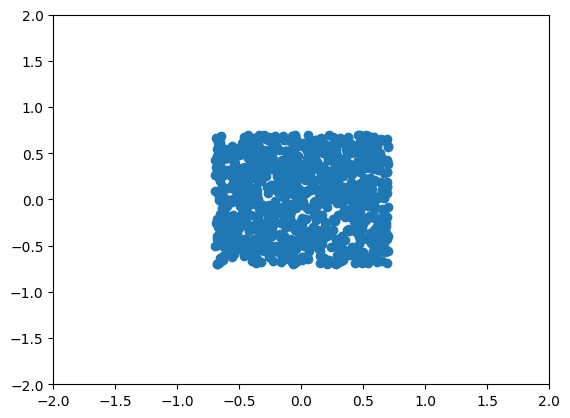

/tmp/ipykernel_1365333/3185105445.py:59: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/3185105445.py:60: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():


portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/3185105445.py:98: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)
/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


0 0.7788463 time: 1.6748623847961426


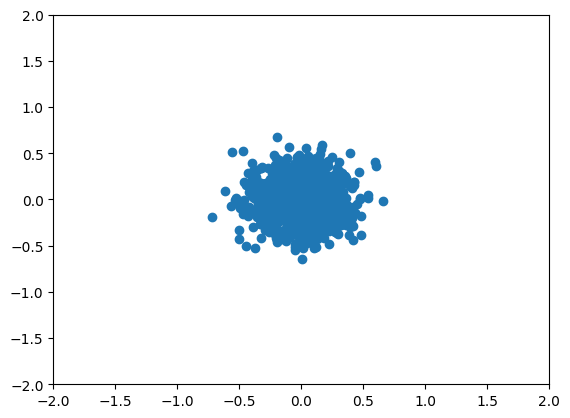

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -1002.099


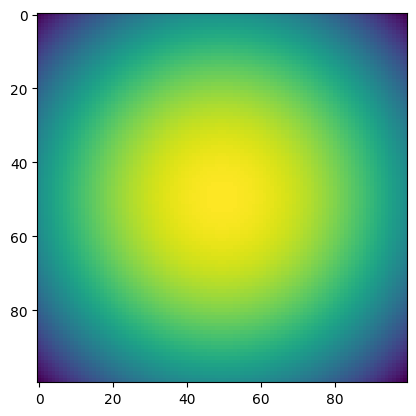

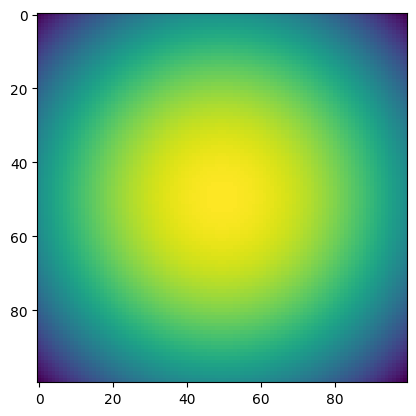

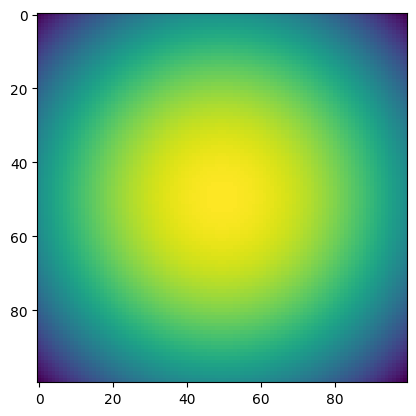

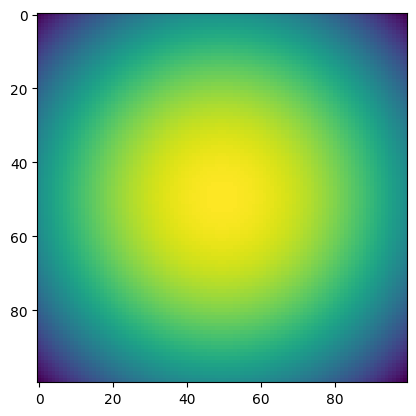

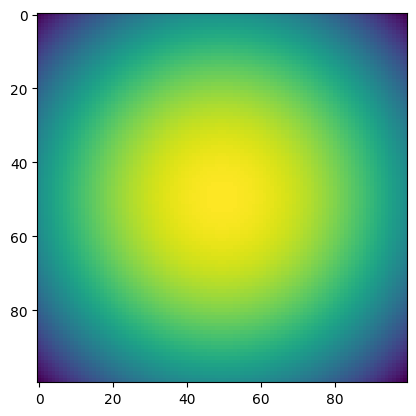

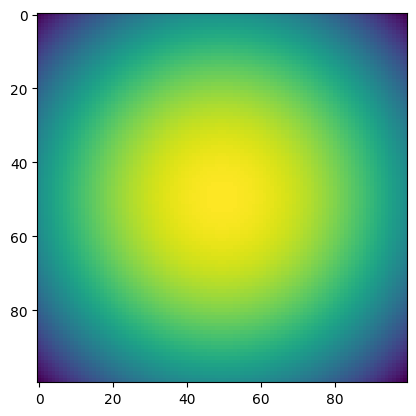

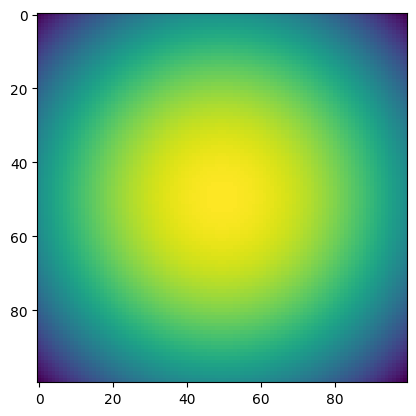

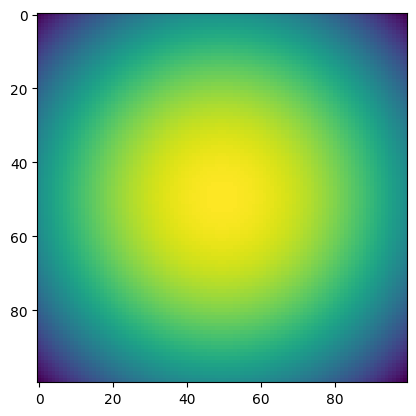

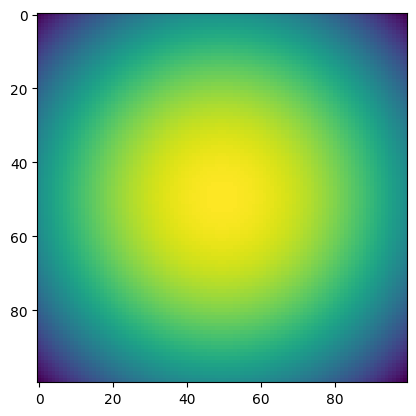

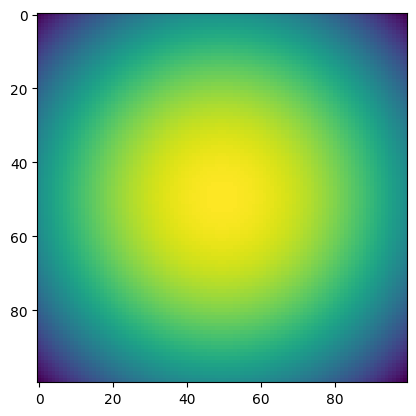

/tmp/ipykernel_1365333/3185105445.py:98: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.272245 time: 0.0008304119110107422
200 0.265157 time: 0.0008547306060791016
300 0.3087298 time: 0.0008370876312255859
400 0.2561254 time: 0.0008373260498046875
500 0.26255637 time: 0.0008366107940673828
600 0.26070344 time: 0.0008327960968017578
700 0.26443005 time: 0.0008563995361328125
800 0.26395994 time: 0.0008373260498046875
900 0.24498361 time: 0.0008356571197509766
1000 0.2647456 time: 0.0008389949798583984


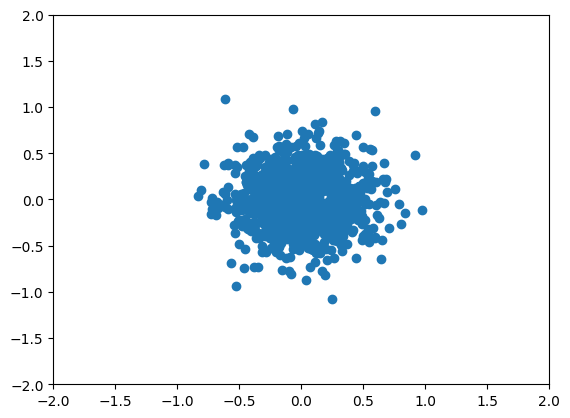

TEST 1000 logpx -133.4958


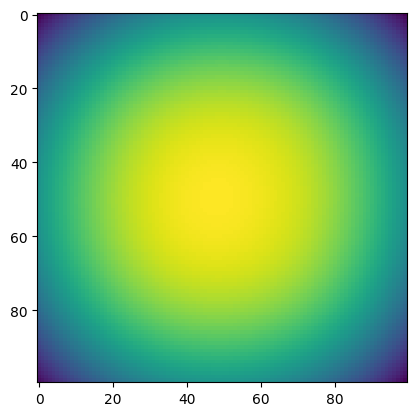

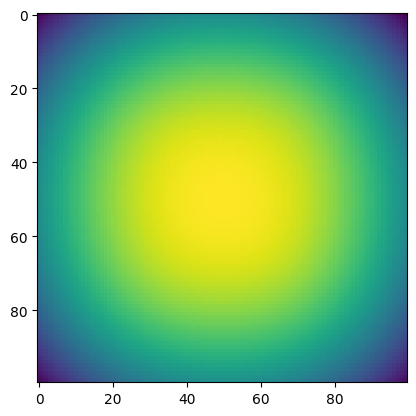

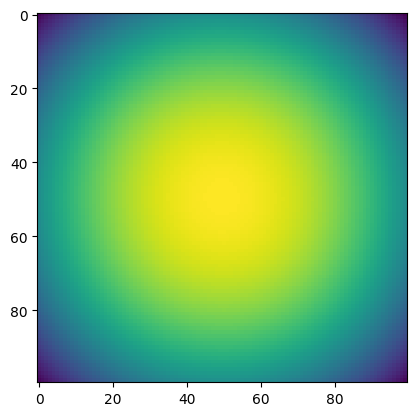

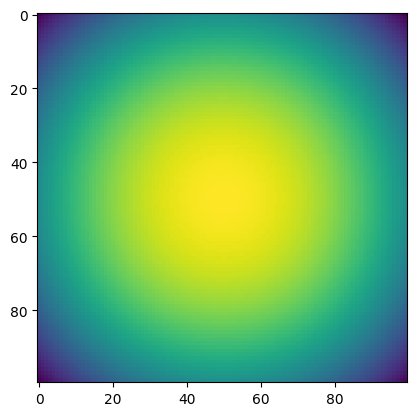

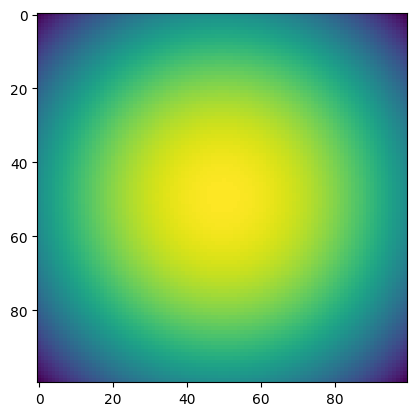

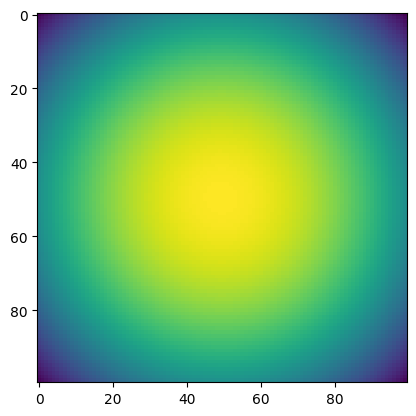

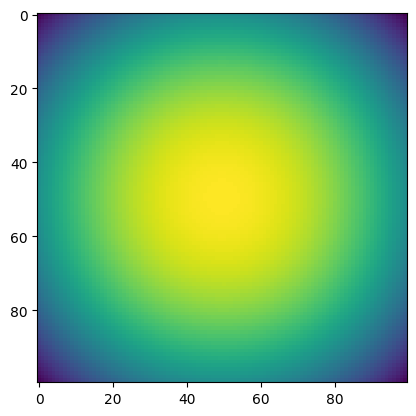

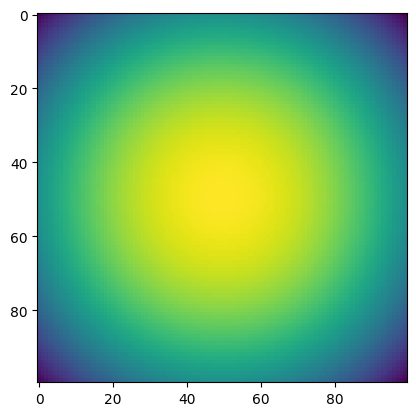

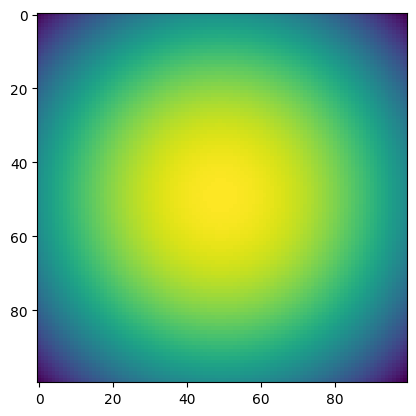

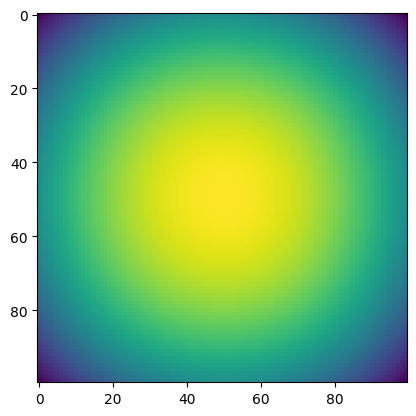

1100 0.25227118 time: 0.0008296966552734375
1200 0.23964876 time: 0.0008358955383300781
1300 0.2708058 time: 0.0008366107940673828
1400 0.26266712 time: 0.0008378028869628906
1500 0.26519674 time: 0.0008358955383300781
1600 0.24598964 time: 0.0008411407470703125
1700 0.24992123 time: 0.0008342266082763672
1800 0.2735073 time: 0.000835418701171875
1900 0.26654285 time: 0.0008313655853271484
2000 0.2986761 time: 0.0008351802825927734


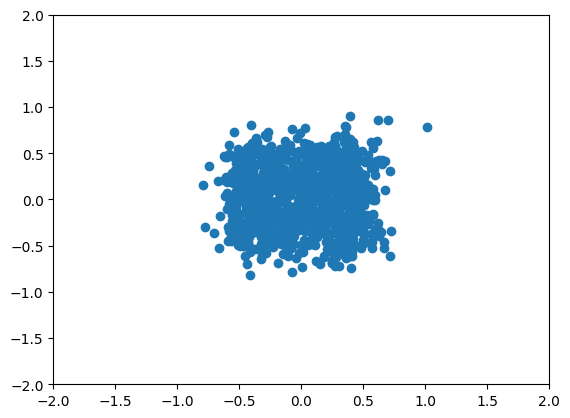

TEST 2000 logpx -22.797375


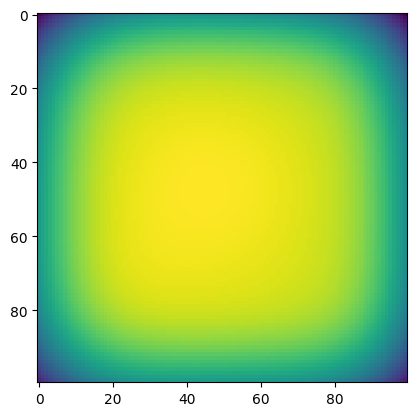

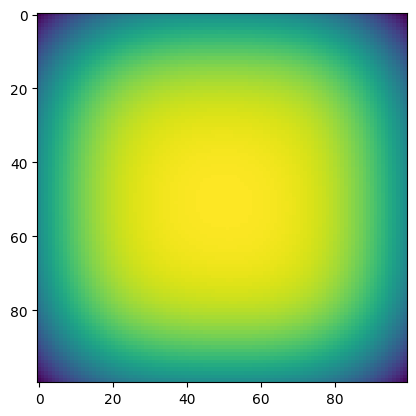

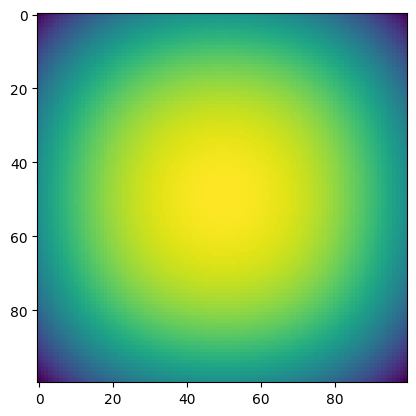

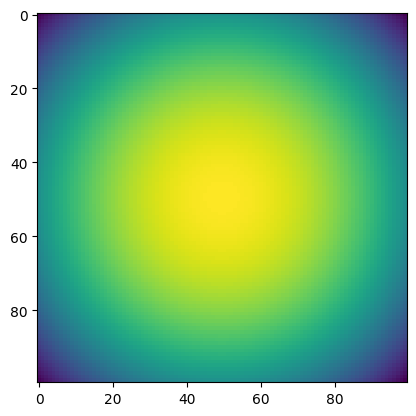

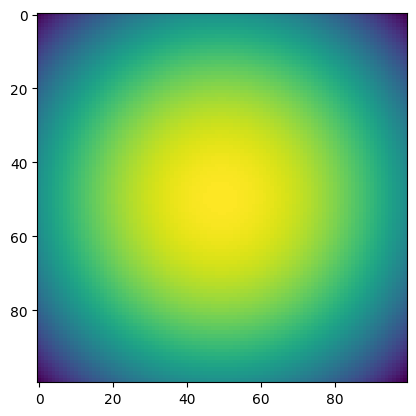

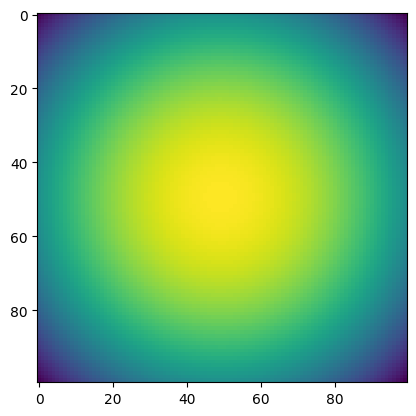

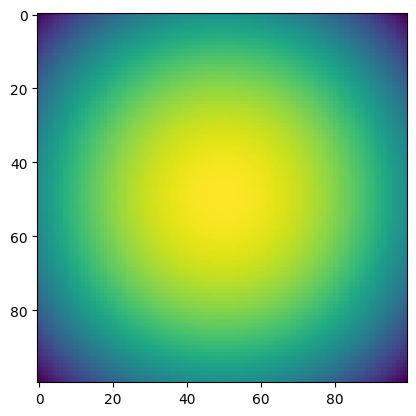

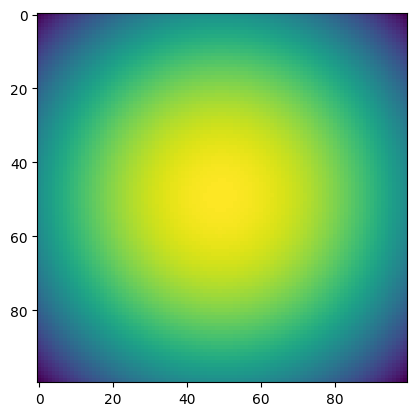

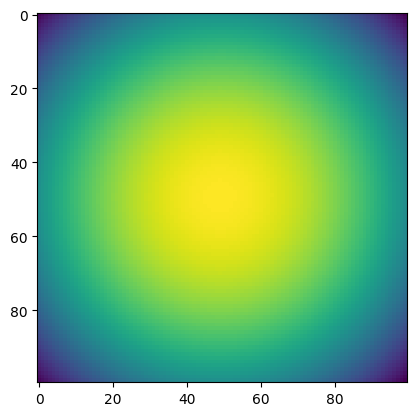

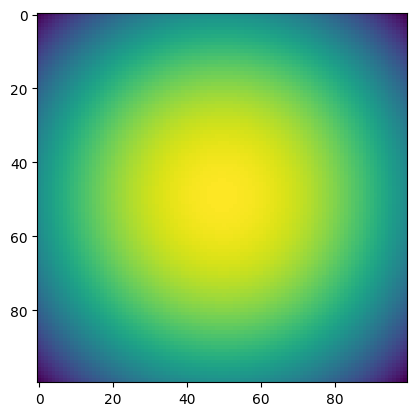

2100 0.25967836 time: 0.0008661746978759766
2200 0.26042634 time: 0.0008335113525390625
2300 0.27285248 time: 0.0008358955383300781
2400 0.28370142 time: 0.0008511543273925781
2500 0.23764597 time: 0.0008308887481689453
2600 0.26397106 time: 0.0008418560028076172
2700 0.25837374 time: 0.0008537769317626953
2800 0.27345333 time: 0.0008270740509033203
2900 0.31054127 time: 0.0008349418640136719
3000 0.28401992 time: 0.0008358955383300781


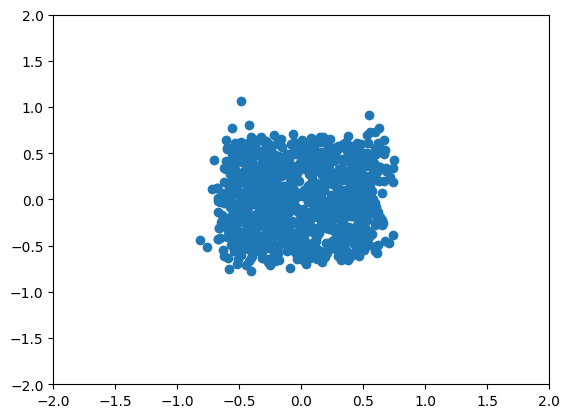

TEST 3000 logpx -4.4741373


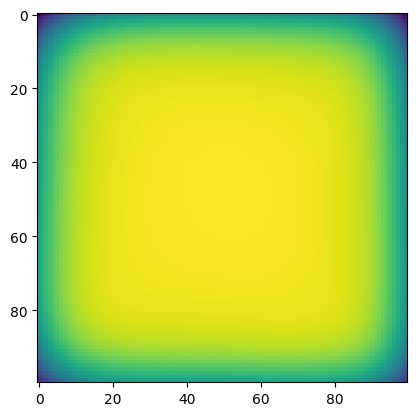

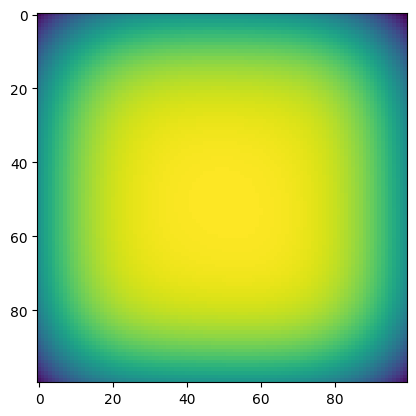

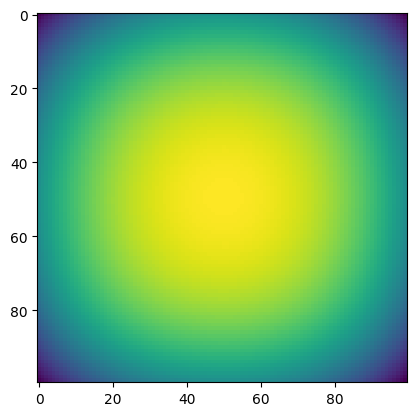

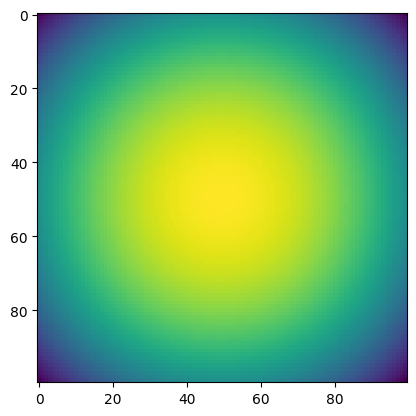

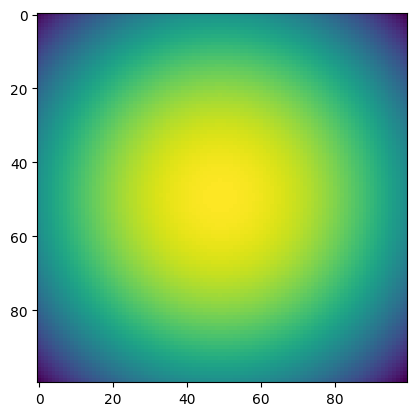

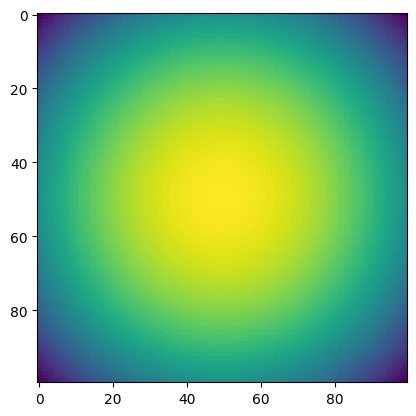

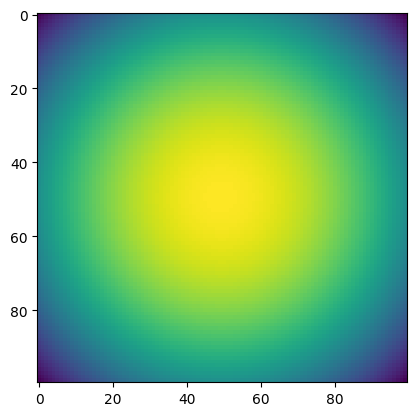

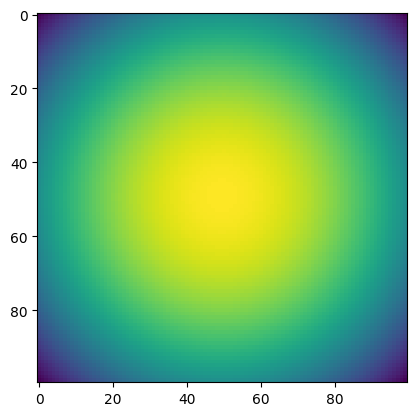

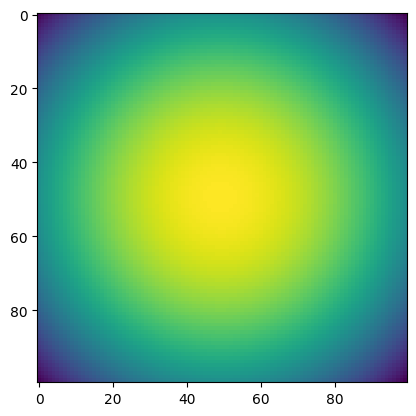

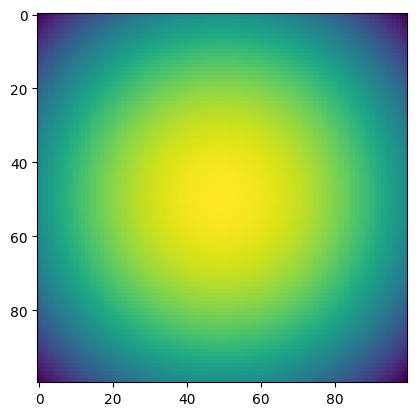

3100 0.27272642 time: 0.0008401870727539062
3200 0.27205607 time: 0.0008425712585449219
3300 0.29252443 time: 0.0008618831634521484
3400 0.2924073 time: 0.0008401870727539062
3500 0.28561354 time: 0.0008401870727539062
3600 0.27778342 time: 0.0008540153503417969
3700 0.26034582 time: 0.0008404254913330078
3800 0.24647984 time: 0.0008633136749267578
3900 0.26002988 time: 0.0008537769317626953
4000 0.2724106 time: 0.0008330345153808594


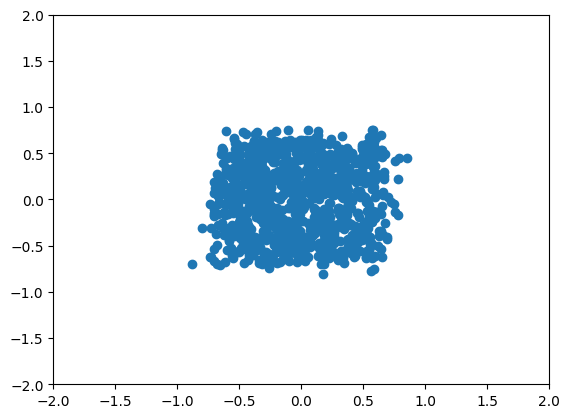

TEST 4000 logpx -1.6697259


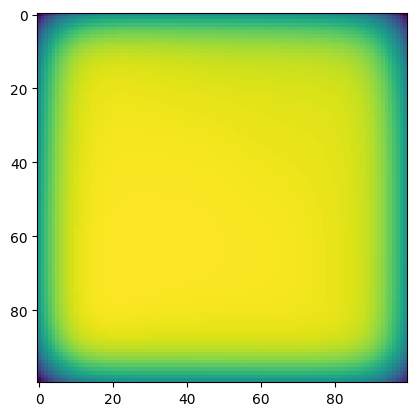

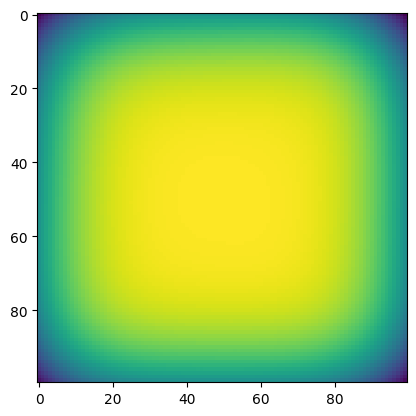

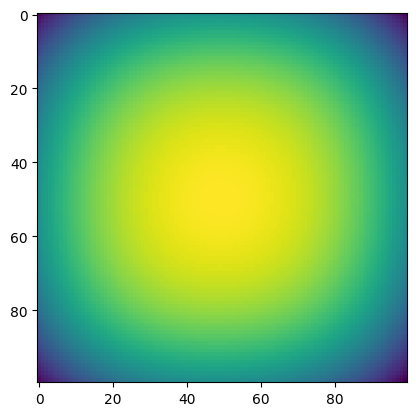

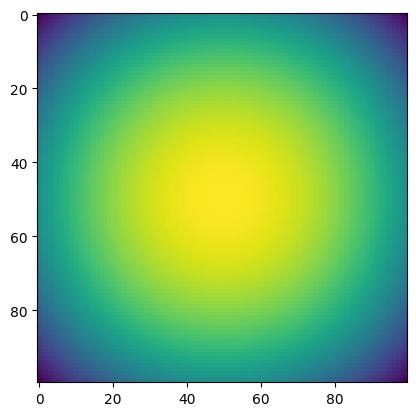

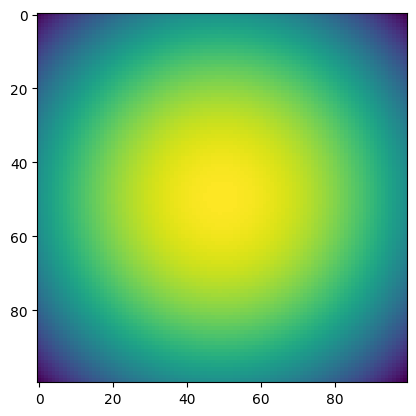

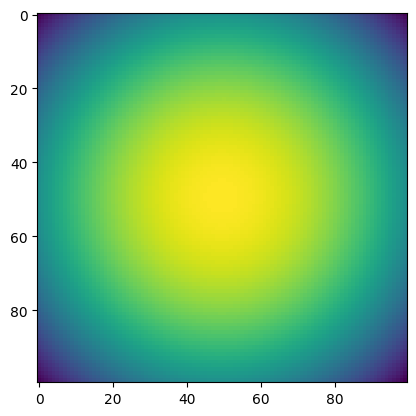

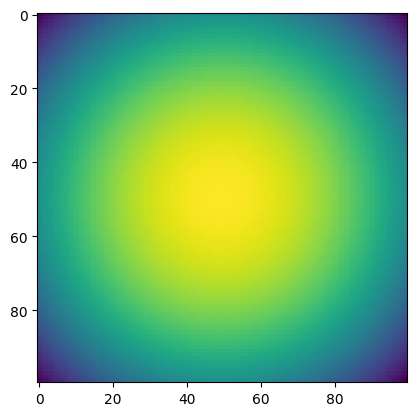

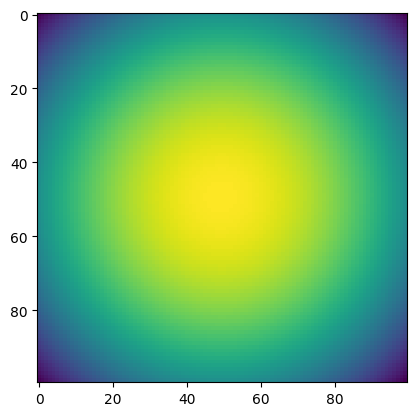

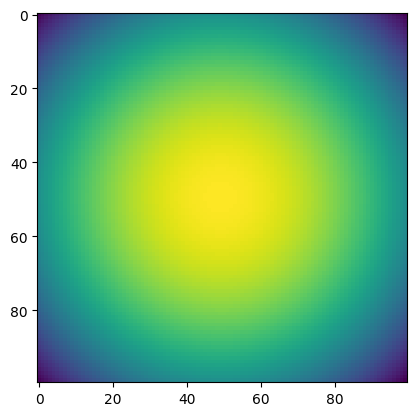

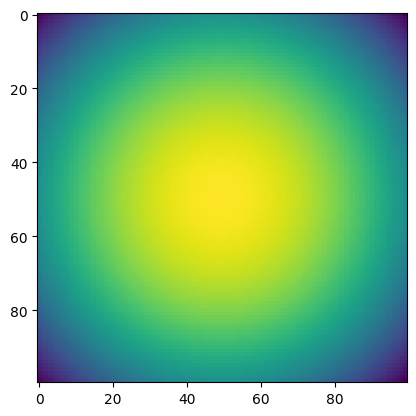

4100 0.268991 time: 0.0008368492126464844
4200 0.28759012 time: 0.0008373260498046875
4300 0.2580077 time: 0.0008444786071777344
4400 0.27374372 time: 0.0008399486541748047
4500 0.26661384 time: 0.0008416175842285156
4600 0.31065294 time: 0.0008363723754882812
4700 0.2777754 time: 0.0008456707000732422
4800 0.264417 time: 0.0008535385131835938
4900 0.24779527 time: 0.0008518695831298828
5000 0.30108377 time: 0.0008494853973388672


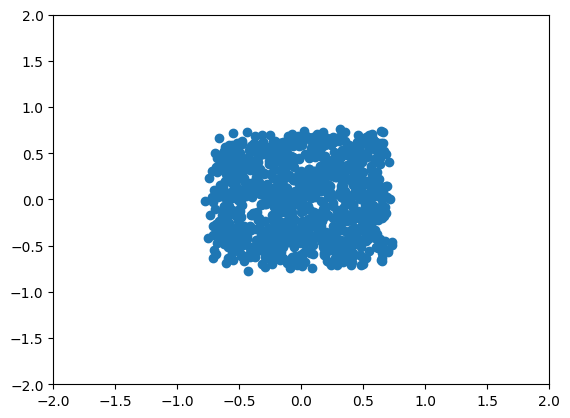

TEST 5000 logpx -1.2590425


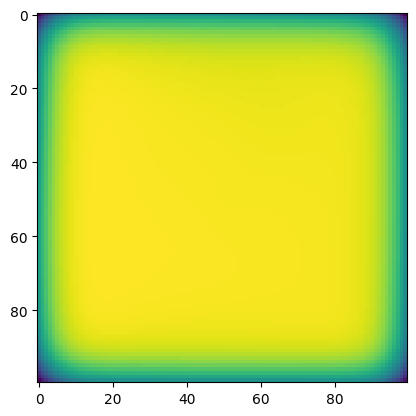

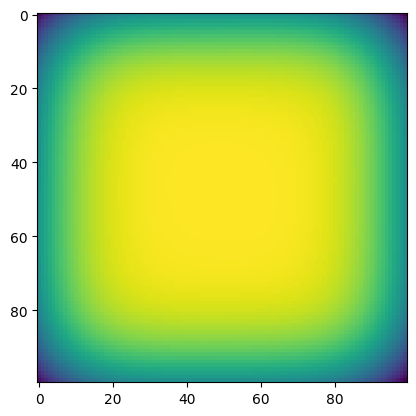

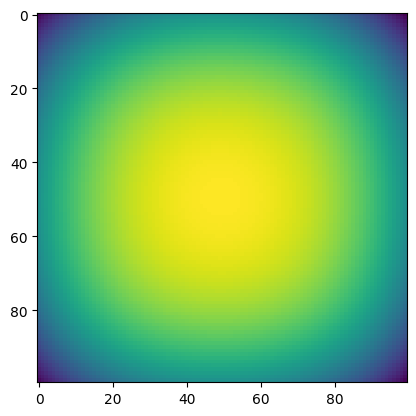

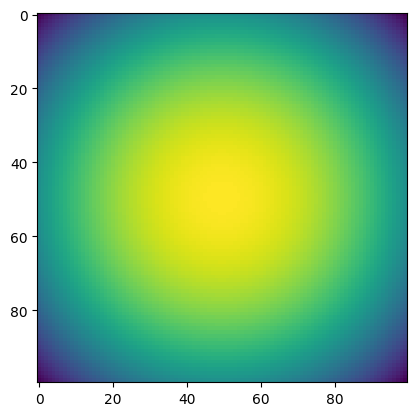

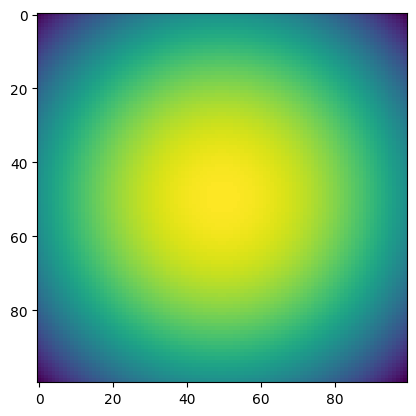

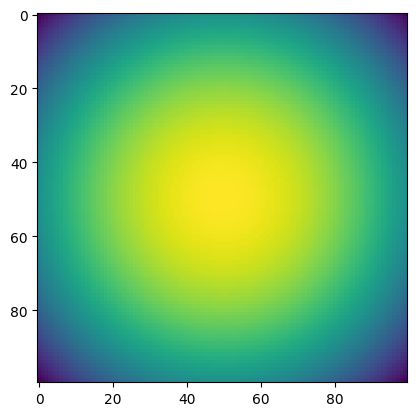

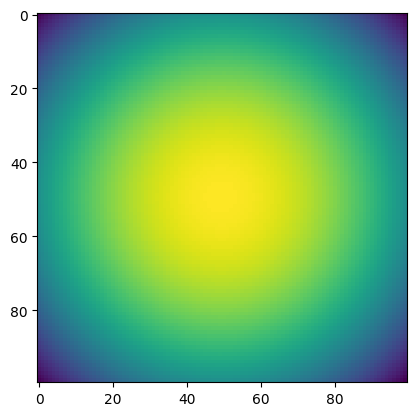

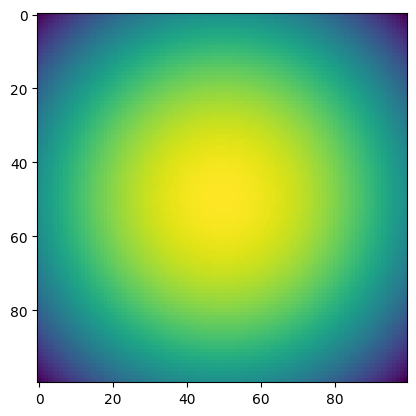

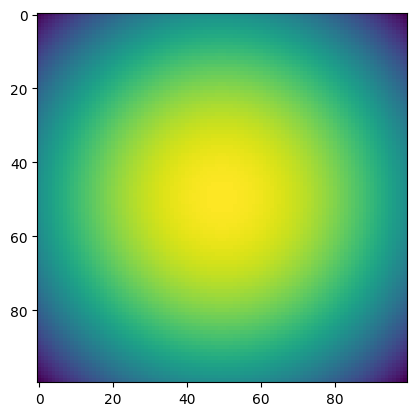

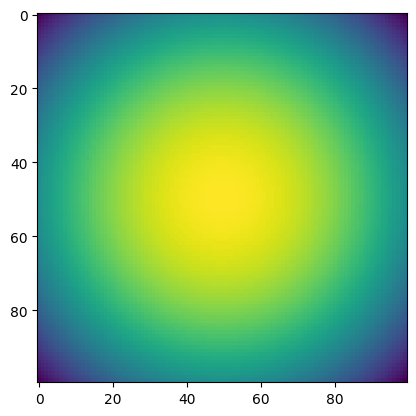

5100 0.27564535 time: 0.0009140968322753906
5200 0.28922194 time: 0.0008366107940673828
5300 0.26160553 time: 0.0008375644683837891
5400 0.23869006 time: 0.0008373260498046875
5500 0.2842676 time: 0.0008442401885986328
5600 0.2790143 time: 0.0008349418640136719
5700 0.27809298 time: 0.0008313655853271484
5800 0.2929776 time: 0.0008327960968017578
5900 0.28406575 time: 0.0008296966552734375
6000 0.26419786 time: 0.000843048095703125


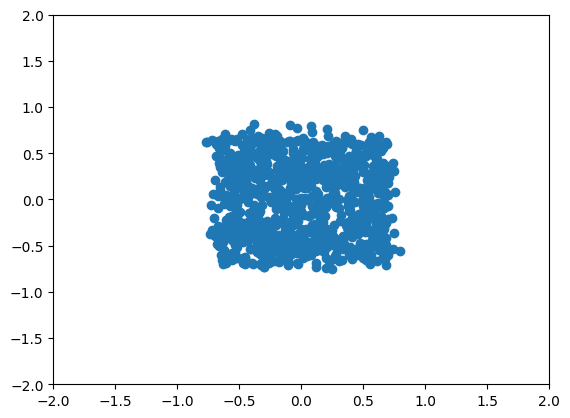

TEST 6000 logpx -0.87420005


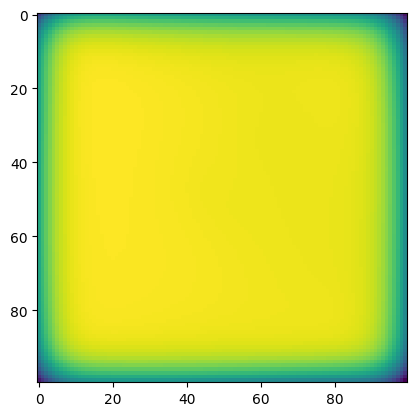

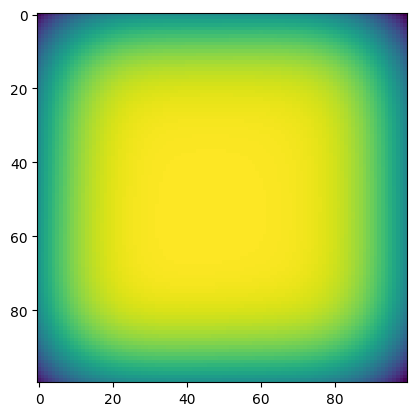

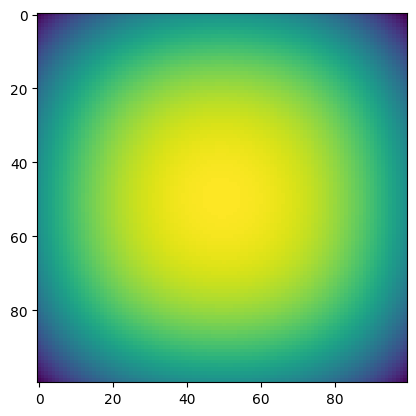

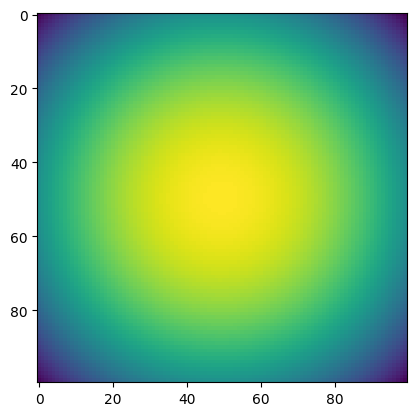

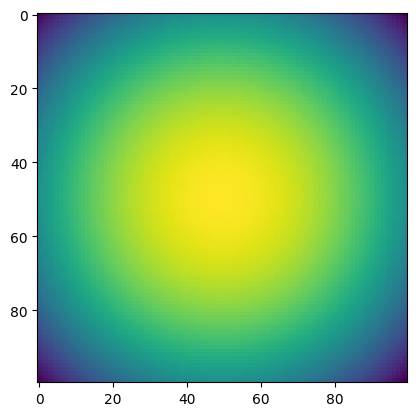

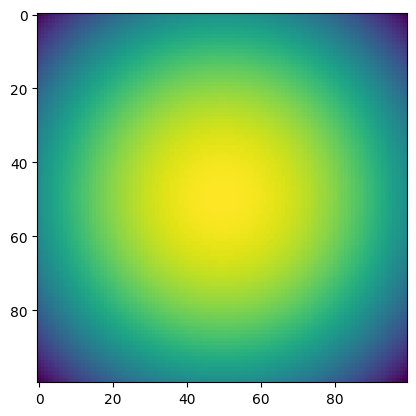

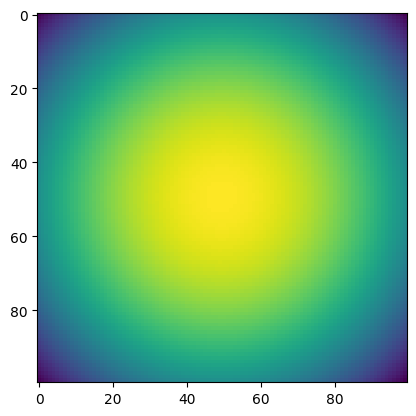

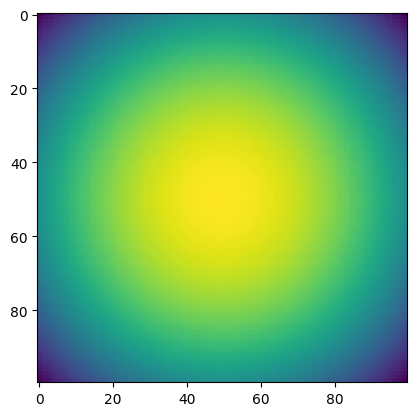

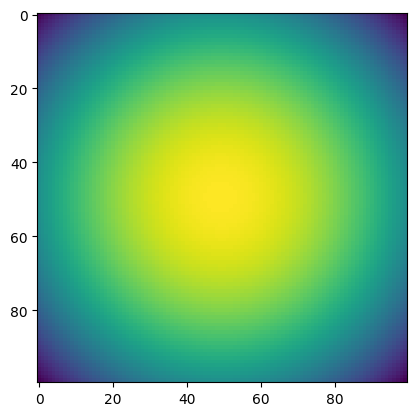

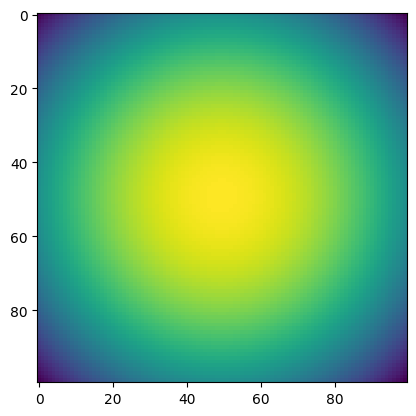

6100 0.25582004 time: 0.0008475780487060547
6200 0.25082293 time: 0.0008416175842285156
6300 0.2758412 time: 0.0008366107940673828
6400 0.27054536 time: 0.0008423328399658203
6500 0.24263497 time: 0.0008378028869628906
6600 0.26228303 time: 0.0008399486541748047
6700 0.2679803 time: 0.0008306503295898438
6800 0.26094234 time: 0.0008349418640136719
6900 0.2872915 time: 0.0008378028869628906
7000 0.24929516 time: 0.0008347034454345703


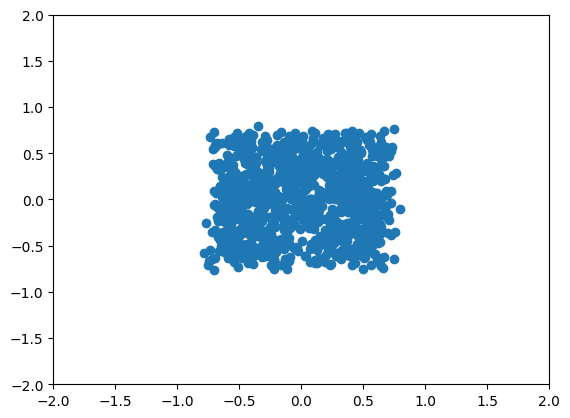

TEST 7000 logpx -0.87007904


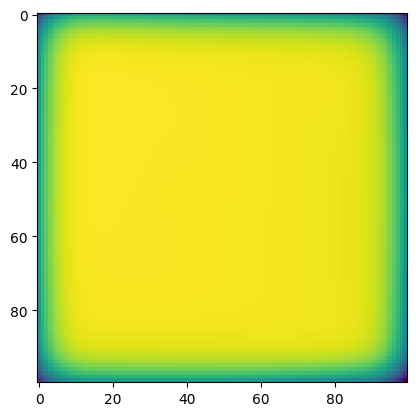

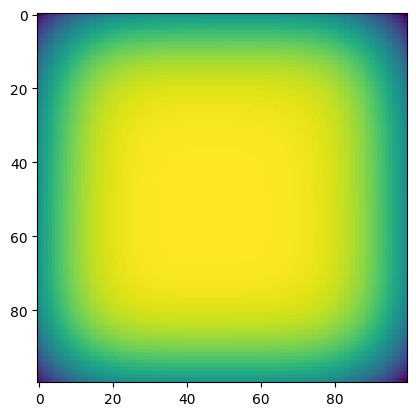

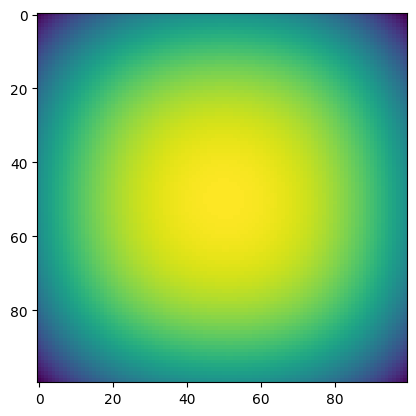

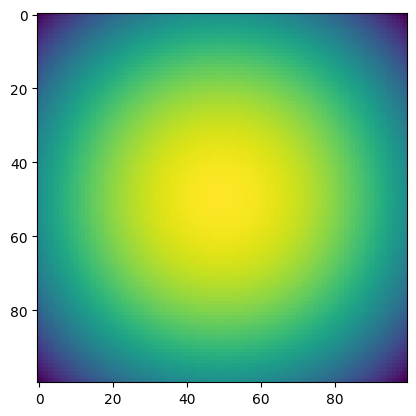

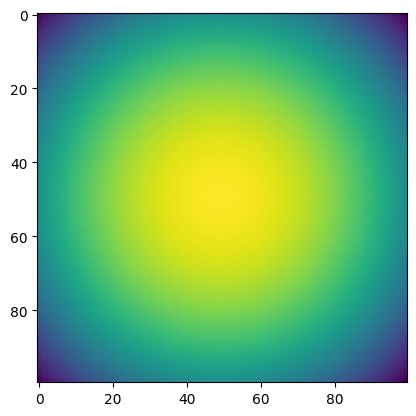

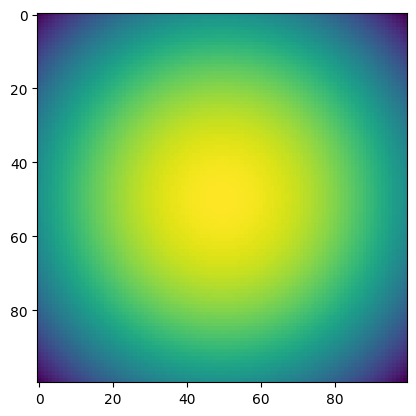

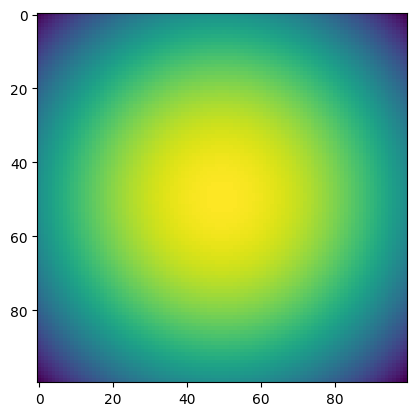

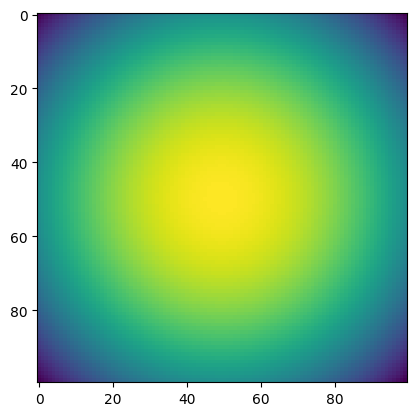

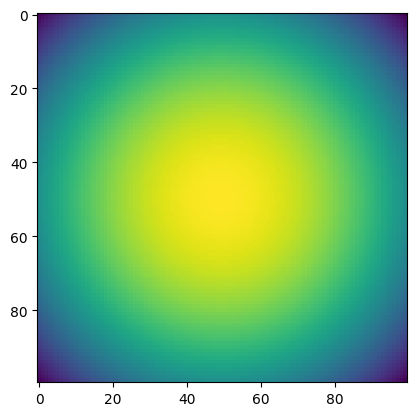

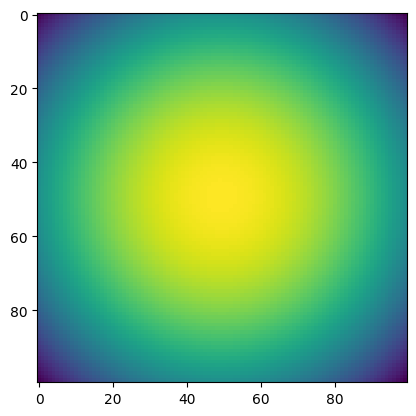

7100 0.27955425 time: 0.0008356571197509766
7200 0.26492524 time: 0.001169443130493164
7300 0.28140742 time: 0.0008492469787597656
7400 0.29261795 time: 0.0008370876312255859
7500 0.28238848 time: 0.0008361339569091797
7600 0.2620853 time: 0.0008420944213867188
7700 0.28644013 time: 0.001100301742553711
7800 0.26338744 time: 0.0008332729339599609
7900 0.2708333 time: 0.0008358955383300781
8000 0.24519008 time: 0.0008428096771240234


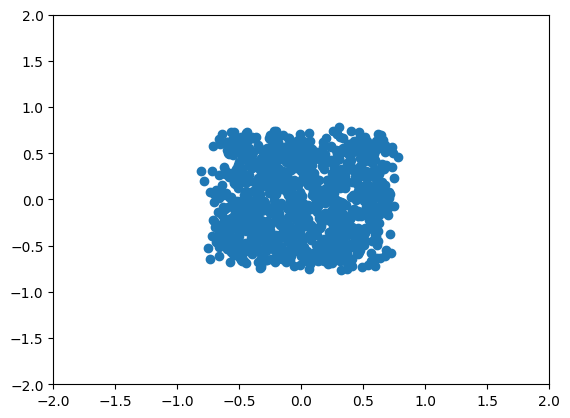

TEST 8000 logpx -0.7219658


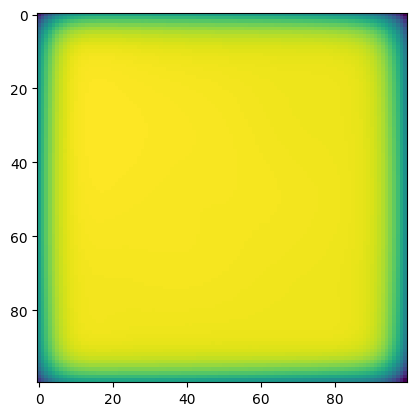

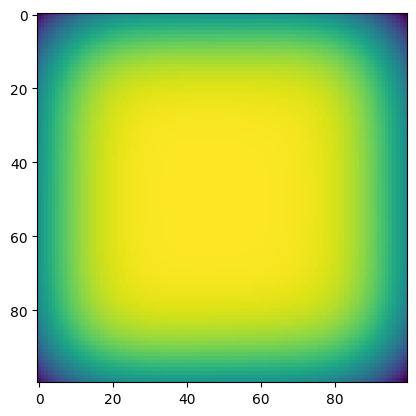

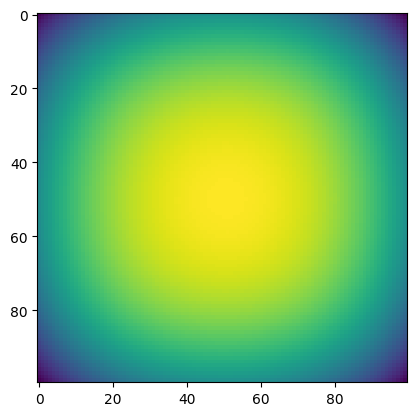

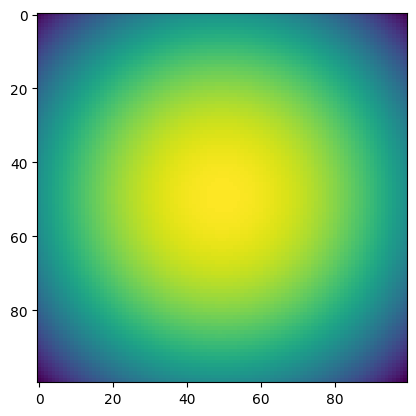

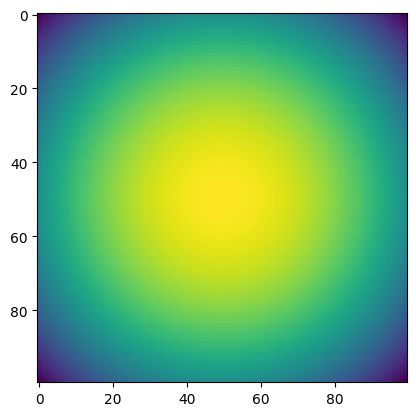

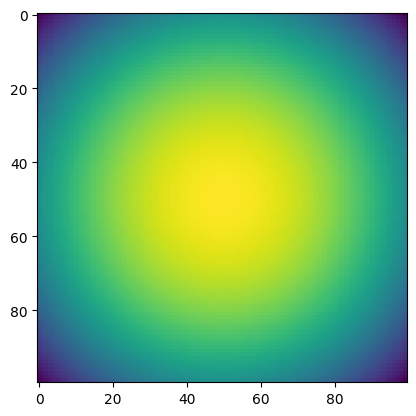

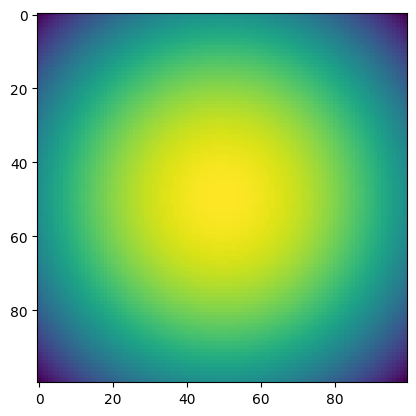

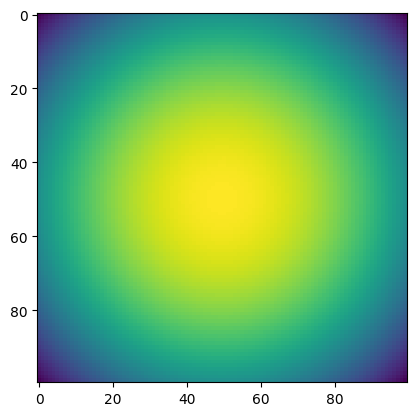

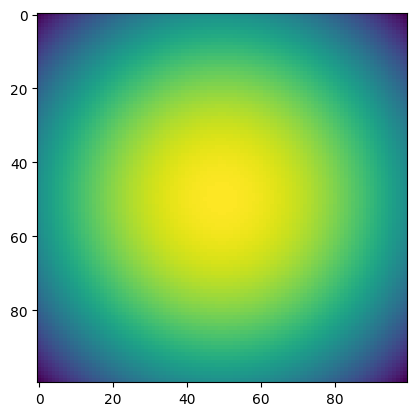

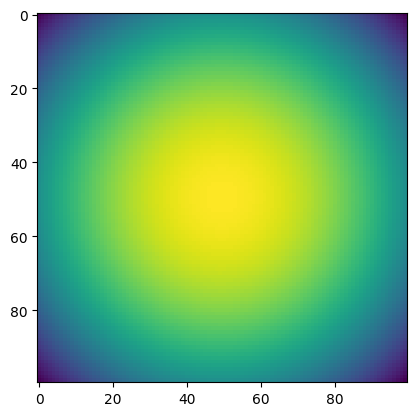

8100 0.28474066 time: 0.0008475780487060547
8200 0.2570857 time: 0.0008409023284912109
8300 0.2522442 time: 0.0008389949798583984
8400 0.2639463 time: 0.00084686279296875
8500 0.2870265 time: 0.0008399486541748047
8600 0.26519686 time: 0.0008344650268554688
8700 0.26005462 time: 0.0008502006530761719
8800 0.270643 time: 0.0008485317230224609
8900 0.25420967 time: 0.0008366107940673828
9000 0.26546276 time: 0.0008387565612792969


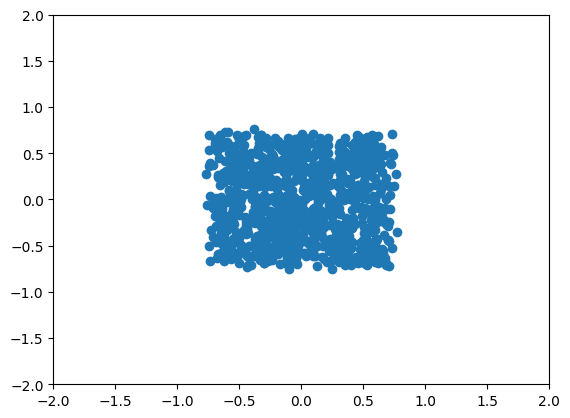

TEST 9000 logpx -0.67399824


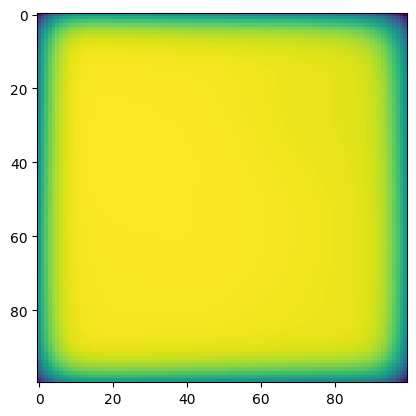

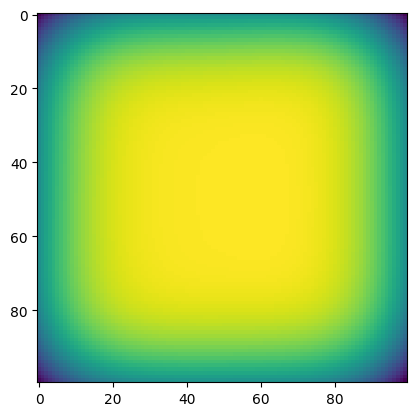

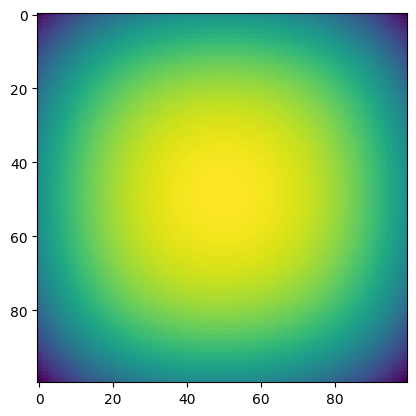

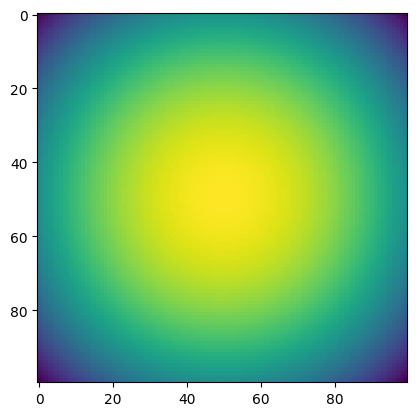

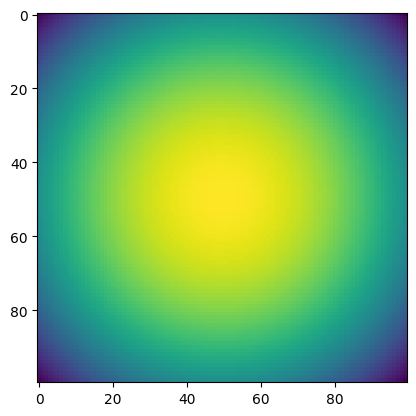

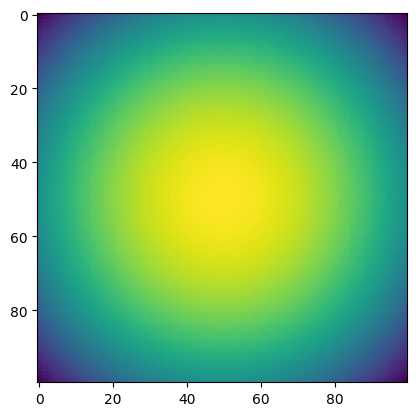

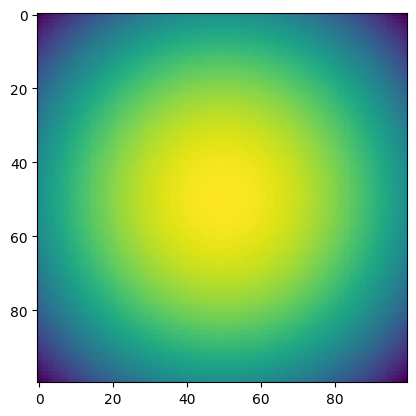

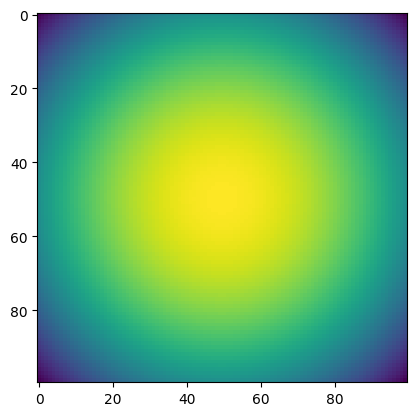

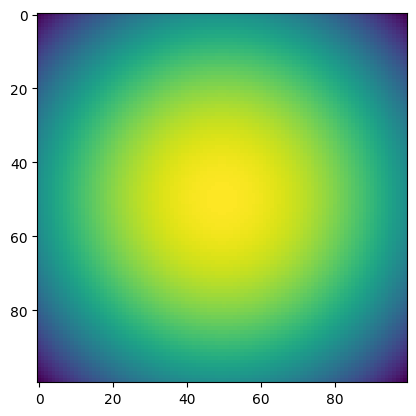

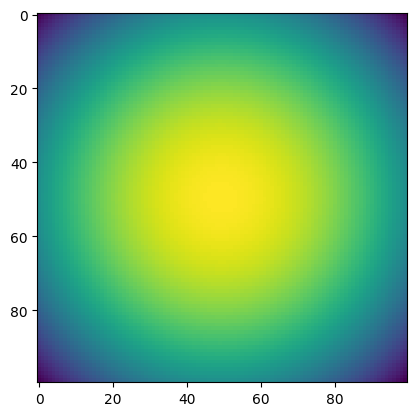

9100 0.27469733 time: 0.0008416175842285156
9200 0.24232243 time: 0.0008342266082763672
9300 0.26232985 time: 0.0008356571197509766
9400 0.25294027 time: 0.0008327960968017578
9500 0.27757052 time: 0.0008380413055419922
9600 0.26288214 time: 0.0008368492126464844
9700 0.2647175 time: 0.0013585090637207031
9800 0.25096986 time: 0.0008759498596191406
9900 0.26690337 time: 0.0008351802825927734
10000 0.24454342 time: 0.0008690357208251953


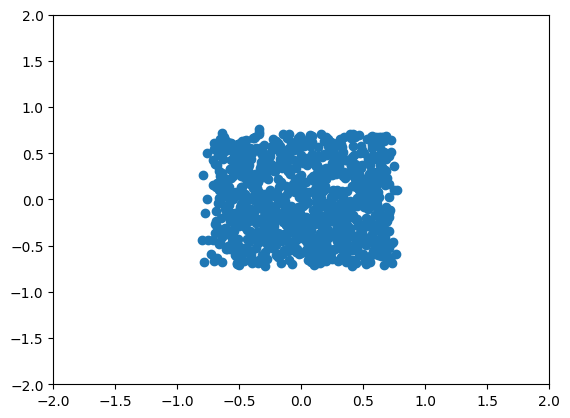

TEST 10000 logpx -0.55077785


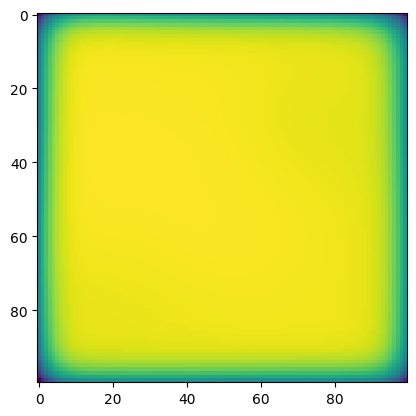

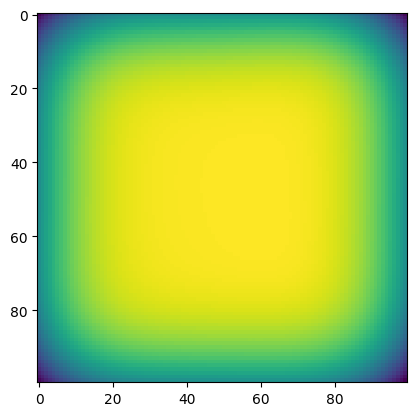

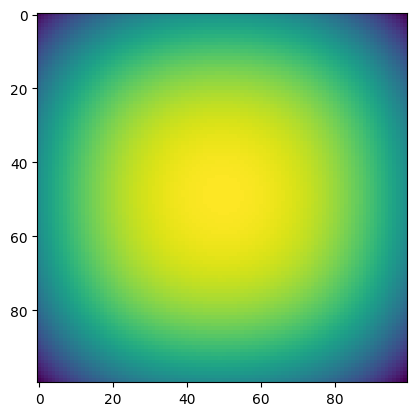

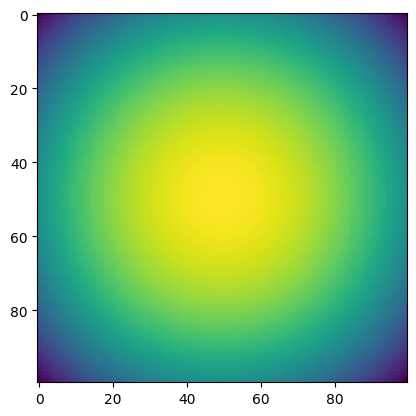

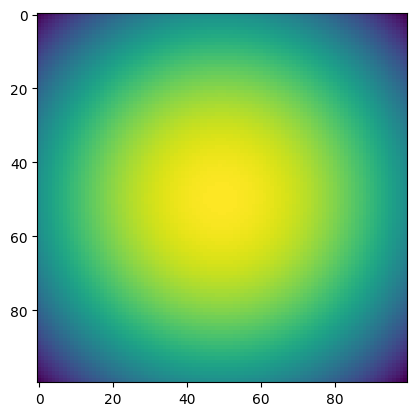

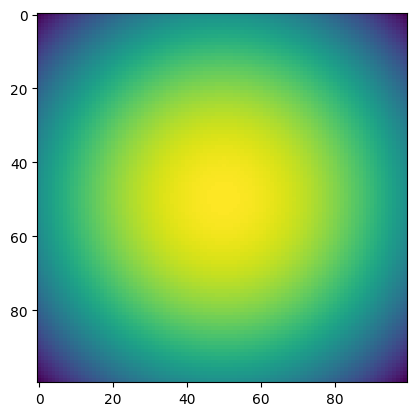

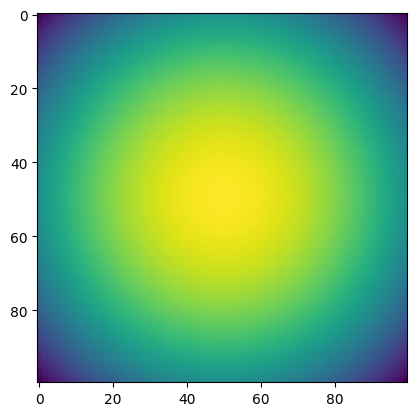

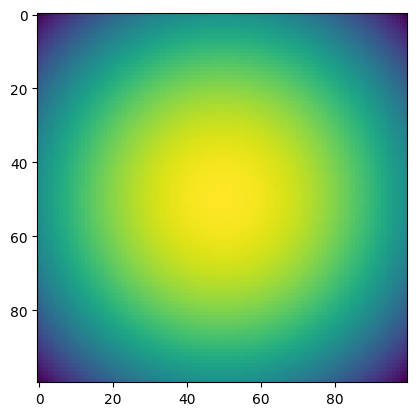

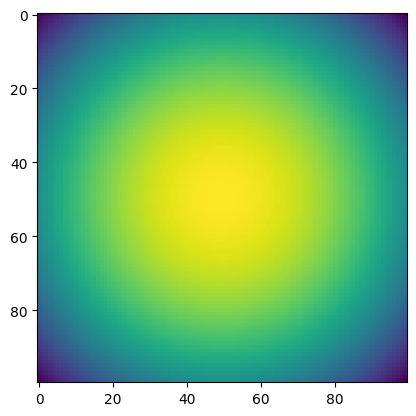

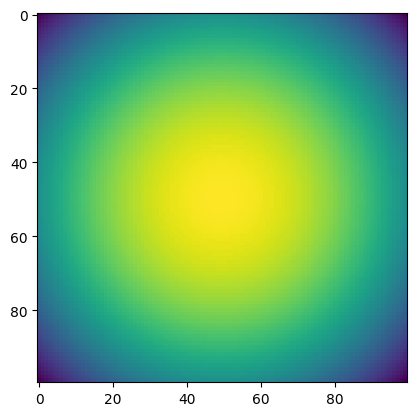

10100 0.27755803 time: 0.0008313655853271484
10200 0.27465722 time: 0.0008373260498046875
10300 0.25528443 time: 0.0008368492126464844
10400 0.26831195 time: 0.0008361339569091797
10500 0.26112342 time: 0.0008332729339599609
10600 0.27734542 time: 0.0008969306945800781
10700 0.27244624 time: 0.0008392333984375
10800 0.25611395 time: 0.0008370876312255859
10900 0.23479293 time: 0.0008420944213867188
11000 0.25226736 time: 0.0008509159088134766


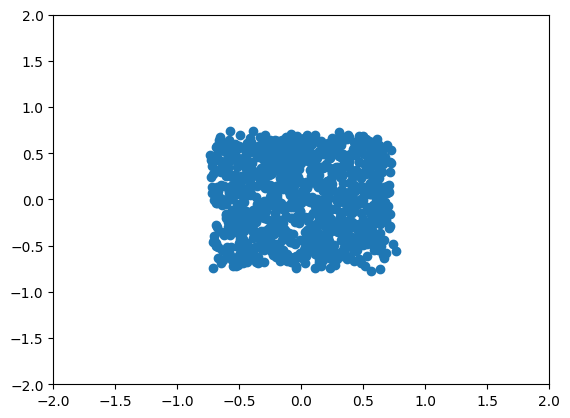

TEST 11000 logpx -0.5646994


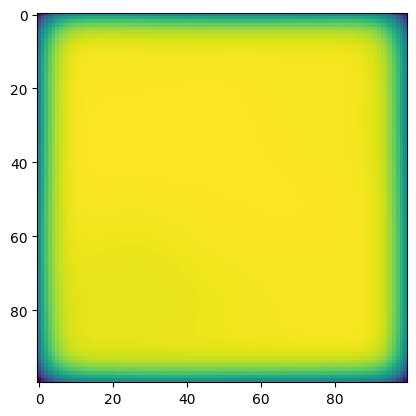

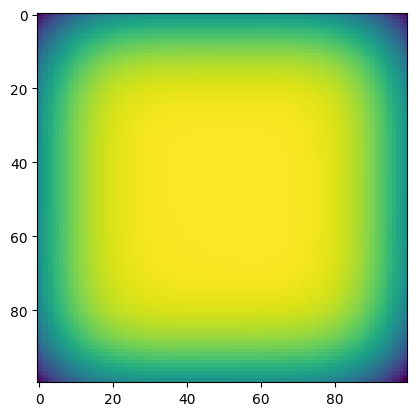

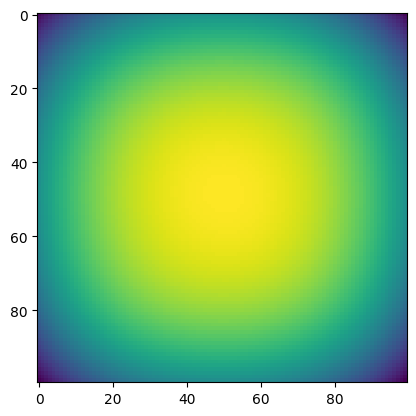

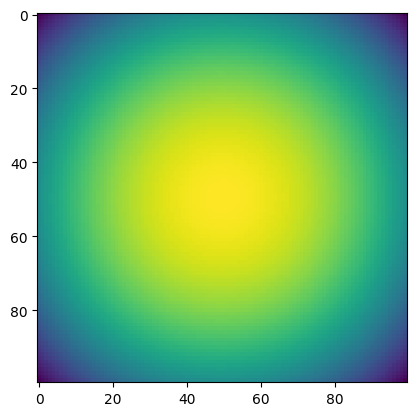

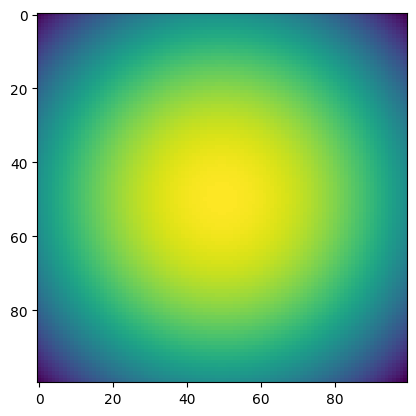

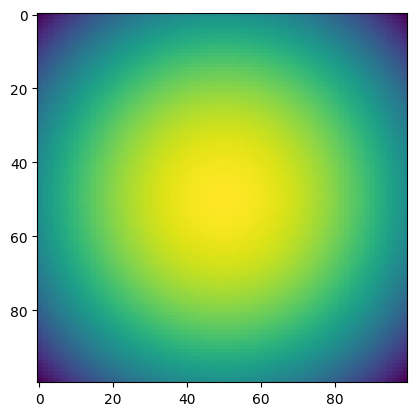

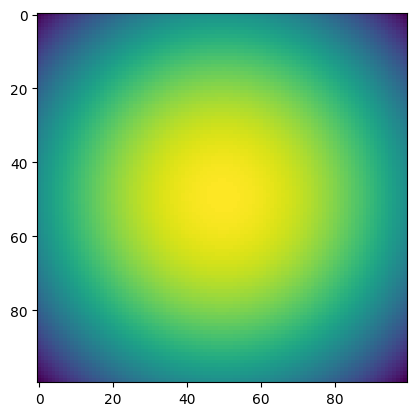

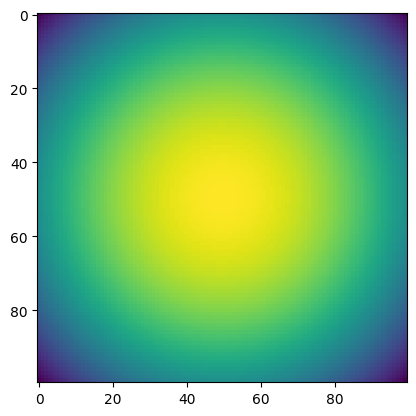

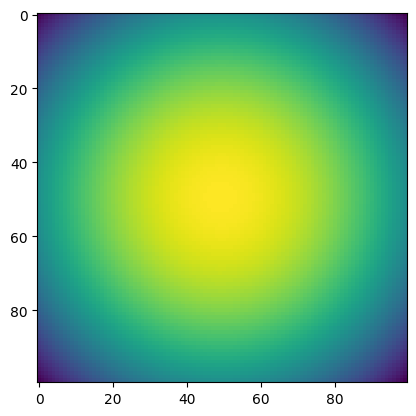

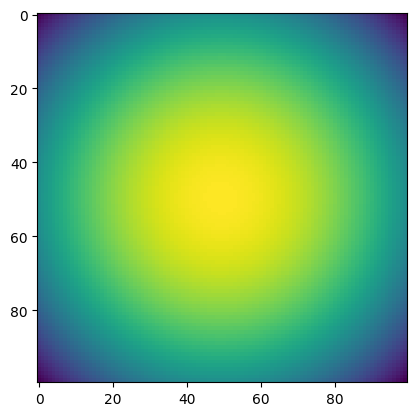

11100 0.23693596 time: 0.0008480548858642578
11200 0.27420494 time: 0.0008292198181152344
11300 0.2529334 time: 0.0008358955383300781
11400 0.24142888 time: 0.0008335113525390625
11500 0.27411678 time: 0.0008249282836914062
11600 0.23945664 time: 0.0008509159088134766
11700 0.26907262 time: 0.0008258819580078125
11800 0.28481302 time: 0.0008974075317382812
11900 0.26487732 time: 0.0008320808410644531
12000 0.25607428 time: 0.0008409023284912109


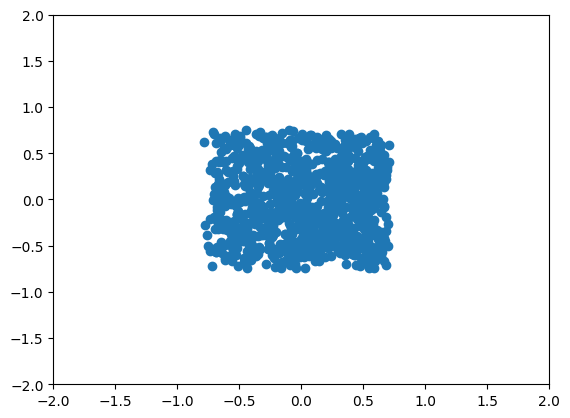

TEST 12000 logpx -0.54294336


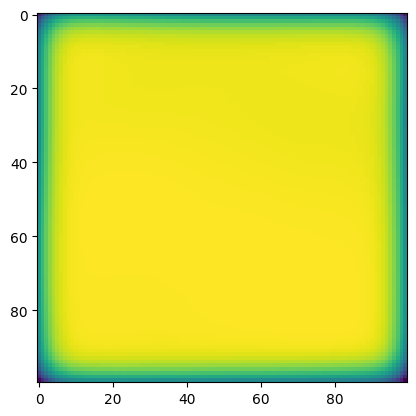

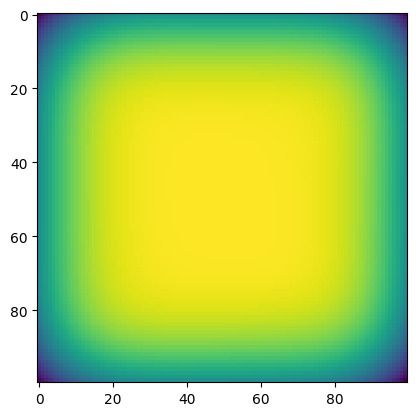

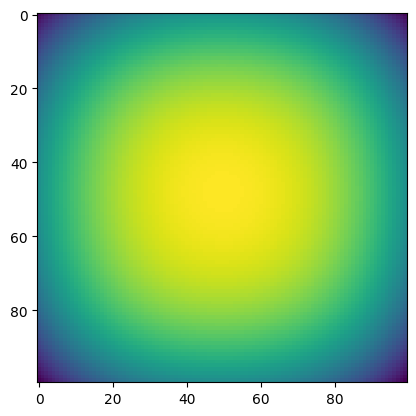

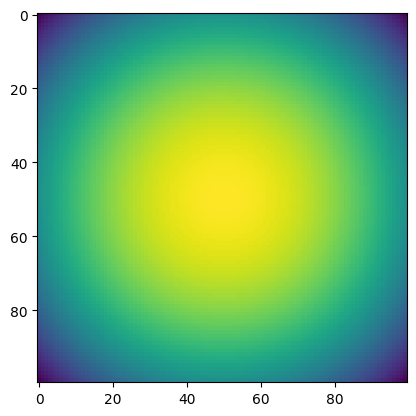

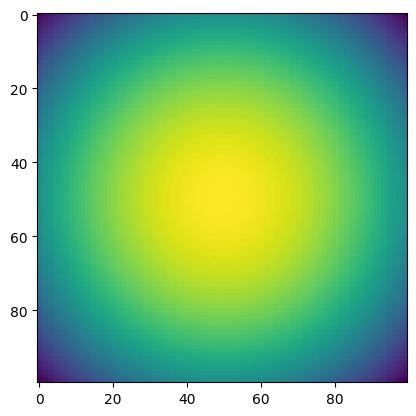

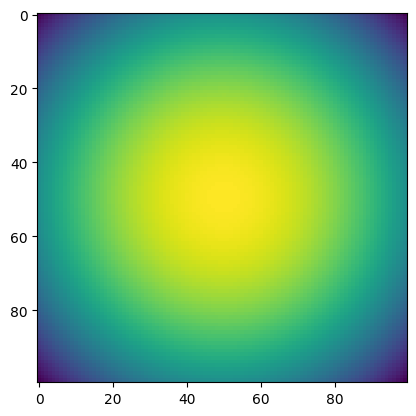

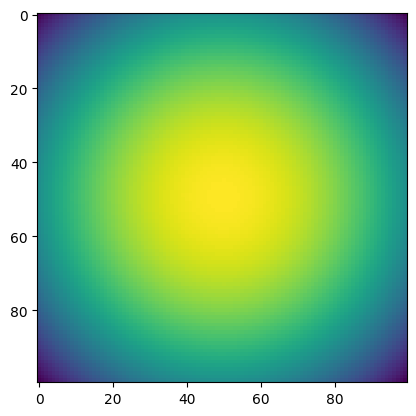

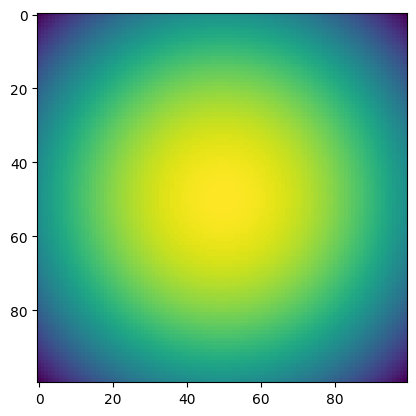

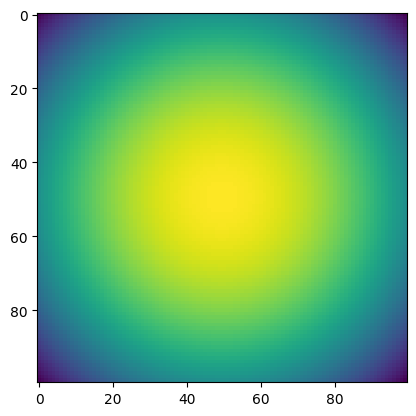

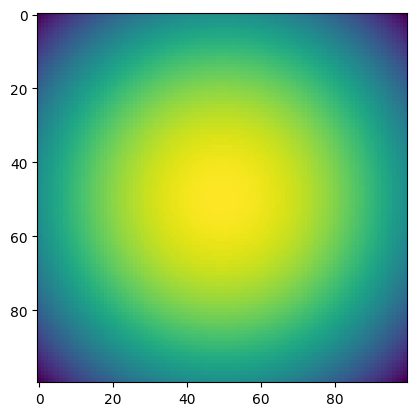

12100 0.2571505 time: 0.0008282661437988281
12200 0.2861468 time: 0.0008308887481689453
12300 0.2636289 time: 0.0008401870727539062
12400 0.2595876 time: 0.0008342266082763672
12500 0.2865473 time: 0.0008313655853271484
12600 0.26157123 time: 0.0008294582366943359
12700 0.28115755 time: 0.0008363723754882812
12800 0.25827184 time: 0.0008432865142822266
12900 0.284785 time: 0.0008332729339599609
13000 0.23685096 time: 0.000835418701171875


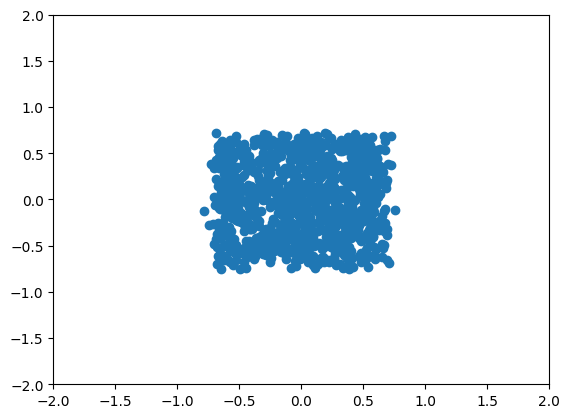

TEST 13000 logpx -0.5372658


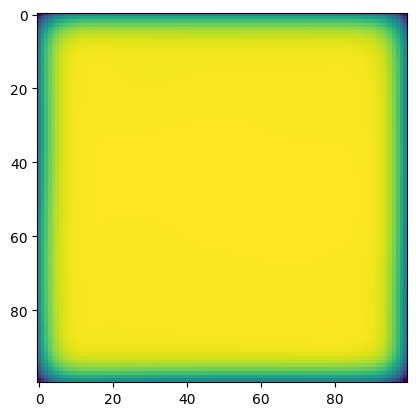

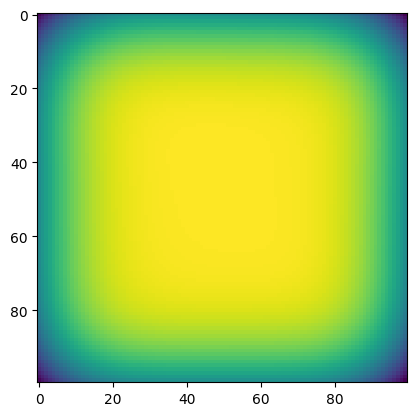

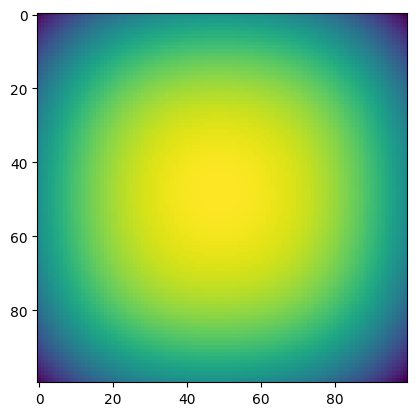

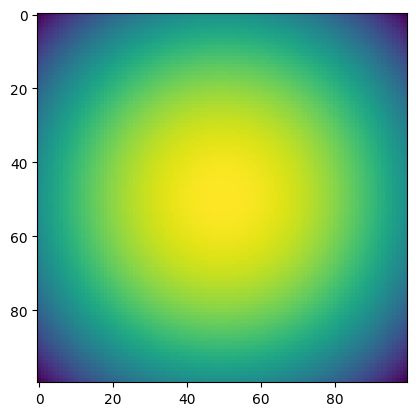

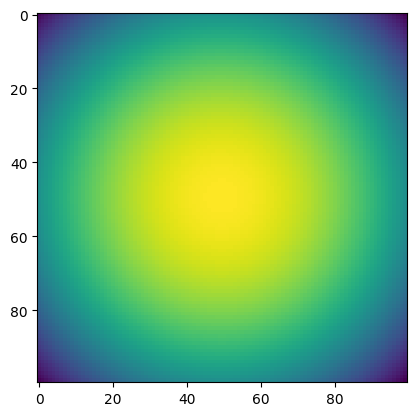

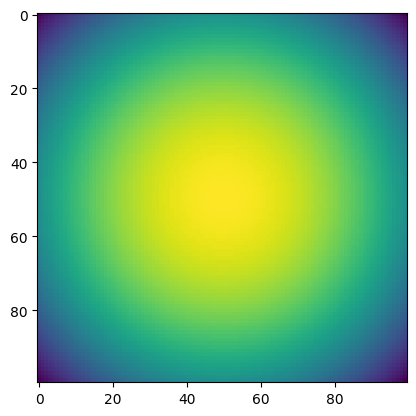

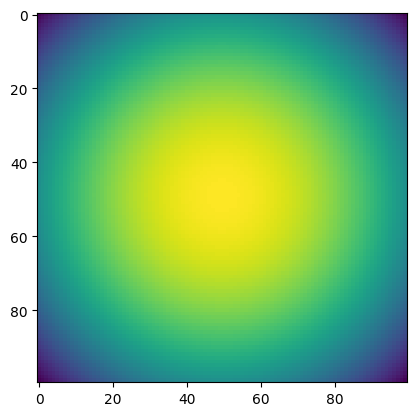

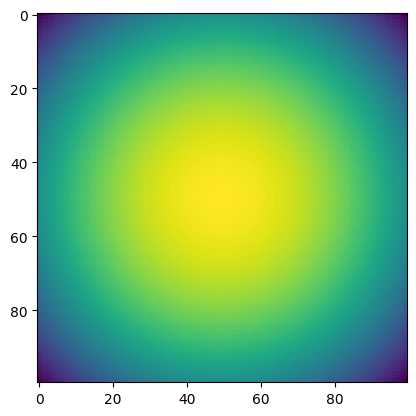

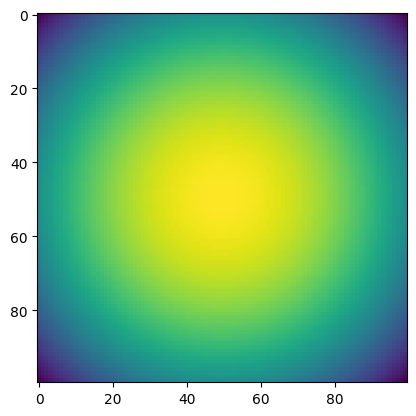

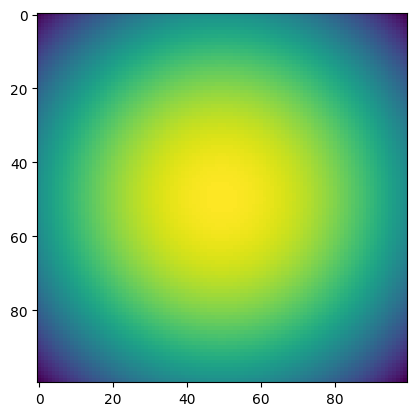

13100 0.28127196 time: 0.0008447170257568359
13200 0.22240263 time: 0.0008389949798583984
13300 0.27155024 time: 0.0008347034454345703
13400 0.28224537 time: 0.0008289813995361328
13500 0.28600135 time: 0.0008344650268554688
13600 0.28929177 time: 0.0013835430145263672
13700 0.23398809 time: 0.0008375644683837891
13800 0.25829083 time: 0.000843048095703125
13900 0.2512452 time: 0.0008378028869628906
14000 0.27965823 time: 0.0008287429809570312


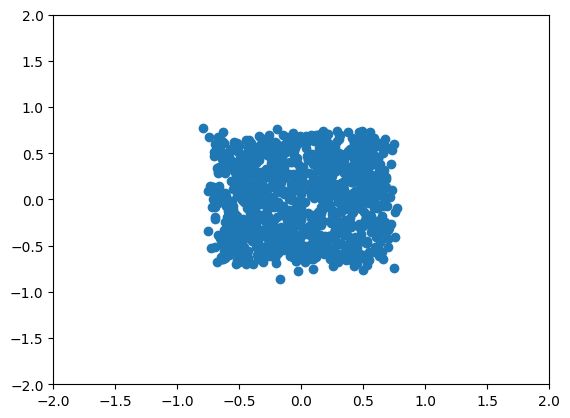

TEST 14000 logpx -0.59839946


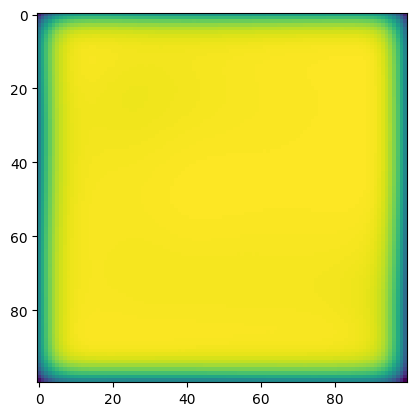

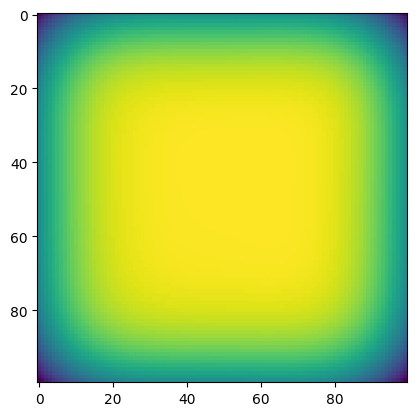

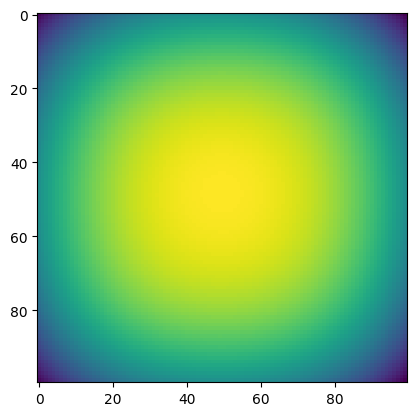

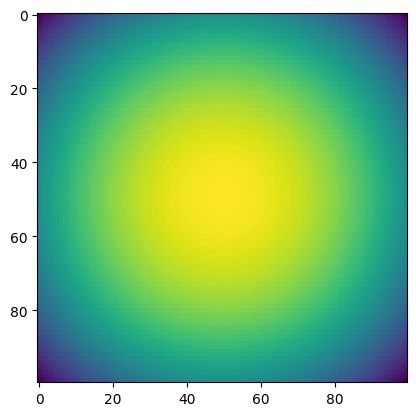

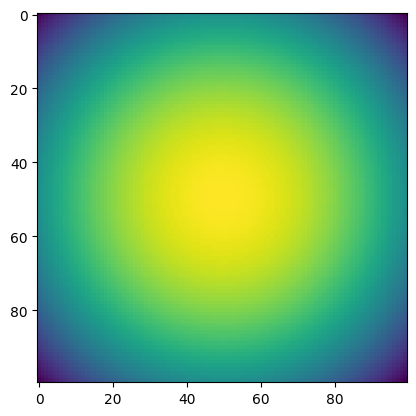

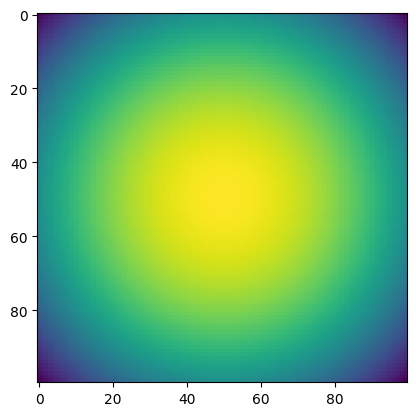

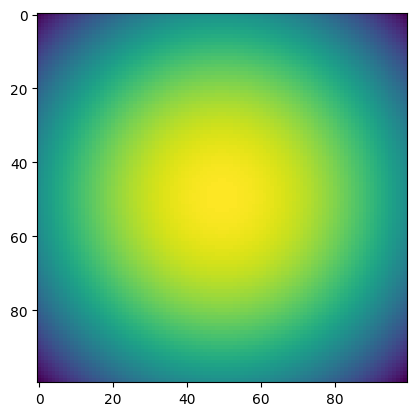

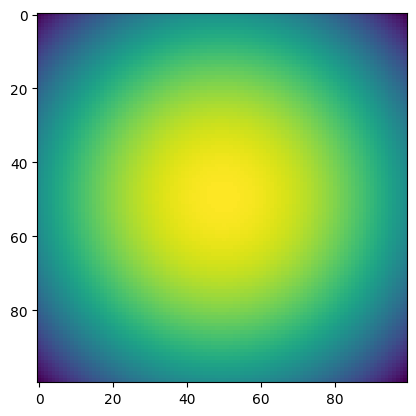

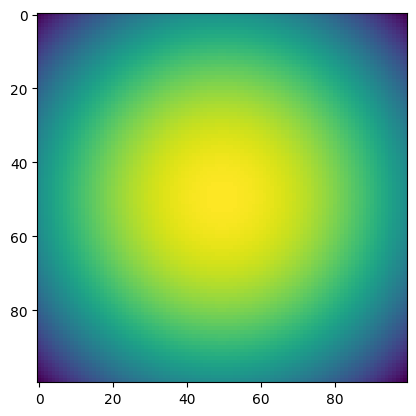

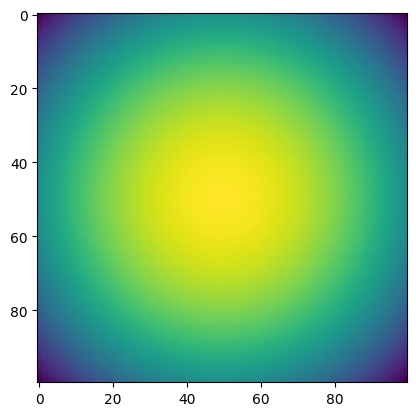

14100 0.25896496 time: 0.0008540153503417969
14200 0.29307032 time: 0.0008335113525390625
14300 0.2936276 time: 0.0008347034454345703
14400 0.25961983 time: 0.0008325576782226562
14500 0.25244159 time: 0.0008614063262939453
14600 0.28756508 time: 0.0008311271667480469
14700 0.2693967 time: 0.0008461475372314453
14800 0.273516 time: 0.0008435249328613281
14900 0.27491787 time: 0.0008351802825927734
15000 0.24746366 time: 0.0008485317230224609


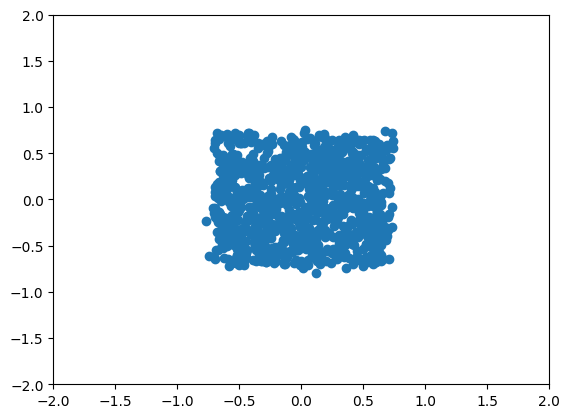

TEST 15000 logpx -0.5770205


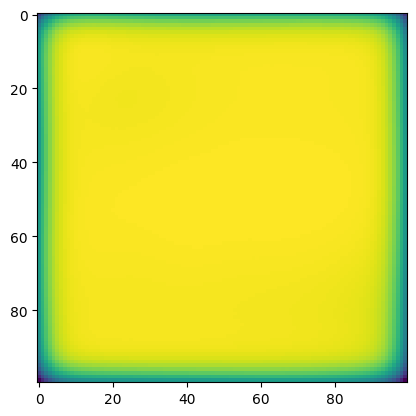

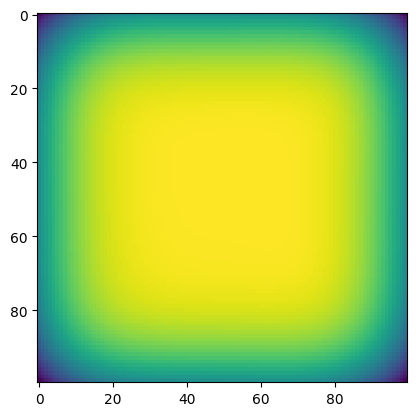

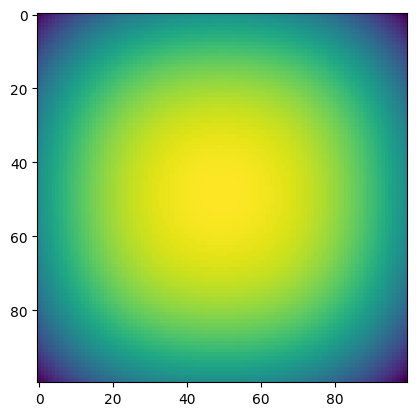

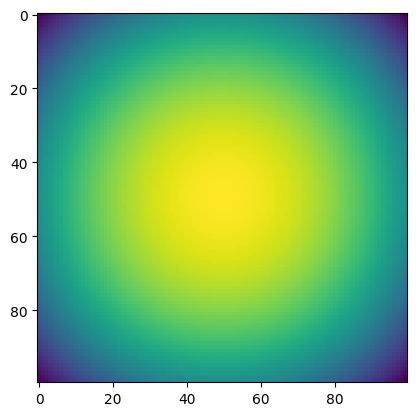

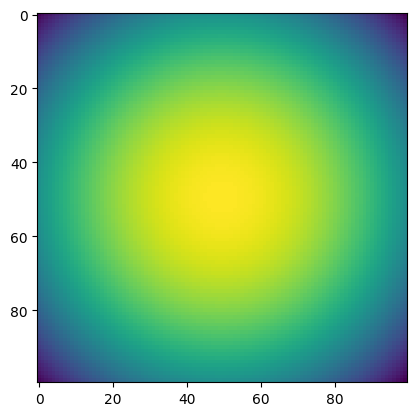

...

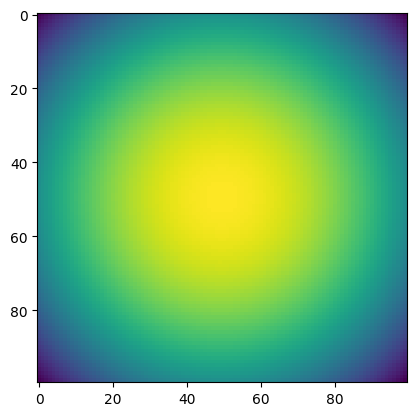

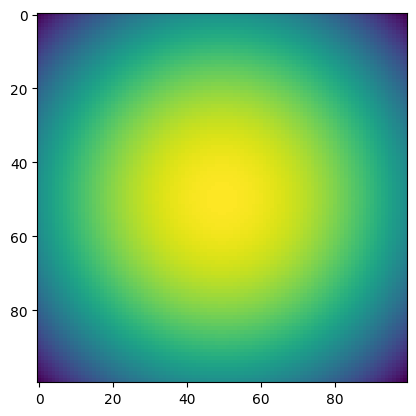

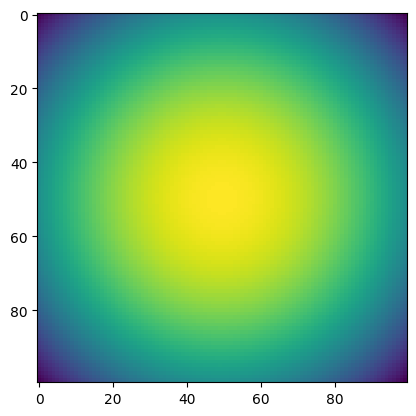

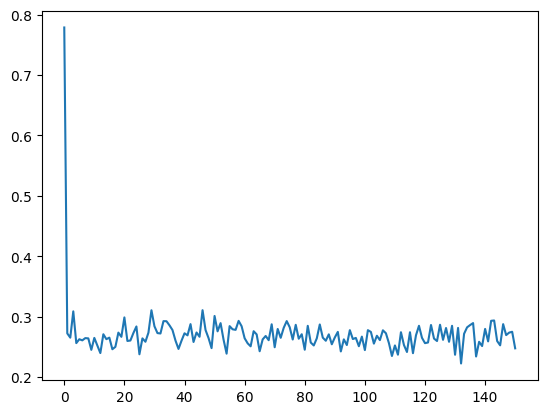

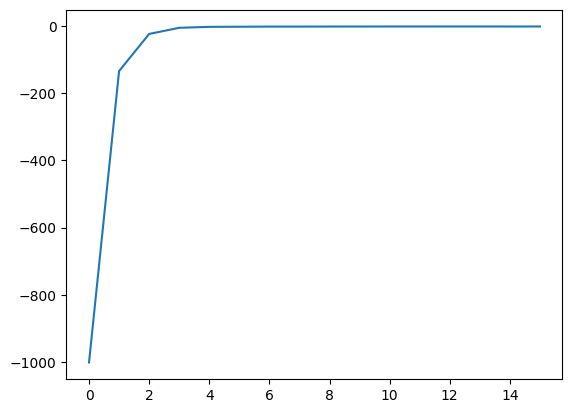

In [36]:
batch_size = 1000
data_dim = 2
num_steps = 15001

EMA = .999

n_steps = 100
net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = toy_box(scale=0.7)
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    if ebm:
      for t in range(10):
        dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
        plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

large_box_params = ema_params

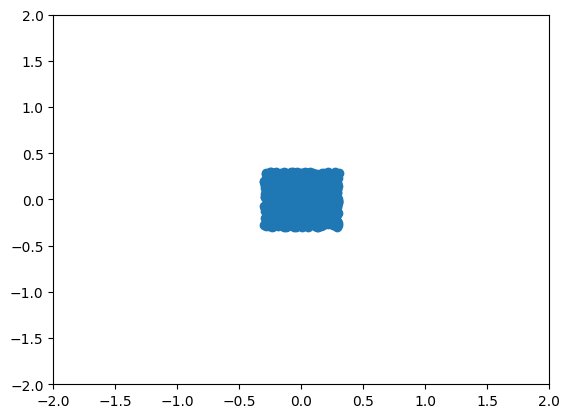

/tmp/ipykernel_1365333/1529429736.py:59: DeprecationWarning: jax.tree_leaves is deprecated: use jax.tree.leaves (jax v0.4.25 or newer) or jax.tree_util.tree_leaves (any JAX version).
  param_count = sum(x.size for x in jax.tree_leaves(params))
/tmp/ipykernel_1365333/1529429736.py:60: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  for k, v in jax.tree_map(lambda x: x.shape, params).items():


portable_diffusion_model {'out_logvar': (100,)}
resnet_diffusion_model/embed {'embeddings': (100, 32)}
resnet_diffusion_model/layer_norm {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_1 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_2 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/layer_norm_3 {'offset': (128,), 'scale': (128,)}
resnet_diffusion_model/linear {'b': (128,), 'w': (2, 128)}
resnet_diffusion_model/linear_1 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_10 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_11 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_12 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_13 {'b': (256,), 'w': (128, 256)}
resnet_diffusion_model/linear_14 {'b': (256,), 'w': (32, 256)}
resnet_diffusion_model/linear_15 {'b': (256,), 'w': (256, 256)}
resnet_diffusion_model/linear_16 {'b': (128,), 'w': (256, 128)}
resnet_diffusion_model/linear_17 {'b': (2,)

/tmp/ipykernel_1365333/1529429736.py:98: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)
/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


0 0.5295583 time: 1.8536858558654785


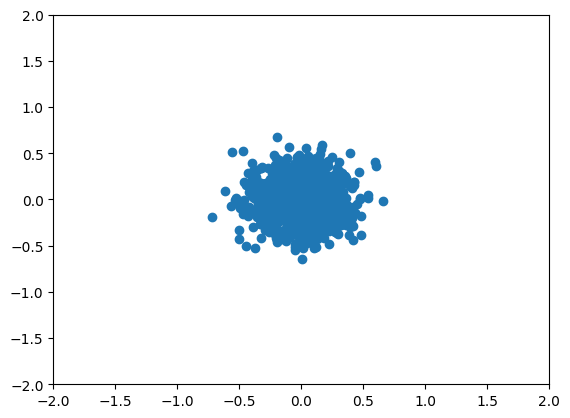

/tmp/ipykernel_1365333/1885335867.py:235: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((x_0.shape[0],), dtype=jnp.int64) * (self._n_steps - 1)


TEST 0 logpx -998.3422


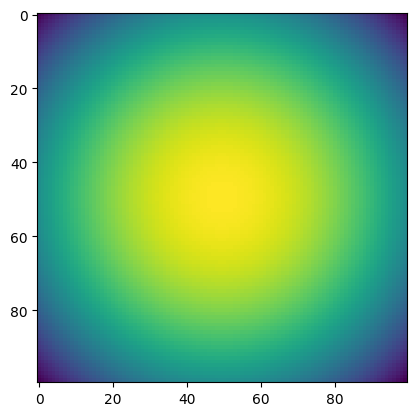

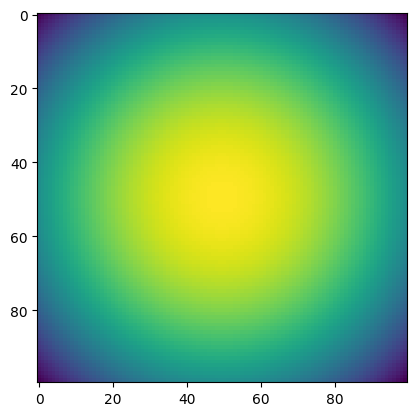

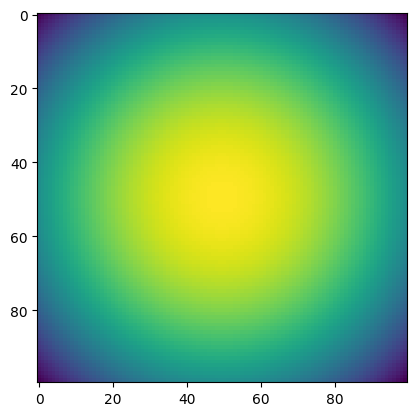

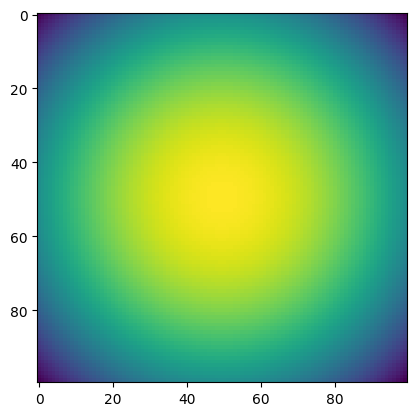

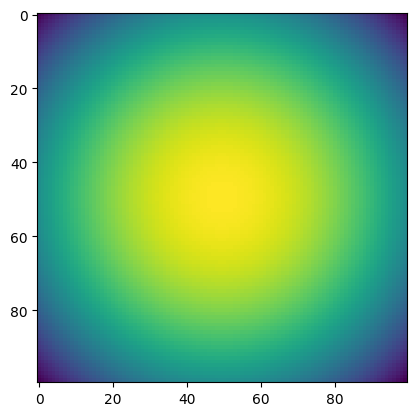

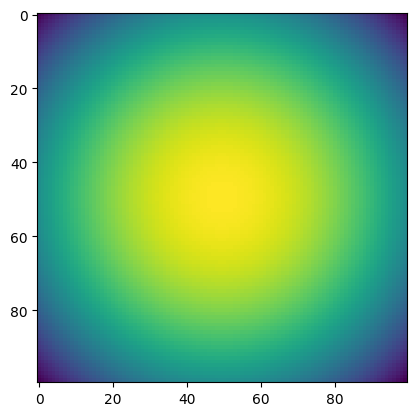

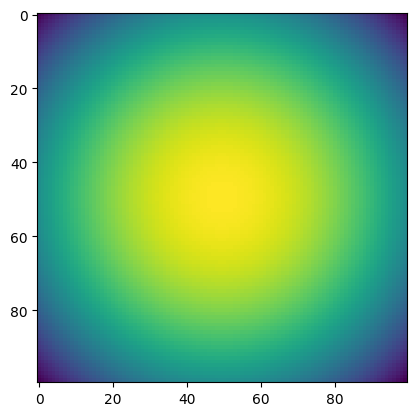

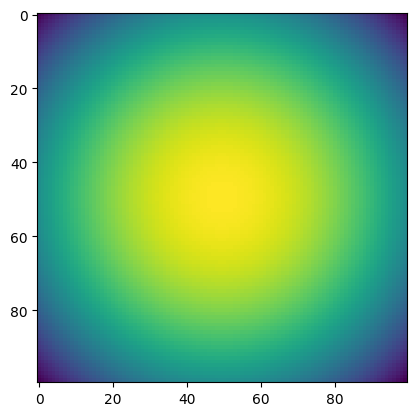

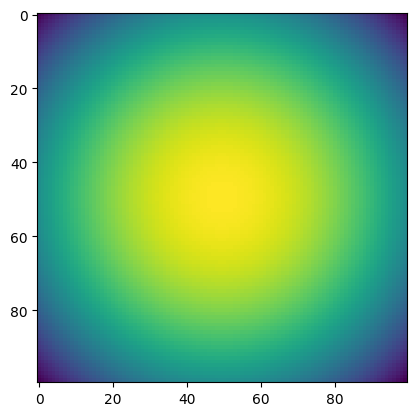

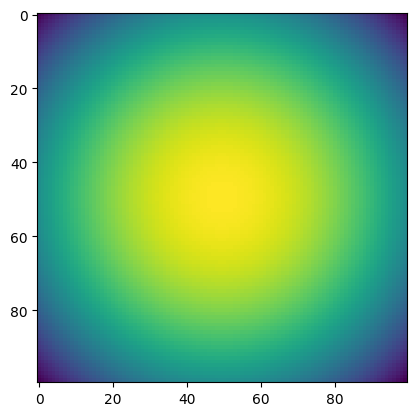

/tmp/ipykernel_1365333/1529429736.py:98: DeprecationWarning: jax.tree_map is deprecated: use jax.tree.map (jax v0.4.25 or newer) or jax.tree_util.tree_map (any JAX version).
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)


100 0.13068742 time: 0.0008397102355957031


200 0.12801428 time: 0.00084686279296875
300 0.16850545 time: 0.0008549690246582031
400 0.12983757 time: 0.0008409023284912109
500 0.1246714 time: 0.00084686279296875
600 0.13966666 time: 0.0008399486541748047
700 0.1381885 time: 0.0008363723754882812
800 0.12699072 time: 0.0008487701416015625
900 0.125975 time: 0.0008478164672851562
1000 0.12308646 time: 0.0008502006530761719


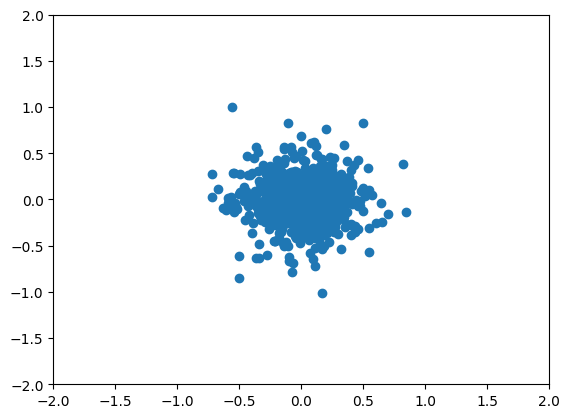

TEST 1000 logpx -153.85016


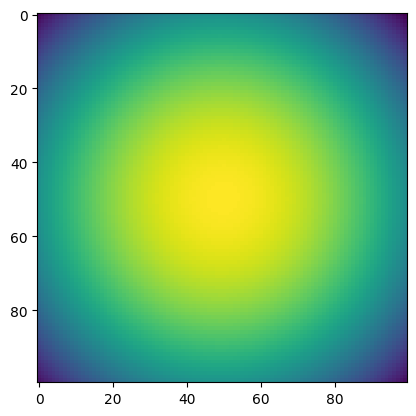

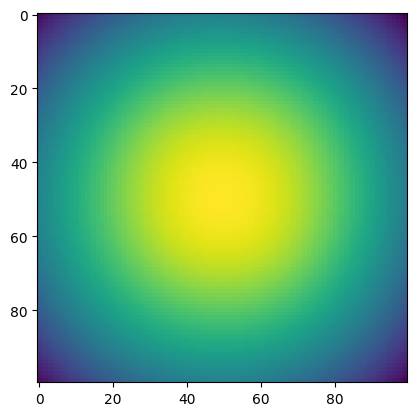

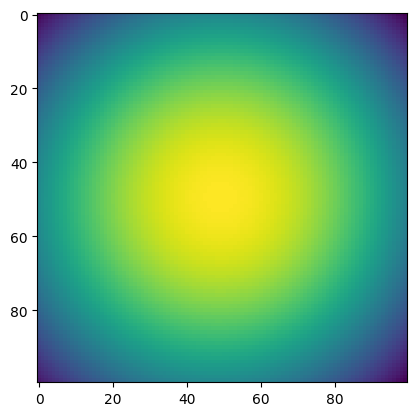

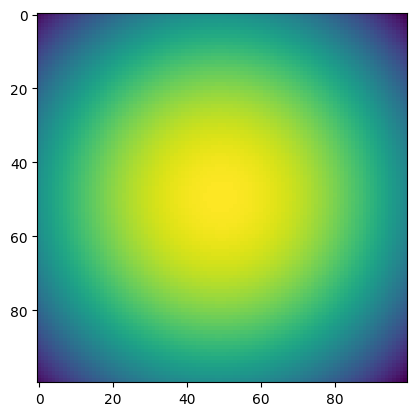

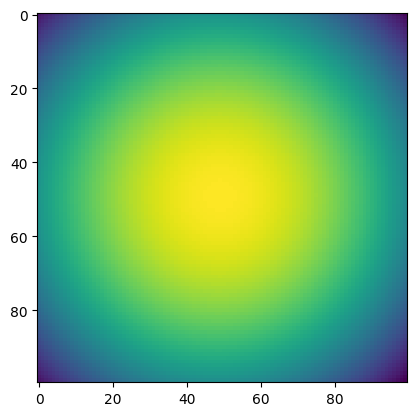

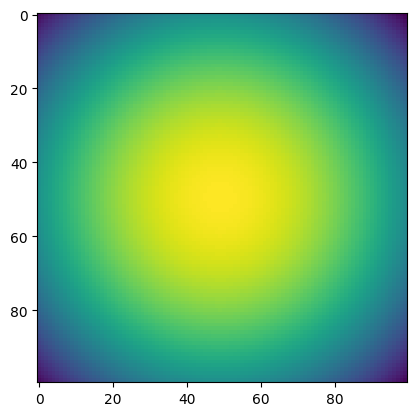

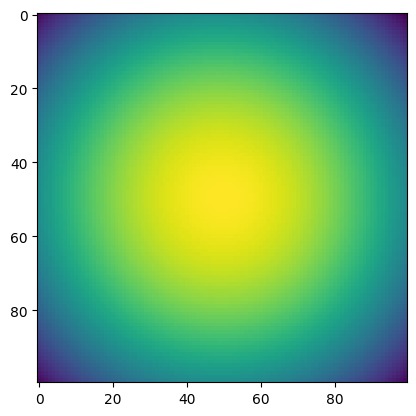

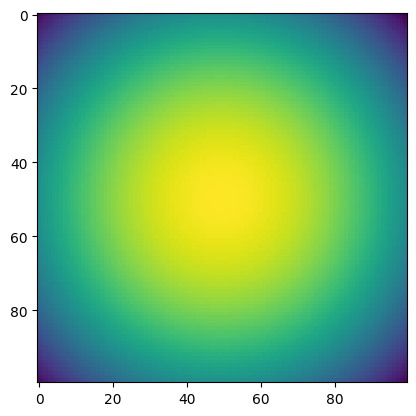

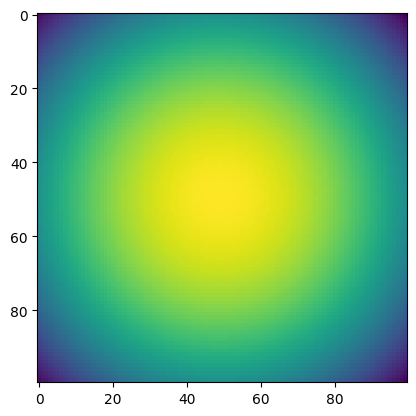

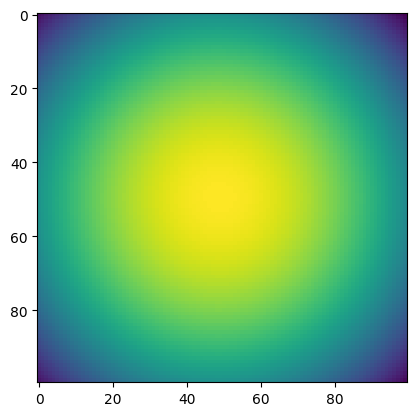

1100 0.12945345 time: 0.0008413791656494141
1200 0.12593642 time: 0.0008375644683837891
1300 0.1376866 time: 0.0008325576782226562
1400 0.13177824 time: 0.0008373260498046875
1500 0.1139941 time: 0.0008566379547119141
1600 0.12808736 time: 0.0008425712585449219
1700 0.12830836 time: 0.0008387565612792969
1800 0.1308318 time: 0.0008397102355957031
1900 0.13380405 time: 0.0008425712585449219
2000 0.14797008 time: 0.0008416175842285156


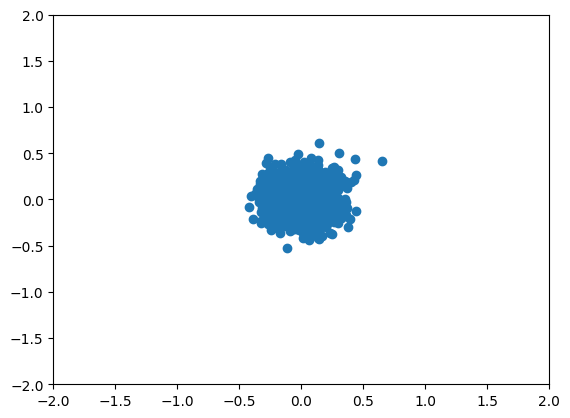

TEST 2000 logpx -24.244917


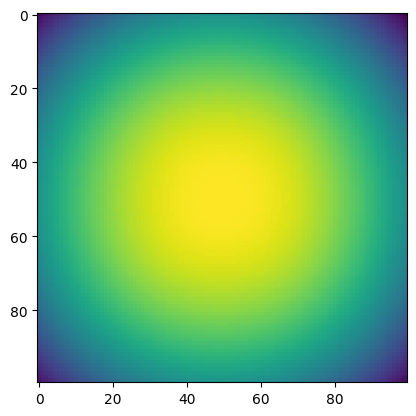

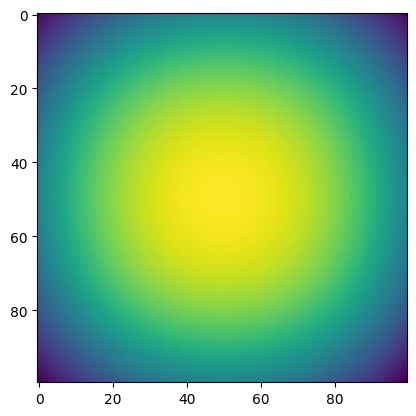

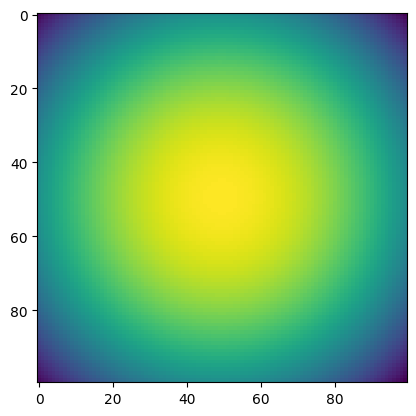

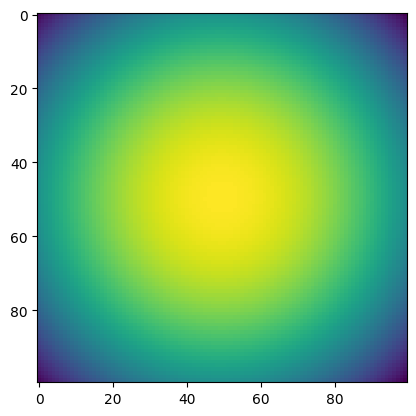

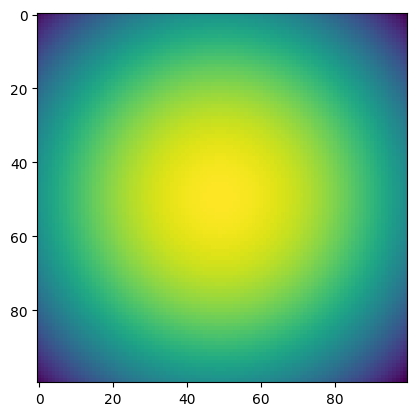

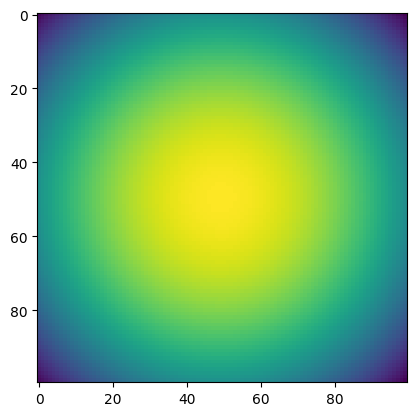

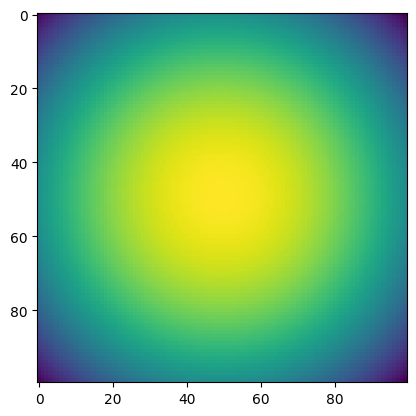

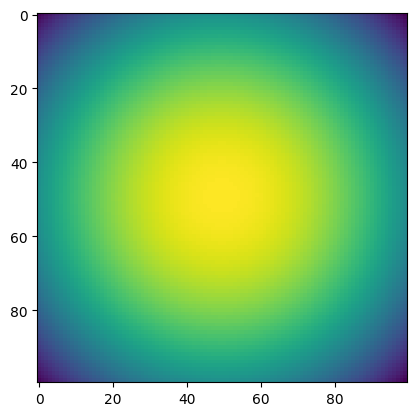

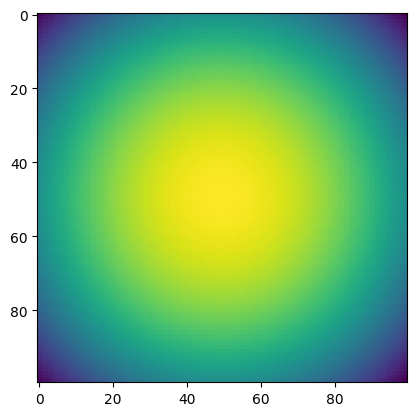

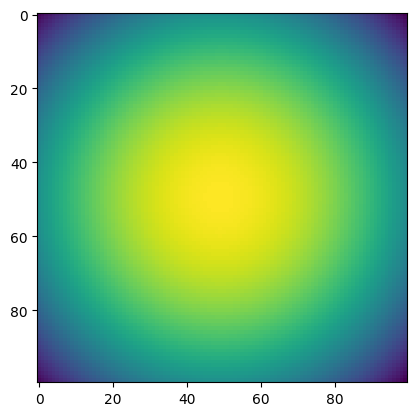

2100 0.12879498 time: 0.0008339881896972656
2200 0.12390058 time: 0.0008447170257568359
2300 0.13524905 time: 0.0008440017700195312
2400 0.1270969 time: 0.0008394718170166016
2500 0.11501211 time: 0.0008358955383300781
2600 0.13268012 time: 0.0008368492126464844
2700 0.13864167 time: 0.0008530616760253906
2800 0.12892343 time: 0.0008478164672851562
2900 0.16393049 time: 0.0008432865142822266
3000 0.1283189 time: 0.0008397102355957031


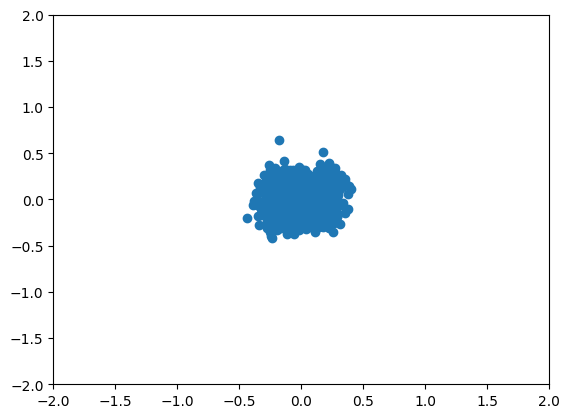

TEST 3000 logpx -2.281552


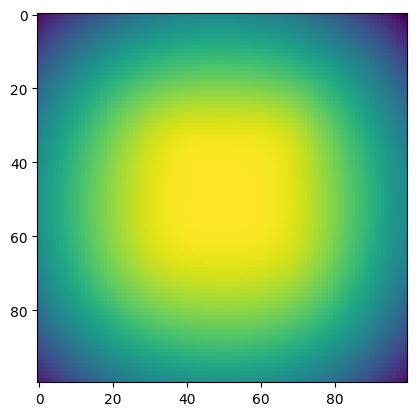

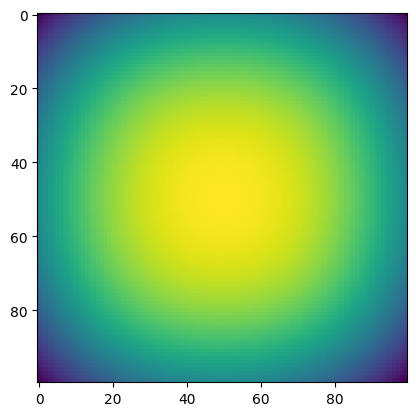

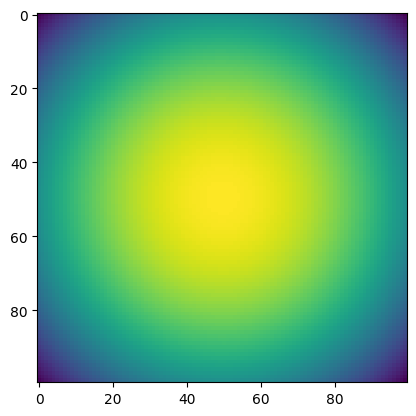

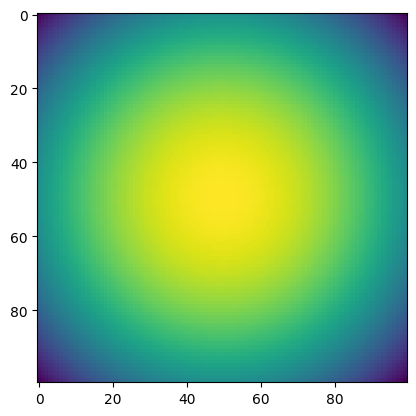

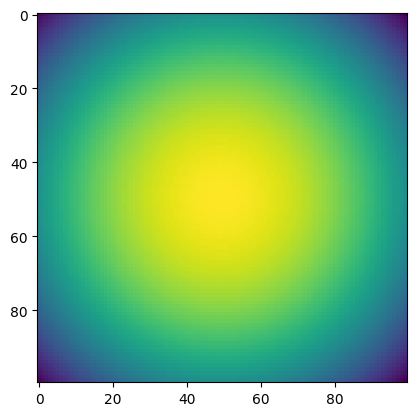

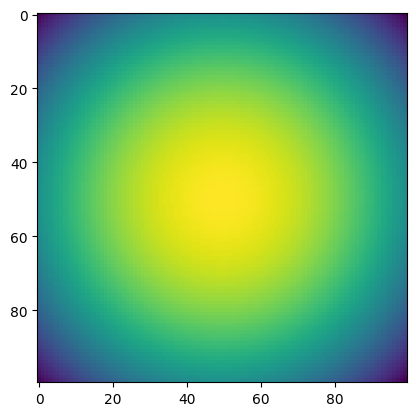

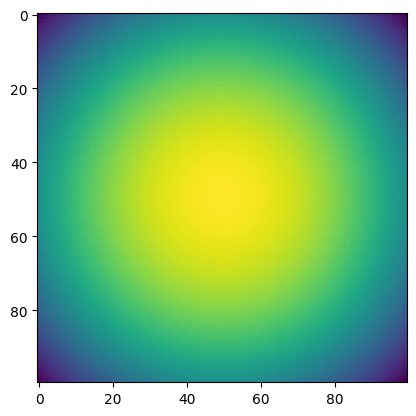

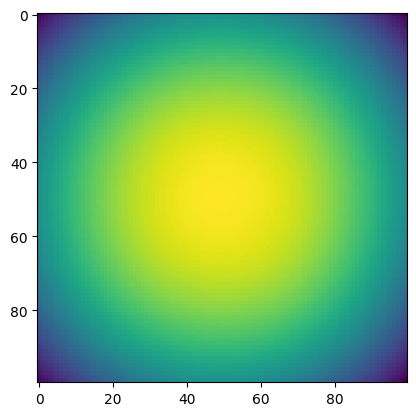

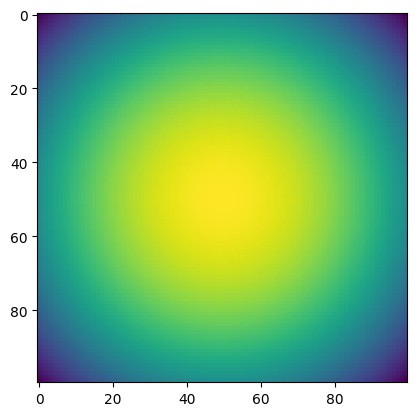

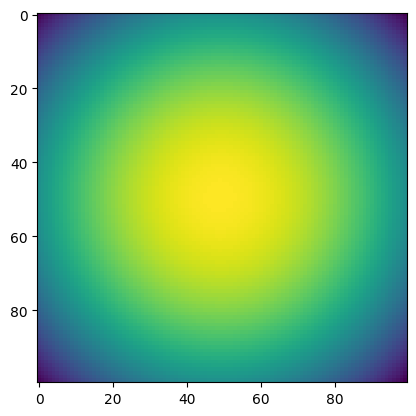

3100 0.14295673 time: 0.0008378028869628906
3200 0.14853093 time: 0.0008409023284912109
3300 0.13404001 time: 0.0008428096771240234
3400 0.13944408 time: 0.0008463859558105469
3500 0.1239497 time: 0.0008456707000732422
3600 0.14927396 time: 0.0008730888366699219
3700 0.12822889 time: 0.0008385181427001953
3800 0.13497984 time: 0.0008428096771240234
3900 0.13696429 time: 0.0008401870727539062
4000 0.14363919 time: 0.0008382797241210938


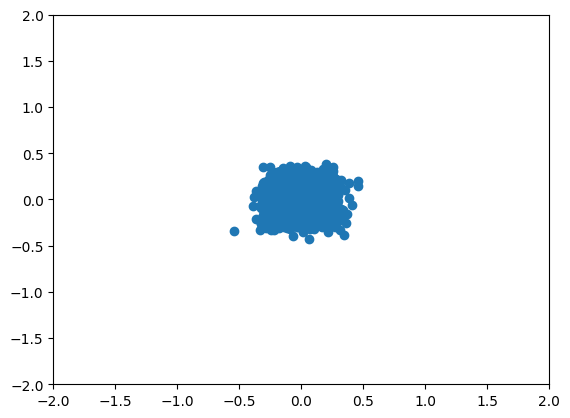

TEST 4000 logpx 0.51318794


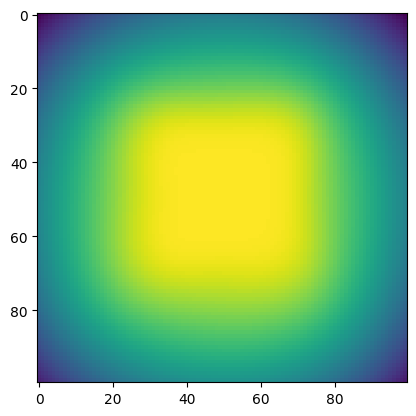

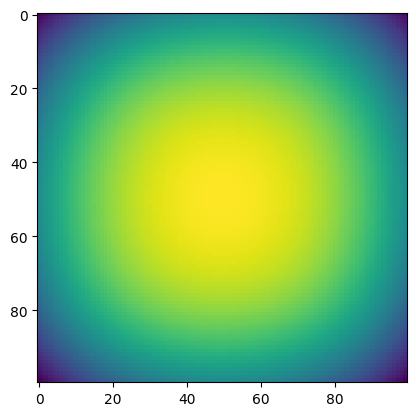

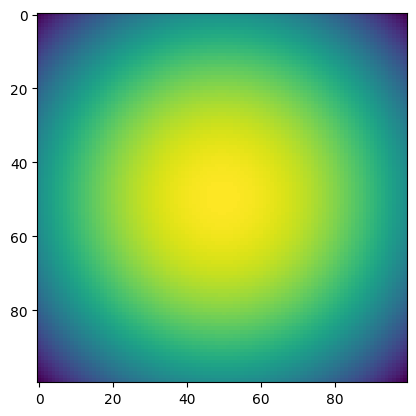

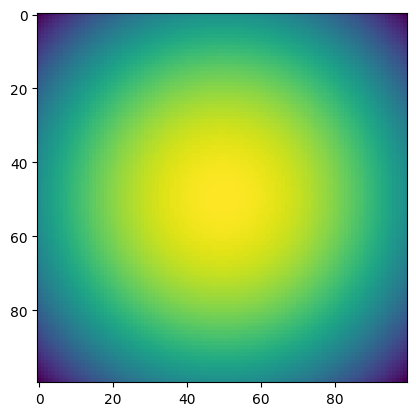

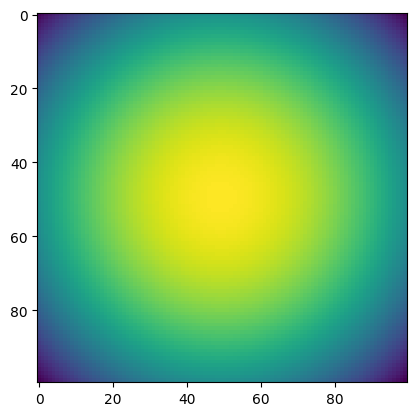

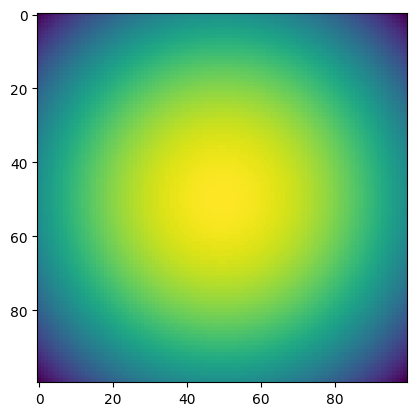

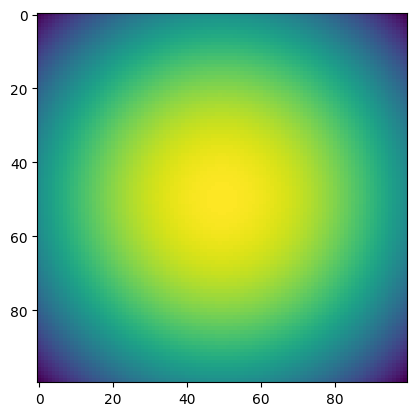

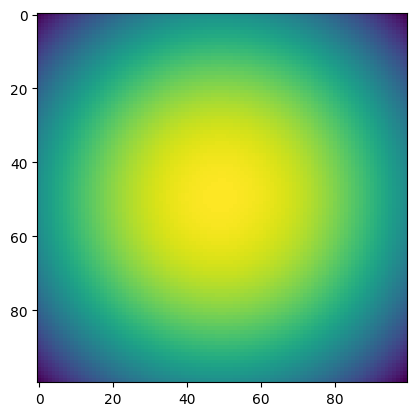

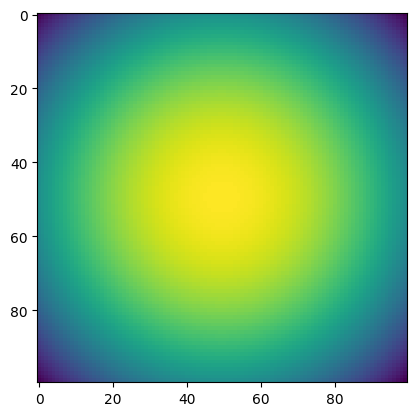

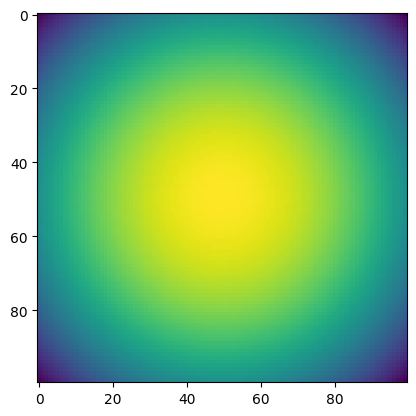

4100 0.13564357 time: 0.0008494853973388672
4200 0.15037885 time: 0.0008463859558105469
4300 0.12841618 time: 0.00084686279296875
4400 0.13635592 time: 0.0008451938629150391
4500 0.13948874 time: 0.0008461475372314453
4600 0.1527131 time: 0.0008459091186523438
4700 0.14791282 time: 0.0008409023284912109
4800 0.109303676 time: 0.0008614063262939453
4900 0.11460256 time: 0.0008606910705566406
5000 0.15082121 time: 0.0008475780487060547


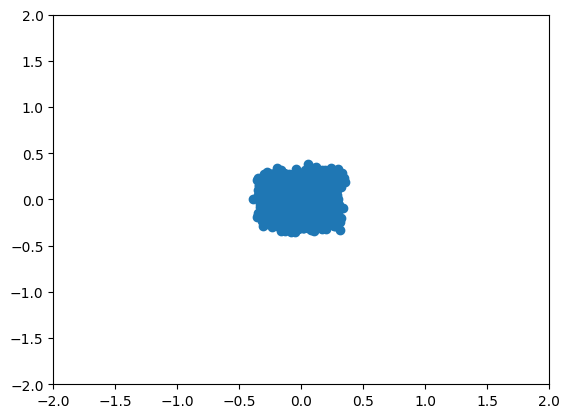

TEST 5000 logpx 0.8219808


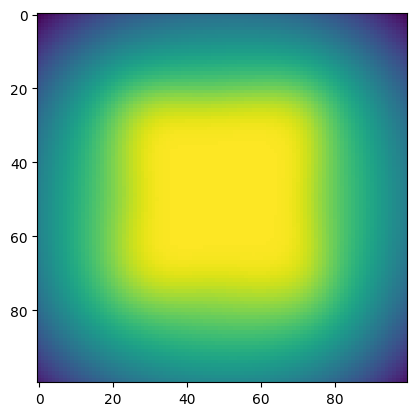

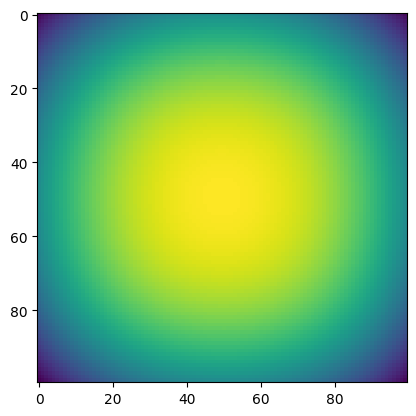

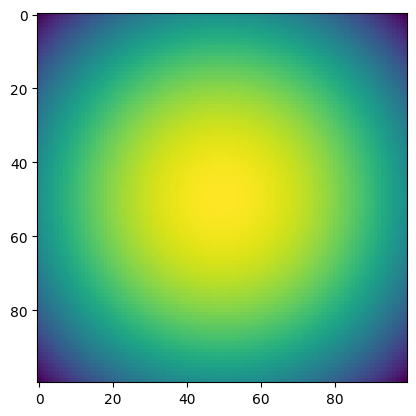

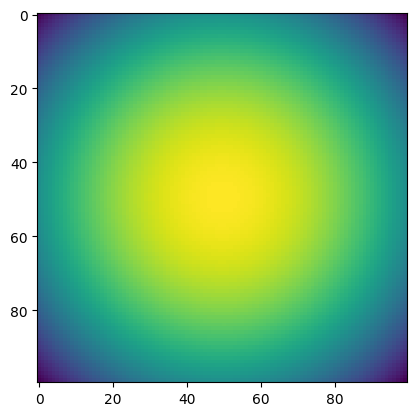

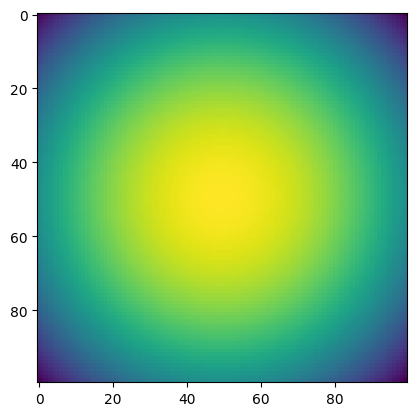

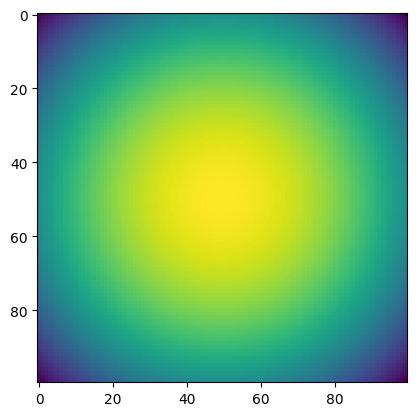

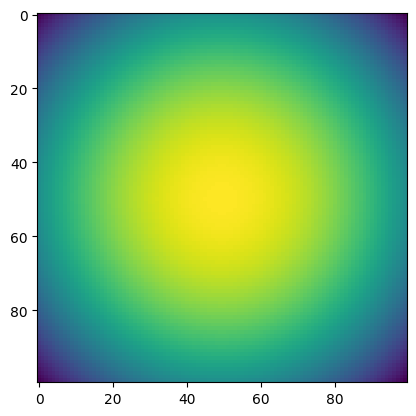

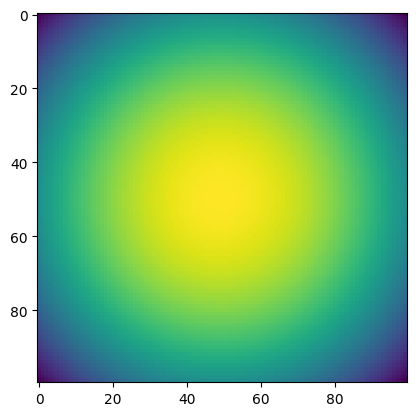

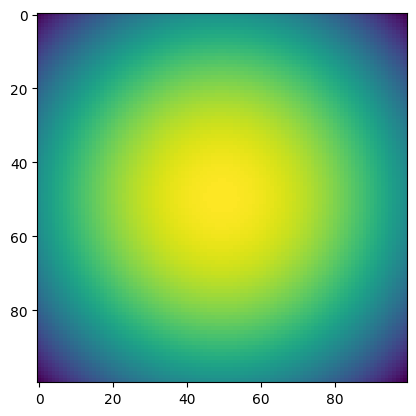

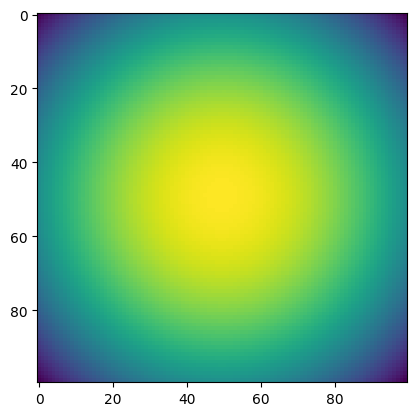

5100 0.12284818 time: 0.0008442401885986328
5200 0.14226739 time: 0.0008707046508789062
5300 0.13457571 time: 0.0008525848388671875
5400 0.12023046 time: 0.0008521080017089844
5500 0.13509005 time: 0.0008478164672851562
5600 0.12975878 time: 0.0008425712585449219
5700 0.1425135 time: 0.0008487701416015625
5800 0.14257497 time: 0.0008442401885986328
5900 0.13729963 time: 0.0008513927459716797
6000 0.12545256 time: 0.0008451938629150391


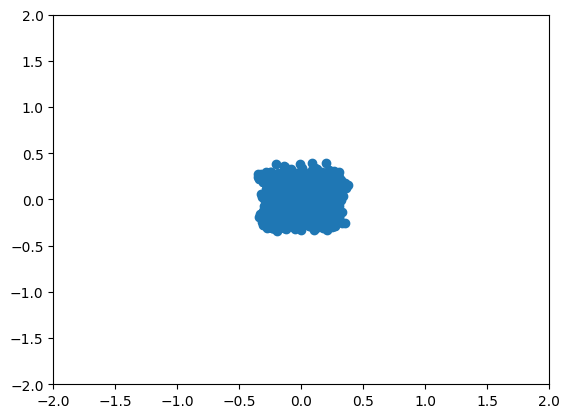

TEST 6000 logpx 1.0207778


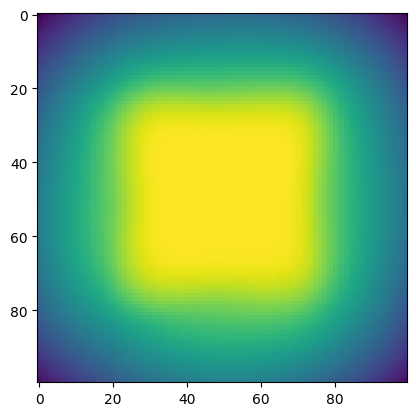

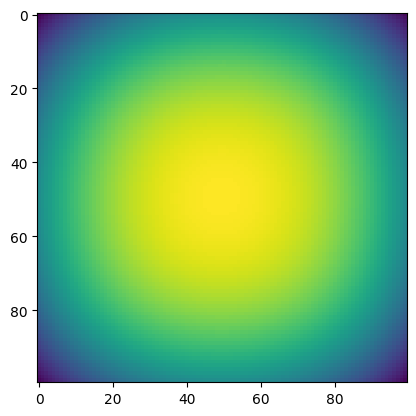

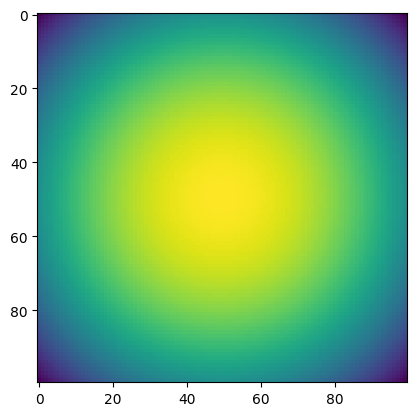

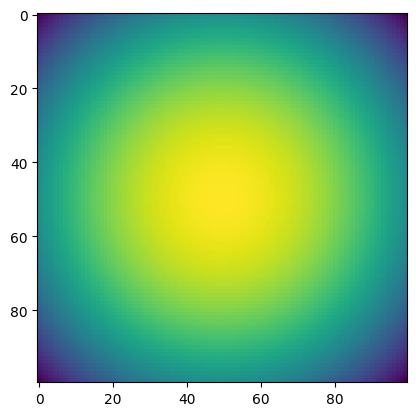

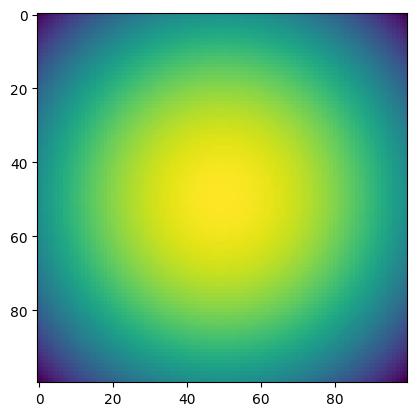

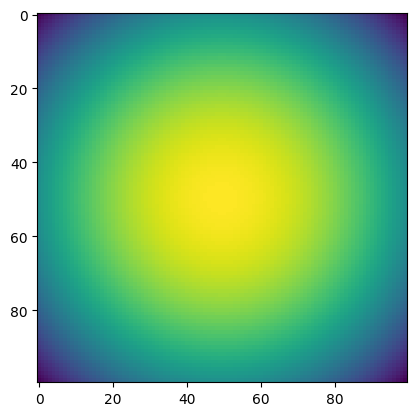

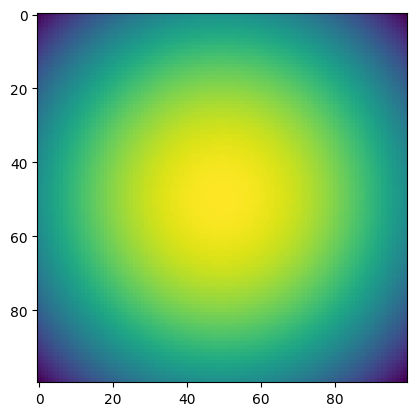

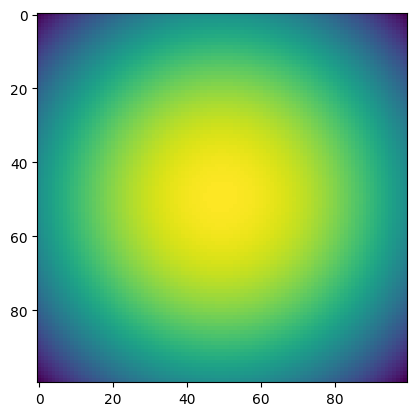

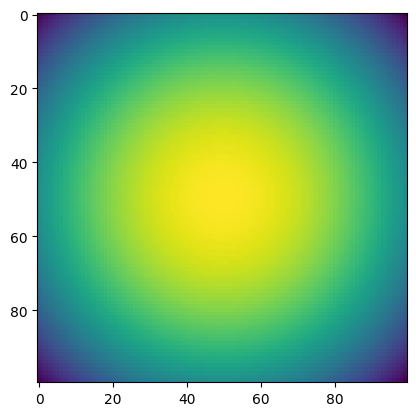

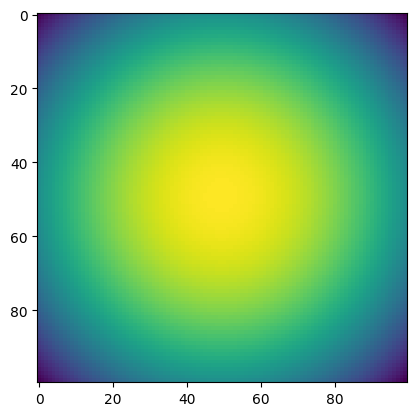

6100 0.12159776 time: 0.0008440017700195312
6200 0.13125397 time: 0.0008375644683837891
6300 0.13113496 time: 0.0008432865142822266
6400 0.1274048 time: 0.0008535385131835938
6500 0.116426155 time: 0.0008361339569091797
6600 0.123101994 time: 0.0008587837219238281
6700 0.12648612 time: 0.0008425712585449219
6800 0.12040024 time: 0.0008387565612792969
6900 0.13225608 time: 0.0008504390716552734
7000 0.15013652 time: 0.0008561611175537109


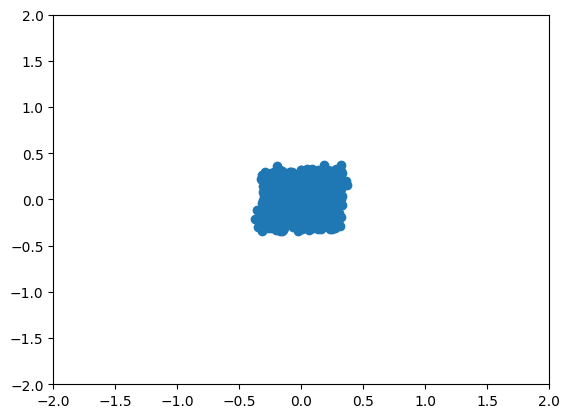

TEST 7000 logpx 0.95111114


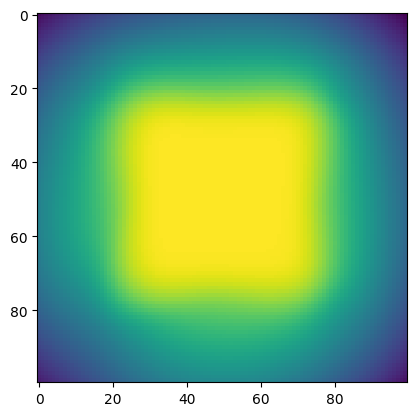

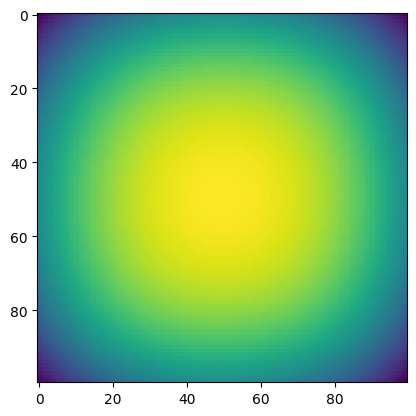

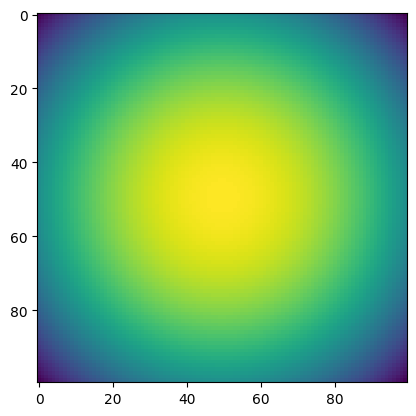

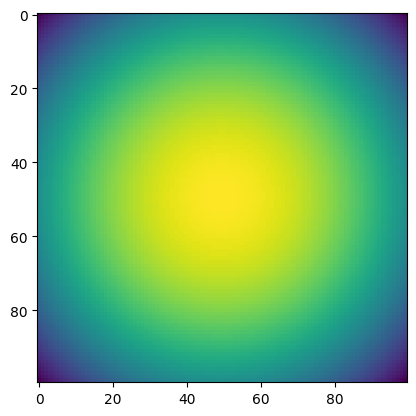

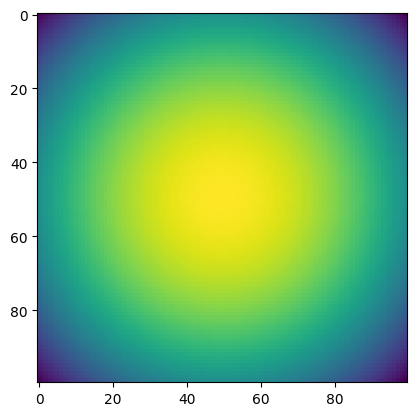

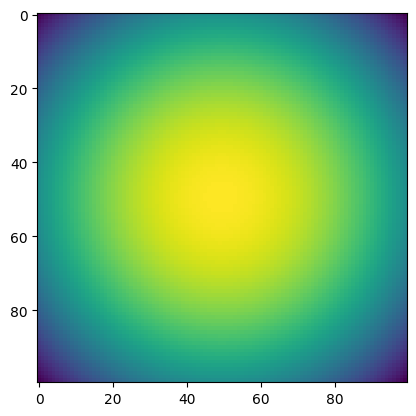

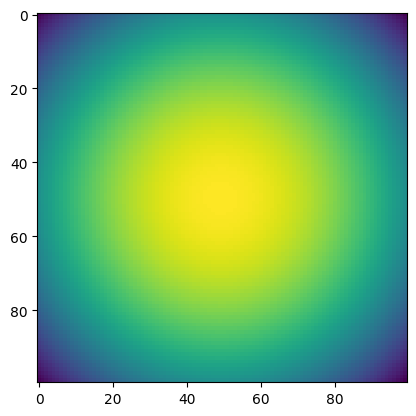

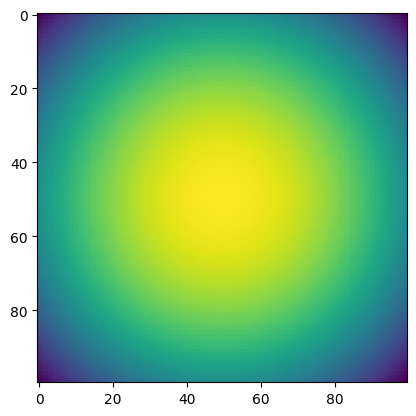

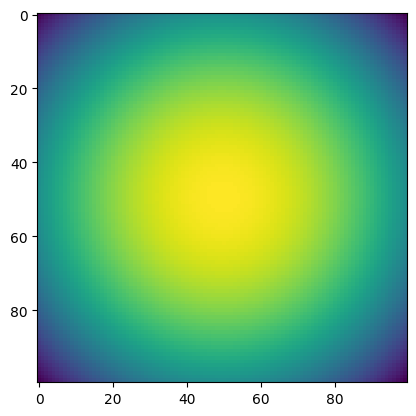

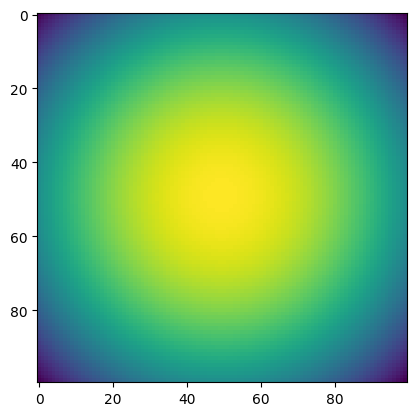

7100 0.13391148 time: 0.0008394718170166016
7200 0.13831942 time: 0.0008461475372314453
7300 0.13122046 time: 0.0008440017700195312
7400 0.1377667 time: 0.000850677490234375
7500 0.121793695 time: 0.0008456707000732422
7600 0.13364962 time: 0.0008759498596191406
7700 0.14043917 time: 0.0008342266082763672
7800 0.12800318 time: 0.0008397102355957031
7900 0.12954062 time: 0.0008411407470703125
8000 0.12515552 time: 0.0008792877197265625


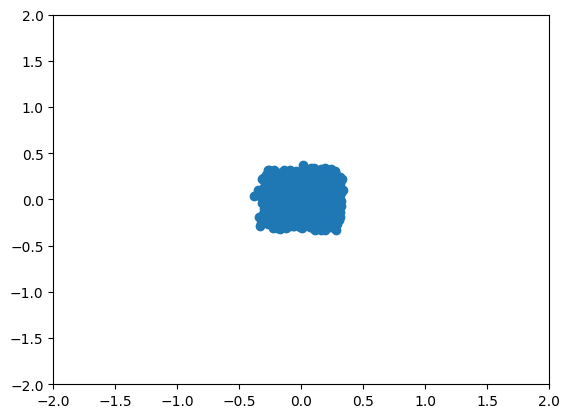

TEST 8000 logpx 0.9931081


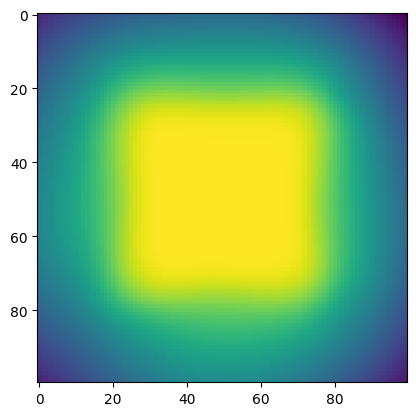

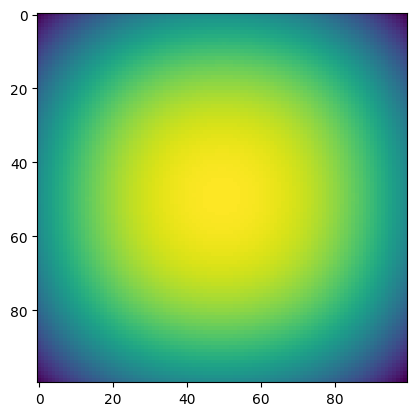

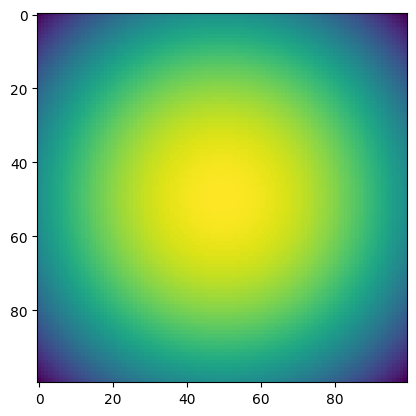

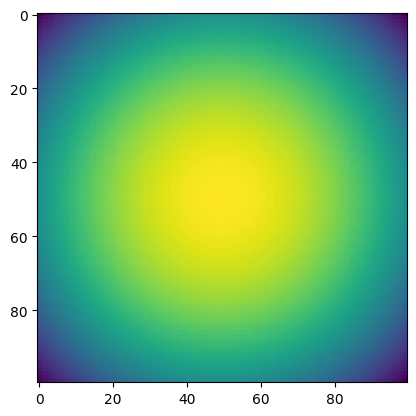

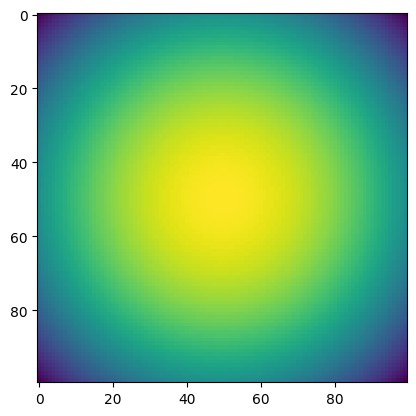

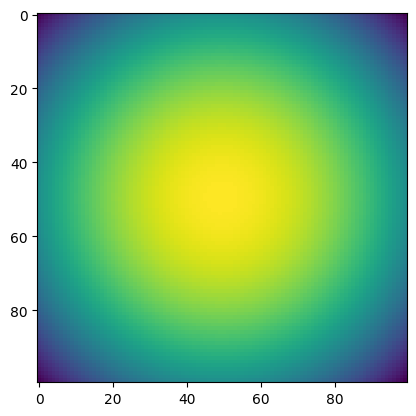

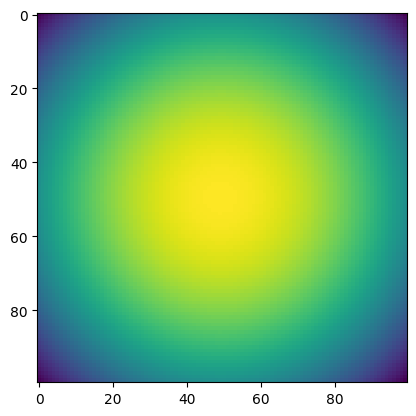

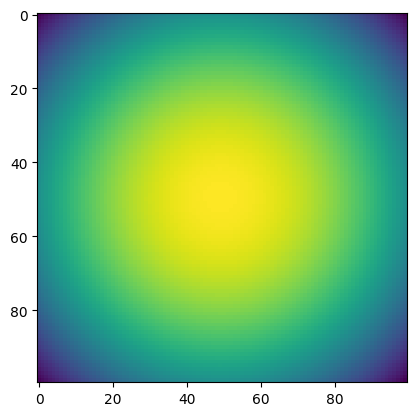

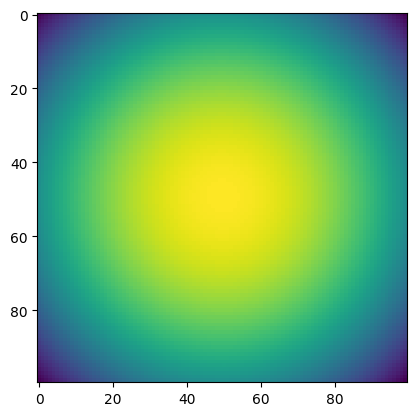

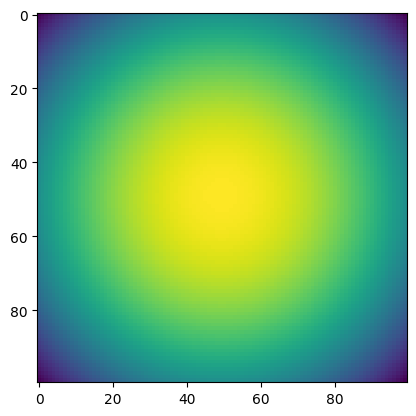

8100 0.14541698 time: 0.0008494853973388672
8200 0.120227896 time: 0.0008466243743896484
8300 0.13029529 time: 0.0008428096771240234
8400 0.12929809 time: 0.0008432865142822266
8500 0.14537768 time: 0.0008337497711181641
8600 0.12293336 time: 0.0008423328399658203
8700 0.14055018 time: 0.0008451938629150391
8800 0.12217414 time: 0.0008432865142822266
8900 0.12360114 time: 0.0008528232574462891
9000 0.13207605 time: 0.0008356571197509766


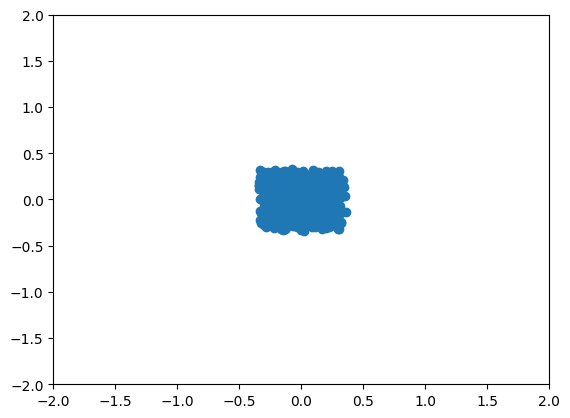

TEST 9000 logpx 0.96997875


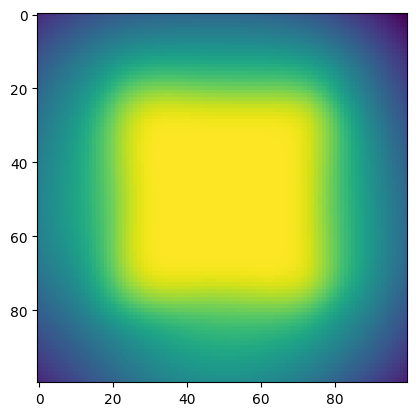

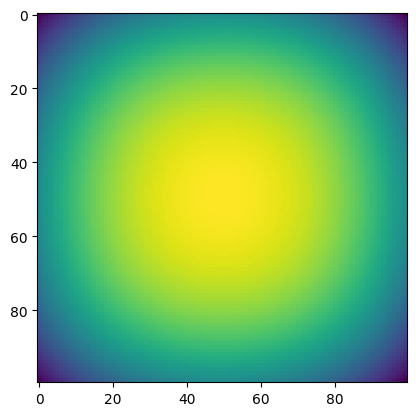

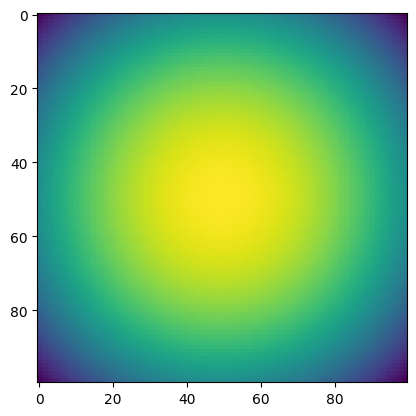

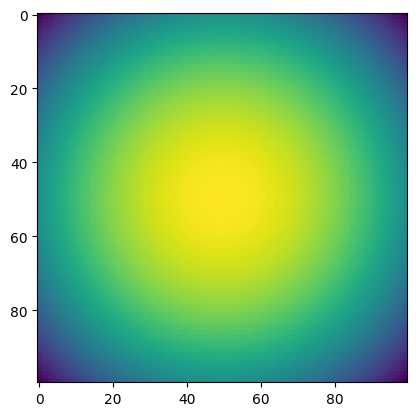

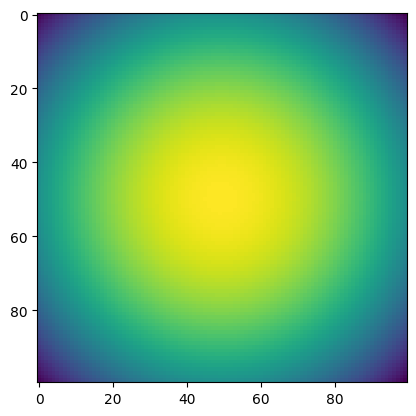

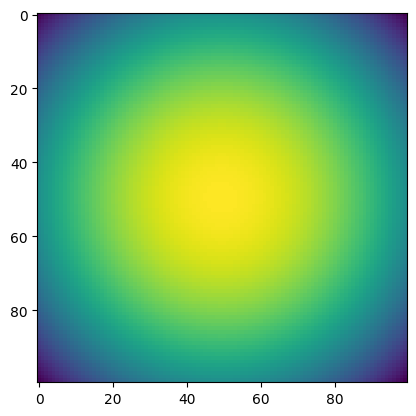

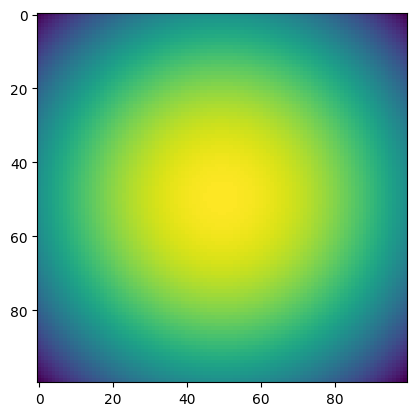

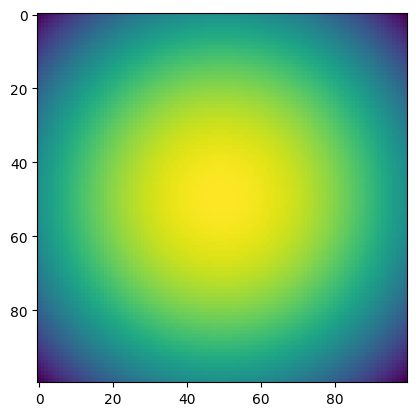

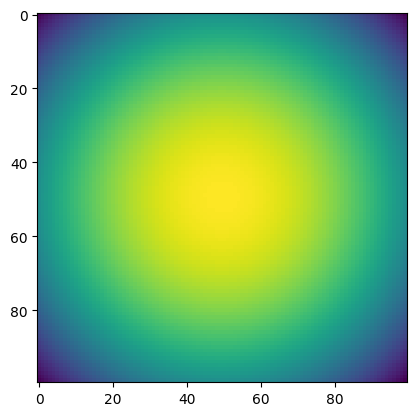

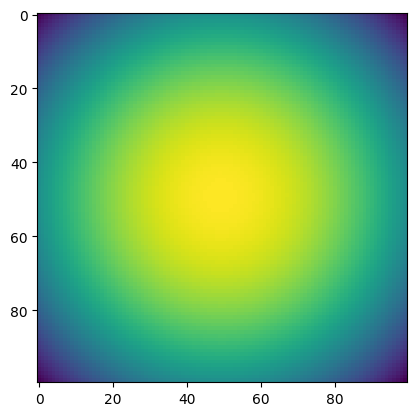

9100 0.121006735 time: 0.0008437633514404297
9200 0.11930263 time: 0.0008699893951416016
9300 0.14041619 time: 0.0008637905120849609
9400 0.13182925 time: 0.0008449554443359375
9500 0.14122131 time: 0.0008428096771240234
9600 0.121381916 time: 0.0008399486541748047
9700 0.12630755 time: 0.0008375644683837891
9800 0.12197456 time: 0.0008375644683837891
9900 0.13182753 time: 0.0008404254913330078
10000 0.1207698 time: 0.0008347034454345703


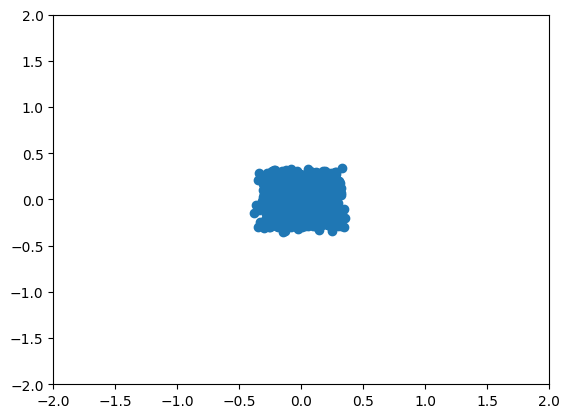

TEST 10000 logpx 1.0556201


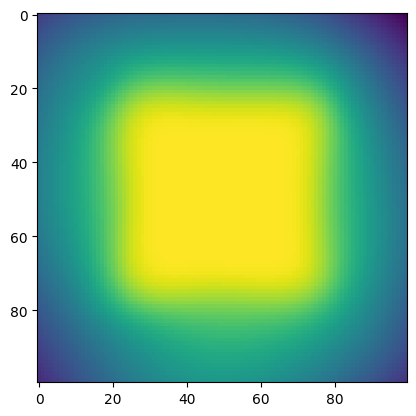

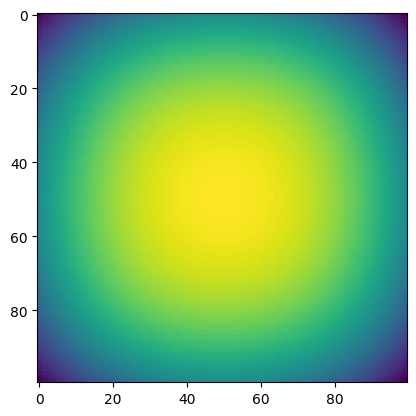

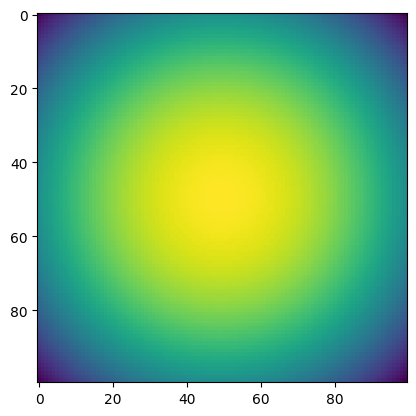

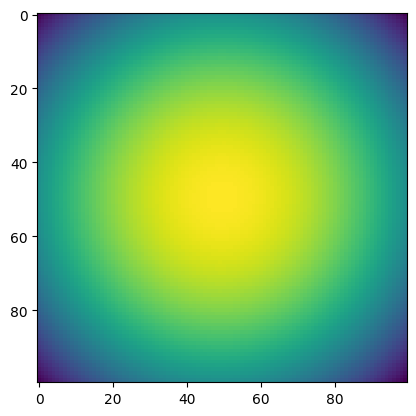

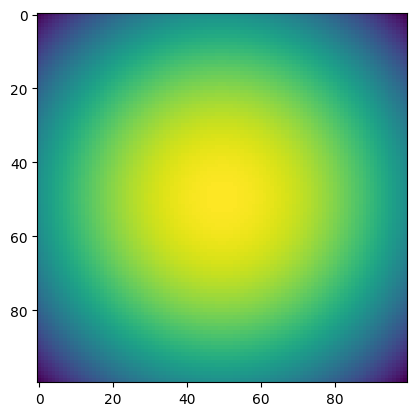

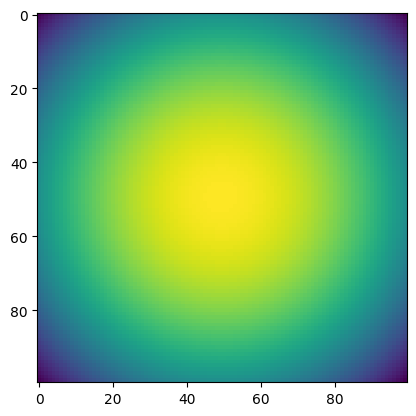

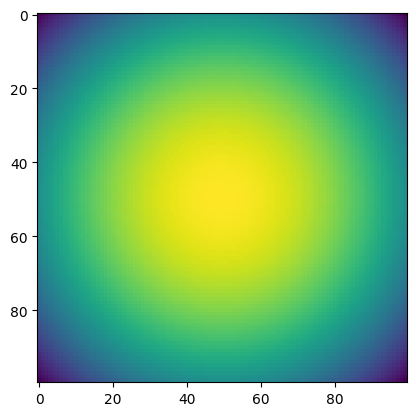

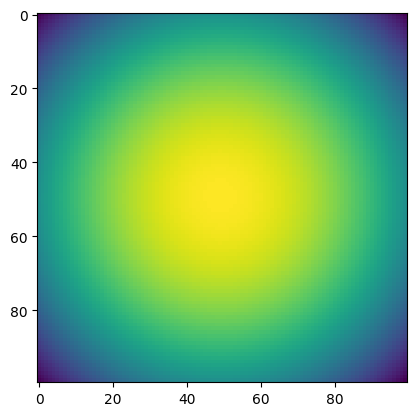

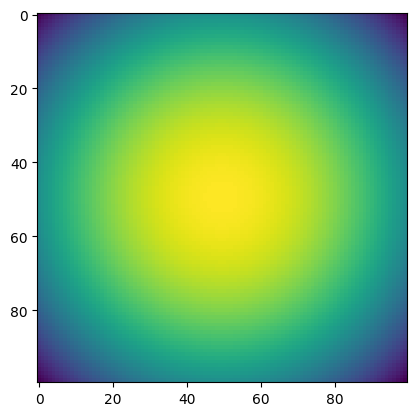

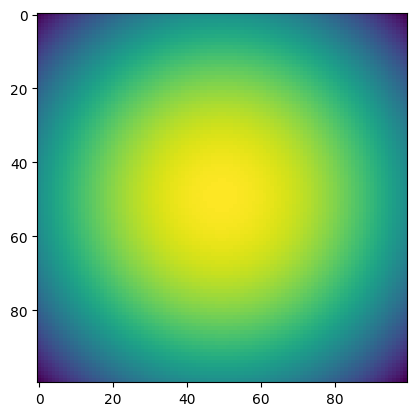

10100 0.13726045 time: 0.0008542537689208984
10200 0.14826965 time: 0.0008516311645507812
10300 0.12317205 time: 0.0008535385131835938
10400 0.13469496 time: 0.0008845329284667969
10500 0.11720344 time: 0.0008637905120849609
10600 0.14270052 time: 0.0008361339569091797
10700 0.117897 time: 0.0008435249328613281
10800 0.121109076 time: 0.0008409023284912109
10900 0.11890409 time: 0.0008447170257568359
11000 0.13873608 time: 0.0008366107940673828


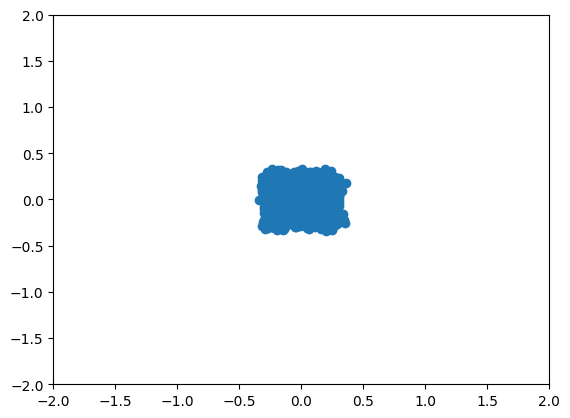

TEST 11000 logpx 1.0323


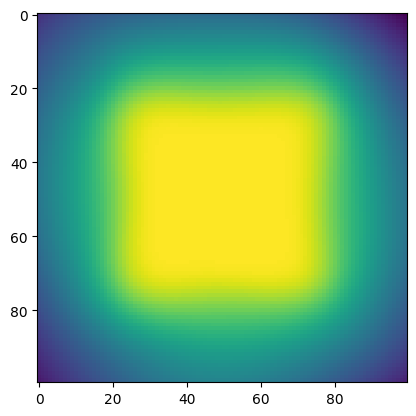

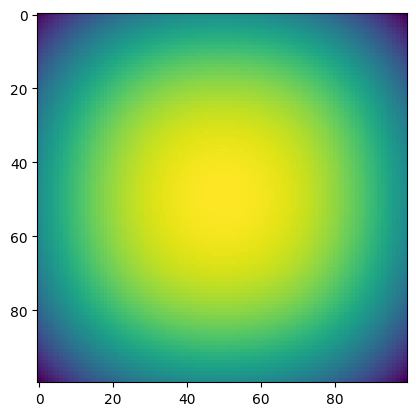

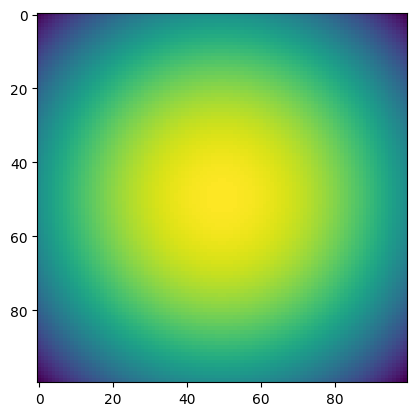

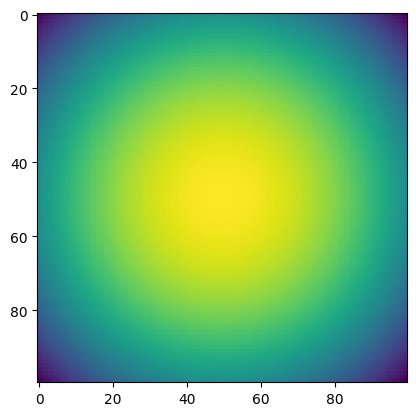

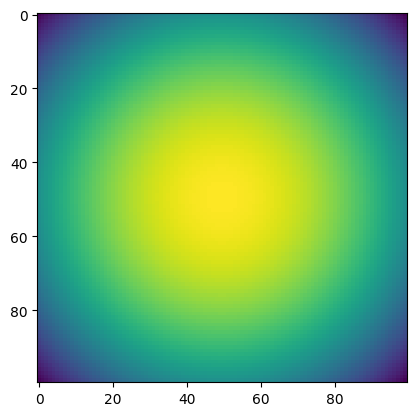

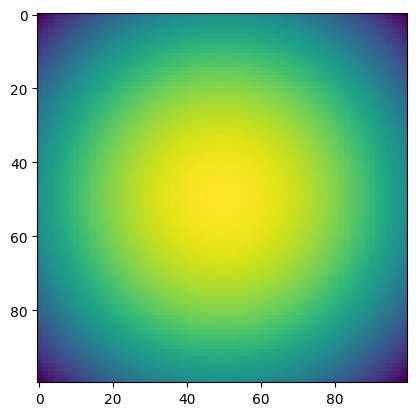

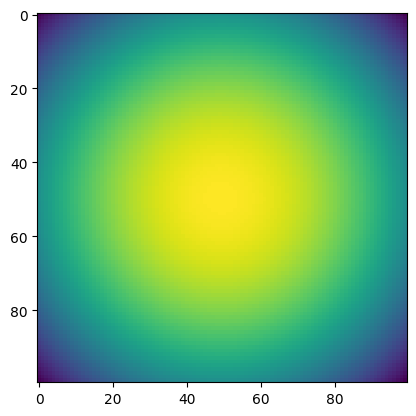

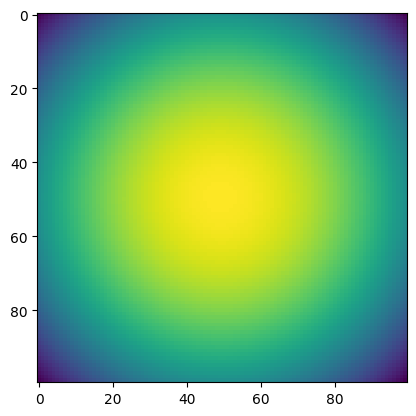

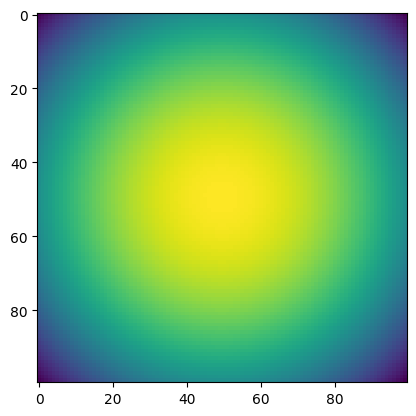

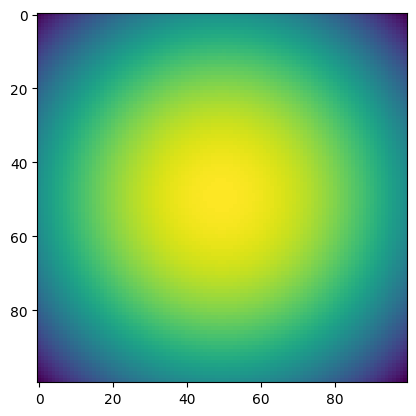

11100 0.10951472 time: 0.0008342266082763672
11200 0.13082018 time: 0.0008533000946044922
11300 0.122387454 time: 0.0008487701416015625
11400 0.11662458 time: 0.0008423328399658203
11500 0.14169079 time: 0.0008494853973388672
11600 0.10886898 time: 0.0008413791656494141
11700 0.12597416 time: 0.0013892650604248047
11800 0.131573 time: 0.0008511543273925781
11900 0.13626991 time: 0.0008478164672851562
12000 0.13236713 time: 0.0008387565612792969


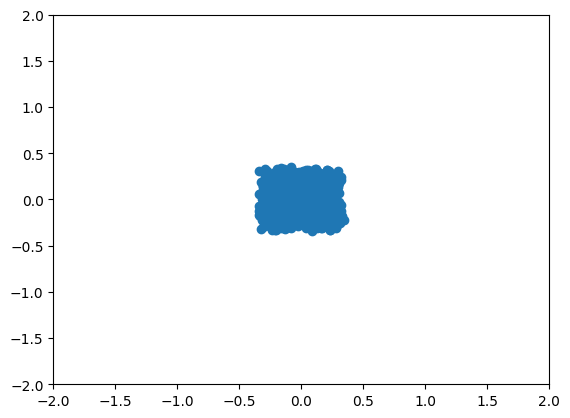

TEST 12000 logpx 0.9842373


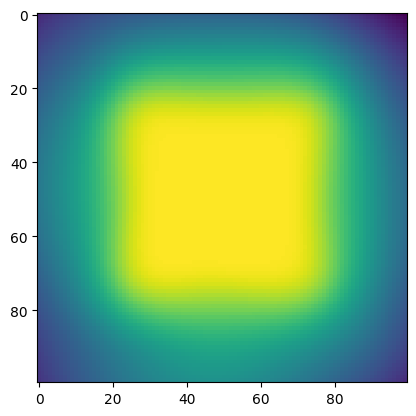

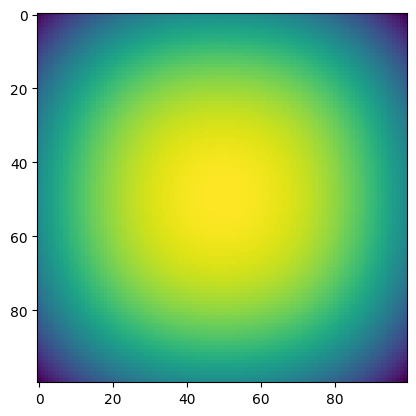

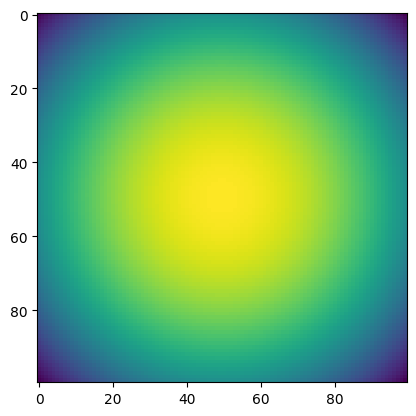

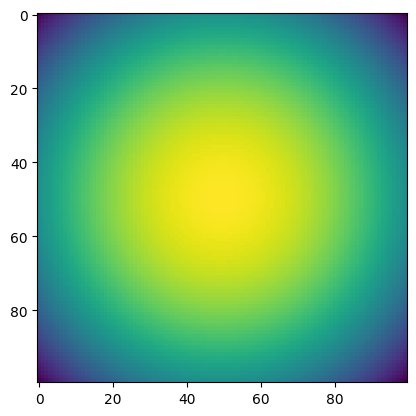

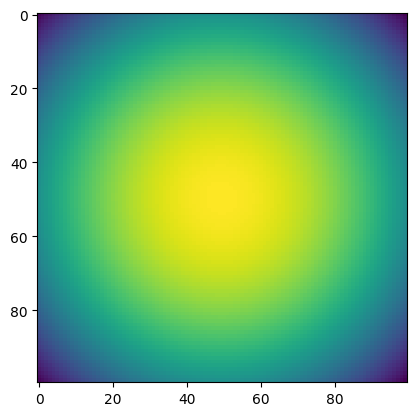

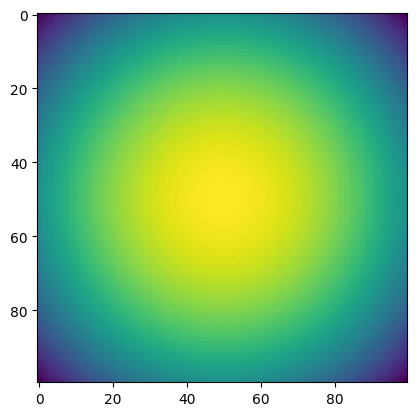

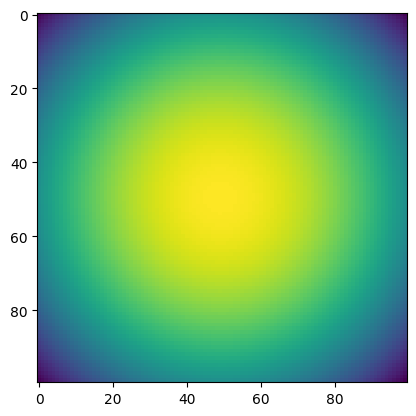

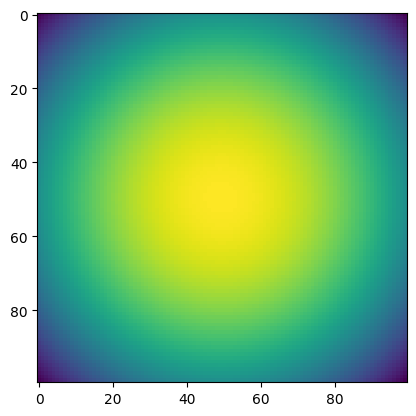

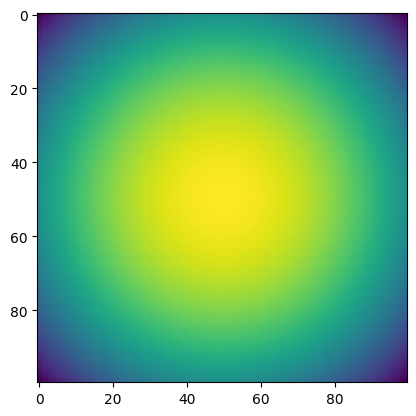

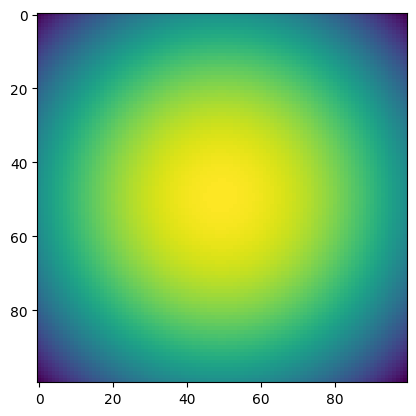

12100 0.12735789 time: 0.0008356571197509766
12200 0.15331219 time: 0.0008351802825927734
12300 0.14055793 time: 0.0008344650268554688
12400 0.13018937 time: 0.0008356571197509766
12500 0.13355653 time: 0.0008361339569091797
12600 0.12102285 time: 0.0008404254913330078
12700 0.14151254 time: 0.0008242130279541016
12800 0.11405375 time: 0.0008356571197509766
12900 0.13893192 time: 0.0008540153503417969
13000 0.1184646 time: 0.0008530616760253906


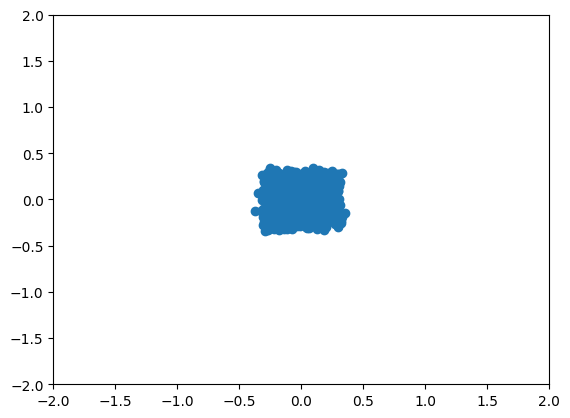

TEST 13000 logpx 1.0327398


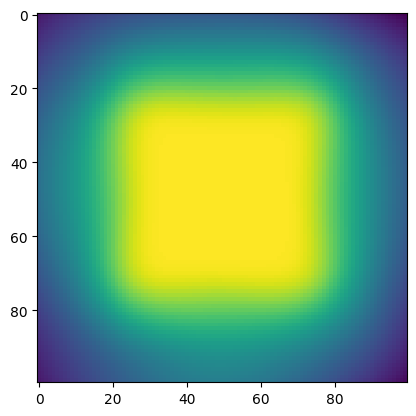

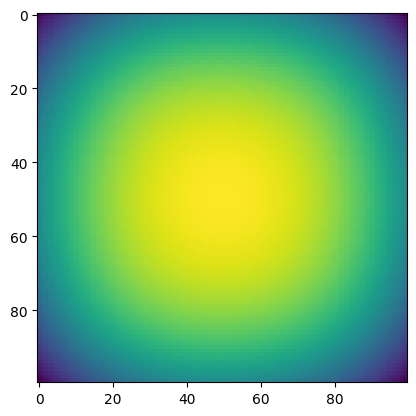

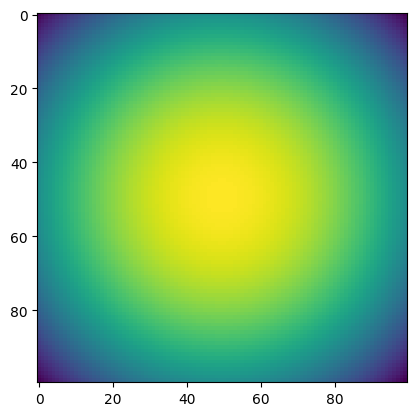

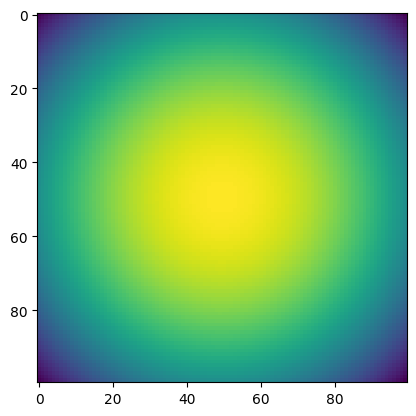

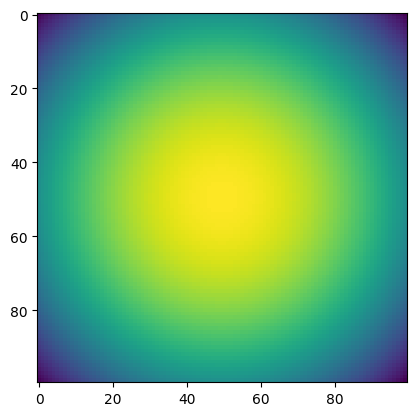

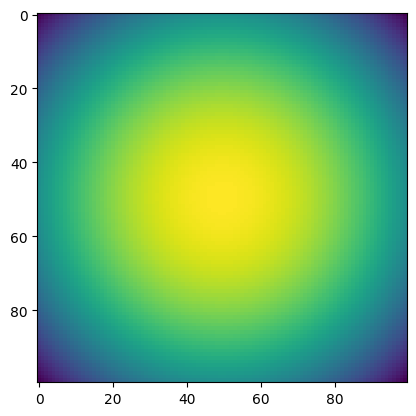

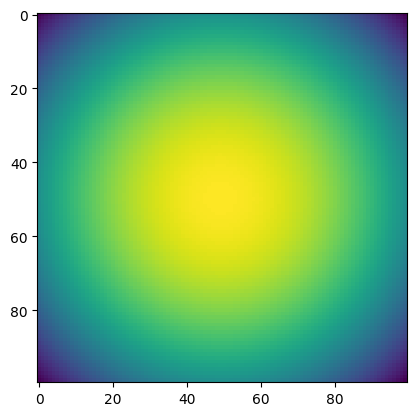

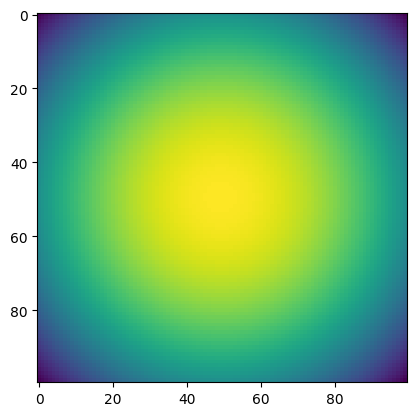

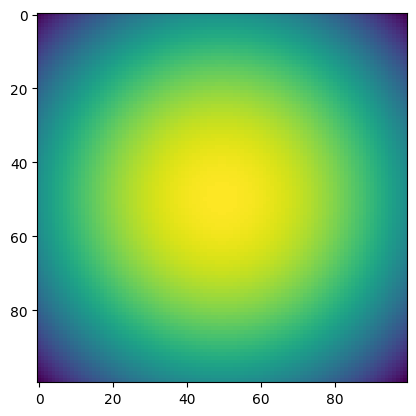

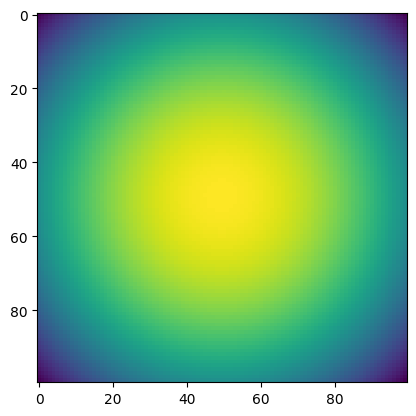

13100 0.13697143 time: 0.0008423328399658203
13200 0.122078866 time: 0.0008432865142822266
13300 0.12738495 time: 0.0008361339569091797
13400 0.12826885 time: 0.0008401870727539062
13500 0.14076157 time: 0.0008339881896972656
13600 0.14062494 time: 0.0008475780487060547
13700 0.11851163 time: 0.000827789306640625
13800 0.12508458 time: 0.0008351802825927734
13900 0.12762567 time: 0.0008311271667480469
14000 0.14689115 time: 0.0008449554443359375


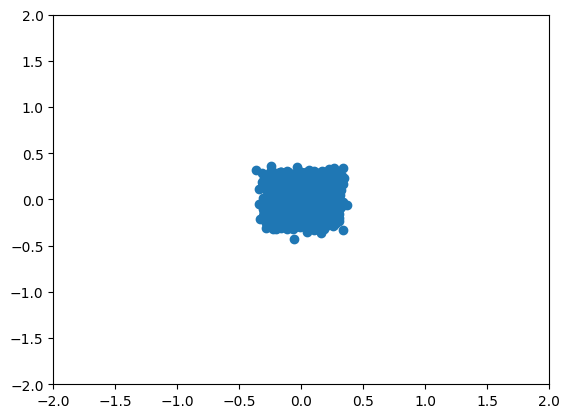

TEST 14000 logpx 0.999367


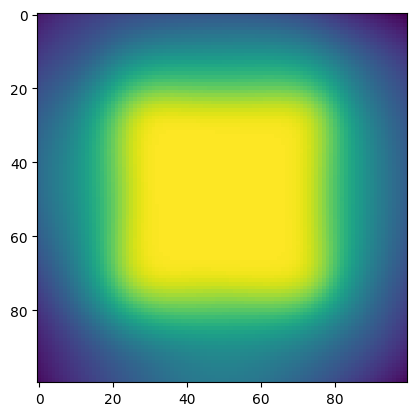

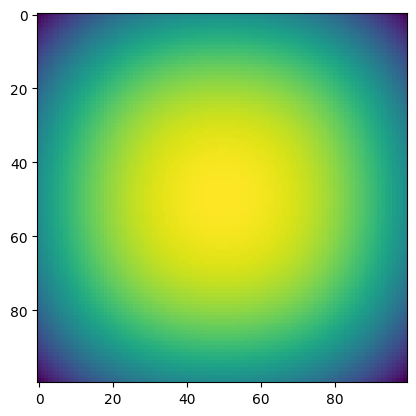

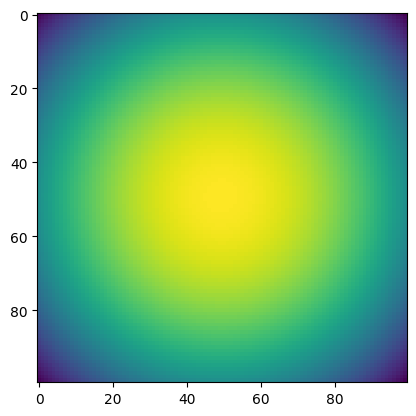

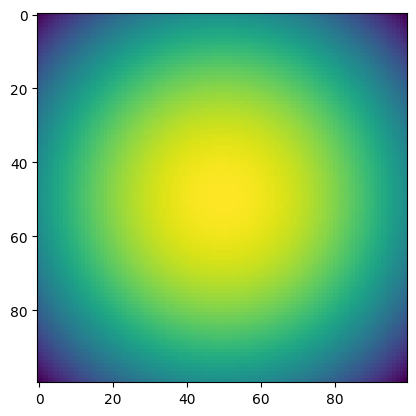

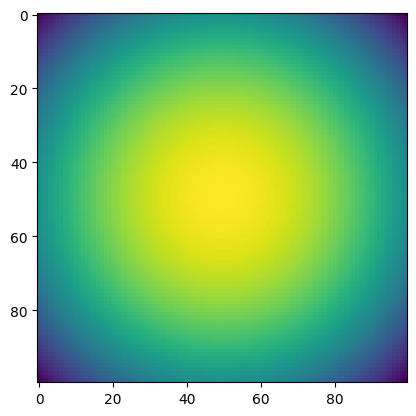

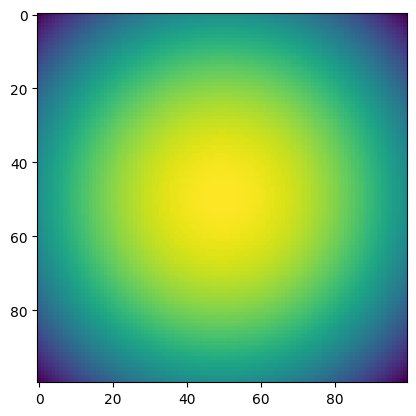

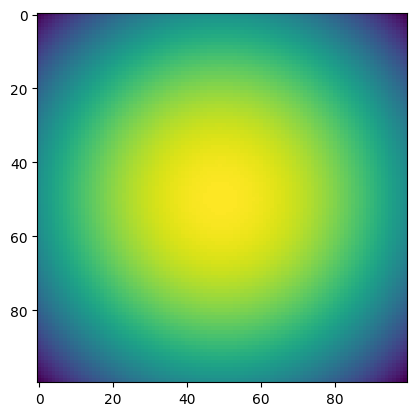

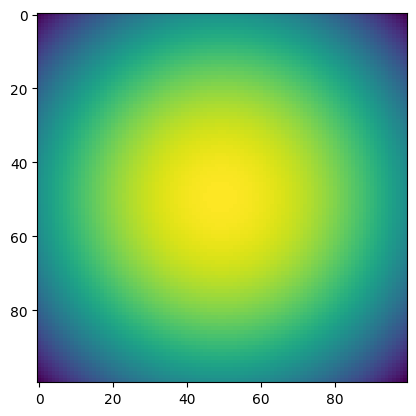

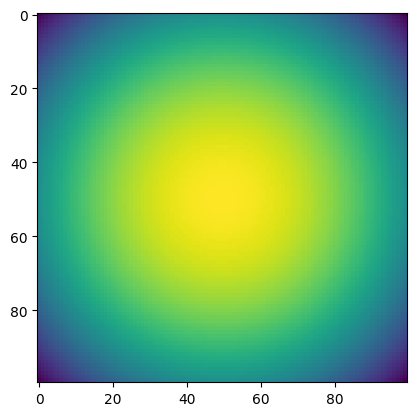

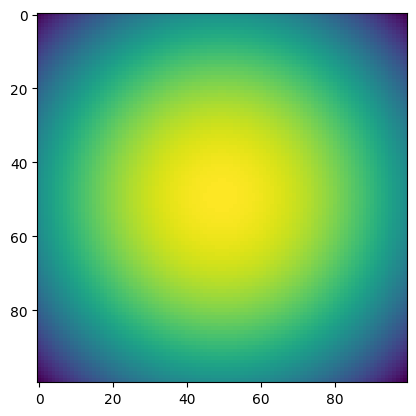

14100 0.12857725 time: 0.0008428096771240234
14200 0.14130662 time: 0.0008370876312255859
14300 0.1414322 time: 0.0008530616760253906
14400 0.11260824 time: 0.0008370876312255859
14500 0.12986645 time: 0.0008411407470703125
14600 0.13955668 time: 0.0008459091186523438
14700 0.13180766 time: 0.0008709430694580078
14800 0.14622779 time: 0.0008475780487060547
14900 0.14254248 time: 0.0008389949798583984
15000 0.12859751 time: 0.0008409023284912109


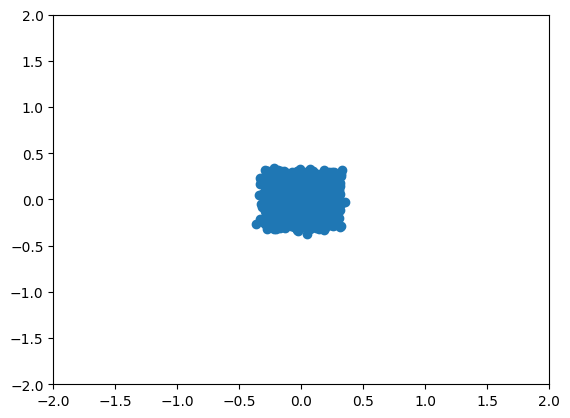

TEST 15000 logpx 1.0164353


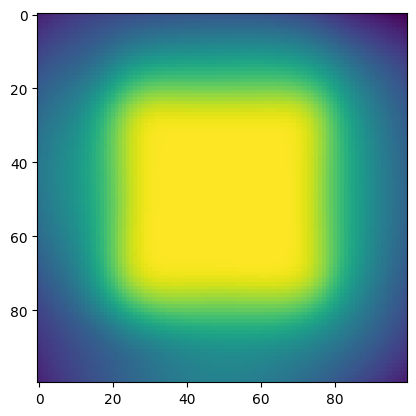

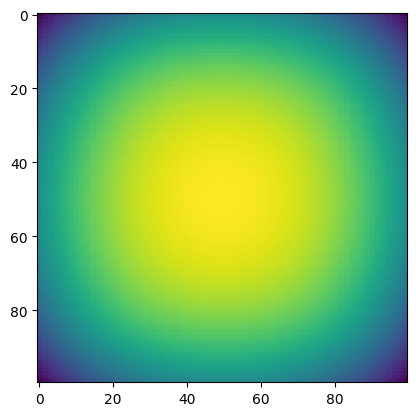

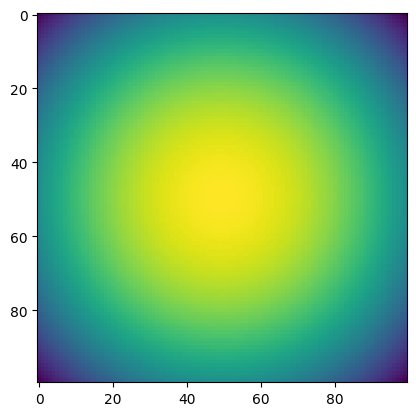

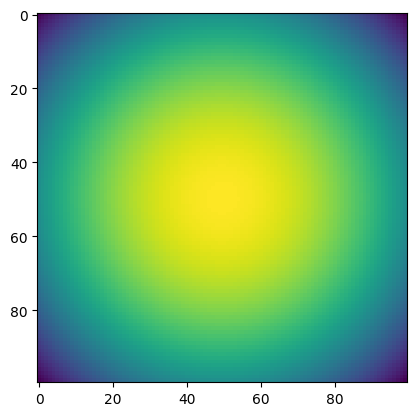

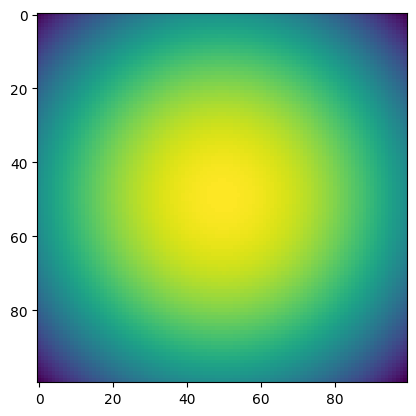

...

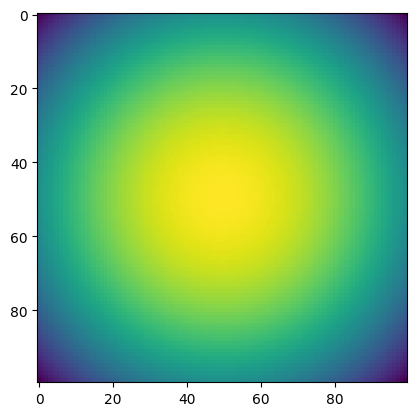

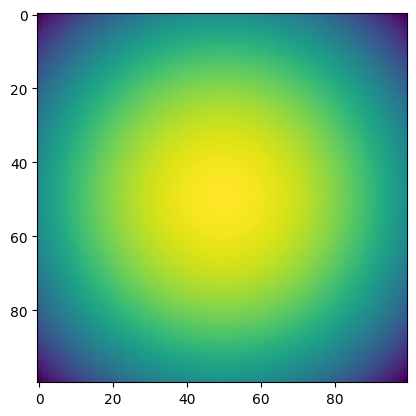

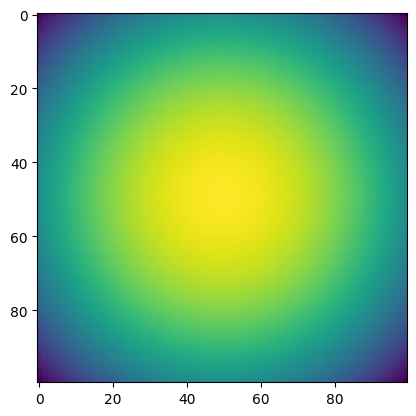

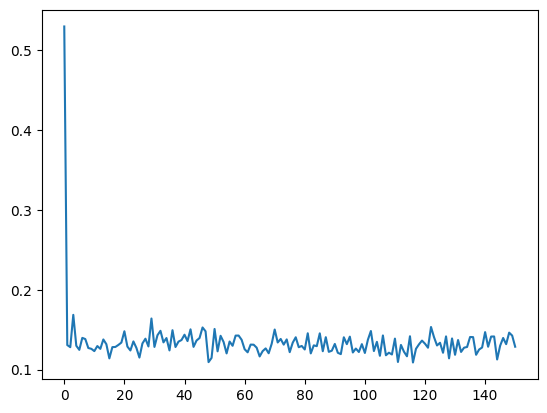

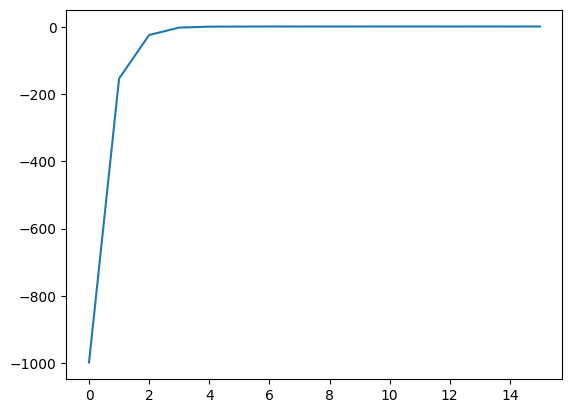

In [37]:
batch_size = 1000
data_dim = 2
num_steps = 15001

EMA = .999

n_steps = 100
net_params = {"n_layers": 4,
              "h_dim": 128,
              "emb_dim": 32}

def forward_fn():
  net = ResnetDiffusionModel(n_steps=n_steps, n_layers=4, x_dim=data_dim, h_dim=128, emb_dim=32)

  if ebm:
    net = EBMDiffusionModel(net)

  ddpm = PortableDiffusionModel(data_dim, n_steps, net, var_type="beta_forward")

  def logp_unnorm(x, t):
    scale_e = ddpm.energy_scale(-2 - t)
    t = jnp.ones((x.shape[0],), dtype=jnp.int32) * t
    return -net.neg_logp_unnorm(x, t) * scale_e

  def _logpx(x):
    return ddpm.logpx(x)["logpx"]
  return ddpm.loss, (ddpm.loss, ddpm.sample, _logpx, logp_unnorm)

forward = hk.multi_transform(forward_fn)
rng_seq = hk.PRNGSequence(0)

xr = [-.75, .75]
yr = [-.75, .75]


def plot_samples(x):
  plt.scatter(x[:, 0], x[:, 1])
  plt.xlim(-2, 2)
  plt.ylim(-2, 2)

def dist_show_2d(fn, xr, yr):
    nticks = 100
    x, y = np.meshgrid(np.linspace(xr[0], xr[1], nticks), np.linspace(yr[0], yr[1], nticks))
    coord = np.stack([x, y], axis=-1).reshape((-1, 2))
    heatmap = fn(coord).reshape((nticks, nticks))
    plt.imshow(heatmap)

# load data
dataset_energy, dataset_sample = toy_box(scale=0.3)
x = dataset_sample(batch_size)

plot_samples(x)
plt.show()
x = x.reshape(x.shape[0], -1)


params = forward.init(next(rng_seq), x)
loss_fn, sample_fn, logpx_fn, logp_unnorm_fn = forward.apply
param_count = sum(x.size for x in jax.tree_leaves(params))
for k, v in jax.tree_map(lambda x: x.shape, params).items():
  print(k, v)
print("Model has {} params".format(param_count))


opt = optax.adam(1e-3)
opt_state = opt.init(params)

sample_fn = jax.jit(sample_fn, static_argnums=2)
logpx_fn = jax.jit(logpx_fn)

logp_unnorm_fn = jax.jit(logp_unnorm_fn)

@jax.jit
def mean_loss_fn(params, rng, x):
  loss = loss_fn(params, rng, x)
  return loss.mean()

@jax.jit
def update(params, opt_state, rng, x):
  loss, grad = jax.value_and_grad(mean_loss_fn)(params, rng, x)

  updates, opt_state = opt.update(grad, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss, new_params, opt_state

ema_params = params
losses = []
test_logpx = []
itr = 0

for itr in range(num_steps):
  x = dataset_sample(batch_size)

  x = x.reshape(x.shape[0], -1)
  start_time = time.time()
  loss, params, opt_state = update(params, opt_state, next(rng_seq), x)
  duration_update = time.time() - start_time
  ema_params = jax.tree_map(lambda e, p: e * EMA + p * (1 - EMA), ema_params, params)

  if itr % 100 == 0:
    print(itr, loss, "time:", duration_update)
    losses.append(loss)
  if itr % 1000 == 0:
    x_samp = sample_fn(ema_params, next(rng_seq), batch_size)
    plot_samples(x_samp)
    plt.show()
    logpx = logpx_fn(ema_params, next(rng_seq), x).mean()
    print("TEST", itr, 'logpx', logpx)
    test_logpx.append(logpx)

    if ebm:
      for t in range(10):
        dist_show_2d(lambda x: logp_unnorm_fn(ema_params, next(rng_seq), x, 10*t), xr=xr, yr=yr)
        plt.show()

plt.plot(losses)
plt.show()
plt.plot(test_logpx)

small_box_params = ema_params

In [38]:
params = {}

for k, v in large_box_params.items():
  params[k] = v

for k, v in small_box_params.items():
  k = k.replace('resnet_diffusion_model/', 'resnet_diffusion_model_1/')
  params[k] = v

/tmp/ipykernel_1365333/1885335867.py:265: UserWarning: Explicitly requested dtype <class 'jax.numpy.int64'> requested in ones is not available, and will be truncated to dtype int32. To enable more dtypes, set the jax_enable_x64 configuration option or the JAX_ENABLE_X64 shell environment variable. See https://github.com/google/jax#current-gotchas for more.
  t = jnp.ones((n,), dtype=jnp.int64) * j


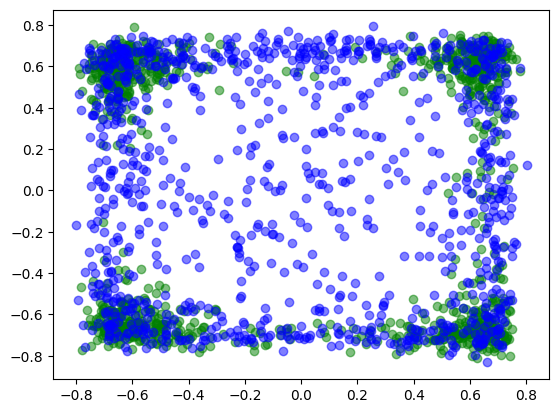

In [39]:
# Sampling from negation of distributions
import matplotlib.pyplot as plt

dim = 2
n_mode = 4
std = .05
init_std = 1.
init_mu = 0.
n_steps = 10
damping = .5
mass_diag_sqrt = 1.
num_leapfrog = 3
samples_per_step = 10
uha_step_size = .03
ula_step_size = .001

batch_size = 1000

rng_seq = hk.PRNGSequence(0)

means = jax.random.normal(next(rng_seq), (n_mode, dim))
comp_dists = distrax.MultivariateNormalDiag(means, jnp.ones_like(means) * std)
pi = distrax.Categorical(logits=jnp.zeros((n_mode,)))
target_dist = distrax.MixtureSameFamily(pi, comp_dists)
initial_dist = distrax.MultivariateNormalDiag(means[0] * 0 + init_mu, init_std * jnp.ones_like(means[0]))


x_init = initial_dist.sample(seed=next(rng_seq), sample_shape=(batch_size,))
logZs = []
n_stepss = [100]

def gradient_function(x, t):
  t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
  return -1 *dual_negation_gradient_fn(params, next(rng_seq), x, t)

if ebm:
  def energy_function(x, t):
    t = n_steps - jnp.ones((x.shape[0],), dtype=jnp.int32) * t - 1
    return -1 *dual_negation_energy_fn(params, next(rng_seq), x, t)

for n_steps in n_stepss:
  ula_step_sizes = jnp.ones((n_steps,)) * ula_step_size
  uha_step_sizes = jnp.ones((n_steps,)) * uha_step_size

  betas = jnp.linspace(0., 1., n_steps)

  def target_function(x, i):
    #print(x.shape)
    beta = betas[i]
    init_lp = initial_dist.log_prob(x)
    targ_lp = target_dist.log_prob(x)
    return beta * targ_lp + (1 - beta) * init_lp

  # Choose the sampler to use
  # sampler = AnnealedULASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function)
  # sampler = AnnealedMALASampler(n_steps, samples_per_step, ula_step_sizes, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)
  # sampler = AnnealedUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function)
  sampler = AnnealedMUHASampler(n_steps, samples_per_step, uha_step_sizes, damping, mass_diag_sqrt, num_leapfrog, initial_dist, target_distribution=None, gradient_function=gradient_function, energy_function=energy_function)

  # Generate sample with MCMC
  x_samp, logw, accept = sampler.sample(next(rng_seq), batch_size)
  rng_seq = hk.PRNGSequence(1)

  # Samples generated by adding score function
  grad_sample = dual_negation_sample_fn(params, next(rng_seq), batch_size, jnp.inf)

  # Samples from MCMC
  plt.scatter(x_samp[:, 0], x_samp[:, 1], color='green', alpha=.5)

  # Samples from adding score
  plt.scatter(grad_sample[:, 0], grad_sample[:, 1], color='blue', alpha=.5)

  plt.show()

In [40]:
def gen_plot_nice(pts):
    plt.scatter(pts[:, 0], pts[:, 1], c='b')
    ax = plt.gca()

    plt.xlim(-1, 1)
    plt.ylim(-1, 1)

    for axis in ['top', 'bottom', 'left', 'right']:
        ax.spines[axis].set_linewidth(1.5)

    ax.set_xticks([], [])
    ax.set_yticks([], [])